# Chapter 9: Unsupervised Learning Techniques

## Complete Implementation and Analysis

**Based on: Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow (2nd Edition)**

---

### Table of Contents:
1. [Introduction to Unsupervised Learning](#introduction)
2. [Clustering](#clustering)
   - [K-Means Algorithm](#kmeans)
   - [Applications of K-Means](#kmeans-applications)
   - [DBSCAN](#dbscan)
   - [Other Clustering Algorithms](#other-clustering)
3. [Gaussian Mixtures](#gaussian-mixtures)
4. [Anomaly Detection](#anomaly-detection)
5. [Exercises and Solutions](#exercises)

---

In [42]:
# Google Colab Setup and Required Imports
# This cell sets up the environment for Google Colab with all necessary libraries

import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs, make_moons, load_digits, fetch_olivetti_faces
from sklearn.cluster import KMeans, DBSCAN, MiniBatchKMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.covariance import EllipticEnvelope
from sklearn.neighbors import LocalOutlierFactor
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('default')
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12

# For reproducibility
np.random.seed(42)

print("Environment setup complete!")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")
print(f"Matplotlib version: {plt.matplotlib.__version__}")

Environment setup complete!
NumPy version: 2.0.2
Pandas version: 2.2.2
Matplotlib version: 3.10.0


# 1. Introduction to Unsupervised Learning <a id="introduction"></a>

## Theoretical Foundation

Unsupervised learning represents a fundamental paradigm in machine learning where we work with data that lacks explicit target labels. As Yann LeCun famously stated: *"if intelligence was a cake, unsupervised learning would be the cake, supervised learning would be the icing on the cake, and reinforcement learning would be the cherry on the cake."*

### Mathematical Framework

In unsupervised learning, we have:
- **Input data**: $\mathbf{X} = \{\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_m\}$ where $\mathbf{x}_i \in \mathbb{R}^n$
- **No target labels**: Unlike supervised learning, we don't have $\mathbf{y} = \{y_1, y_2, \ldots, y_m\}$
- **Goal**: Discover hidden patterns, structures, or representations in the data

### Key Unsupervised Learning Tasks

1. **Clustering**: Grouping similar instances
   $$\text{Partition } \mathbf{X} \text{ into } k \text{ clusters } C_1, C_2, \ldots, C_k$$

2. **Anomaly Detection**: Identifying outliers
   $$\text{Find } \mathbf{x}_i \text{ such that } p(\mathbf{x}_i) < \epsilon$$

3. **Density Estimation**: Learning probability distributions
   $$\text{Estimate } p(\mathbf{x}) \text{ from samples}$$

### Applications in Real-World Scenarios

Consider a manufacturing scenario where you have thousands of product images but no labels indicating which are defective. Traditional supervised learning would require expensive manual labeling by experts. Unsupervised learning can:

- **Automatically cluster** similar-looking products
- **Detect anomalies** that might indicate defects
- **Reduce dimensionality** for efficient processing

---

# 2. Clustering <a id="clustering"></a>

## Theoretical Overview

Clustering is the task of partitioning a dataset into groups (clusters) such that instances within the same cluster are more similar to each other than to instances in other clusters.

### Mathematical Definition

Given a dataset $\mathbf{X} = \{\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_m\}$, clustering aims to find a partition $\{C_1, C_2, \ldots, C_k\}$ such that:

1. **Completeness**: $\bigcup_{i=1}^{k} C_i = \mathbf{X}$
2. **Non-overlapping**: $C_i \cap C_j = \emptyset$ for $i \neq j$
3. **Non-empty**: $C_i \neq \emptyset$ for all $i$

### Clustering Applications

1. **Customer Segmentation**: Group customers by purchasing behavior
2. **Image Segmentation**: Partition pixels by color similarity
3. **Gene Sequencing**: Group genes by expression patterns
4. **Market Research**: Identify consumer segments
5. **Social Network Analysis**: Detect communities

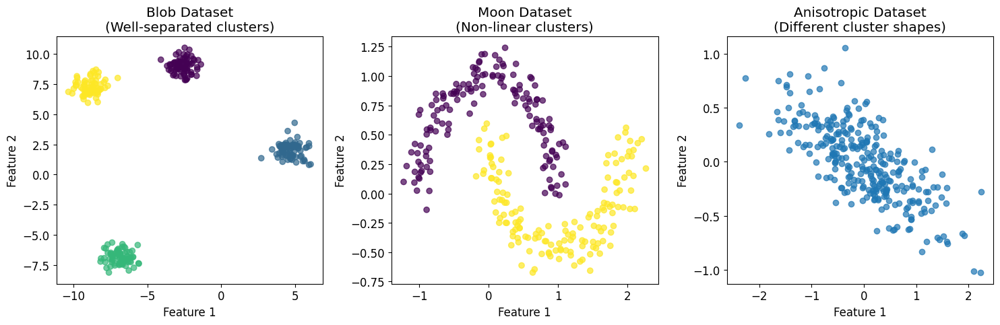

Datasets created:
Blob dataset shape: (300, 2)
Moon dataset shape: (300, 2)
Anisotropic dataset shape: (300, 2)


In [43]:
# Generate demonstration datasets for clustering
# This cell creates various synthetic datasets to illustrate different clustering scenarios

# Create blob dataset (well-separated clusters)
X_blobs, y_blobs = make_blobs(n_samples=300, centers=4, cluster_std=0.6,
                              random_state=42, center_box=(-10.0, 10.0))

# Create moon dataset (non-linear separable clusters)
X_moons, y_moons = make_moons(n_samples=300, noise=0.1, random_state=42)

# Create anisotropic dataset (different cluster shapes)
X_aniso = np.random.randn(300, 2)
transformation = np.array([[0.8, -0.2], [-0.2, 0.3]])
X_aniso = np.dot(X_aniso, transformation)

# Visualize the datasets
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot blob dataset
axes[0].scatter(X_blobs[:, 0], X_blobs[:, 1], c=y_blobs, cmap='viridis', alpha=0.7)
axes[0].set_title('Blob Dataset\n(Well-separated clusters)')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')

# Plot moon dataset
axes[1].scatter(X_moons[:, 0], X_moons[:, 1], c=y_moons, cmap='viridis', alpha=0.7)
axes[1].set_title('Moon Dataset\n(Non-linear clusters)')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2')

# Plot anisotropic dataset
axes[2].scatter(X_aniso[:, 0], X_aniso[:, 1], alpha=0.7)
axes[2].set_title('Anisotropic Dataset\n(Different cluster shapes)')
axes[2].set_xlabel('Feature 1')
axes[2].set_ylabel('Feature 2')

plt.tight_layout()
plt.show()

print("Datasets created:")
print(f"Blob dataset shape: {X_blobs.shape}")
print(f"Moon dataset shape: {X_moons.shape}")
print(f"Anisotropic dataset shape: {X_aniso.shape}")

## 2.1 K-Means Algorithm <a id="kmeans"></a>

### Theoretical Foundation

K-Means is a centroid-based clustering algorithm that partitions data into $k$ clusters by minimizing the within-cluster sum of squares (WCSS).

### Mathematical Formulation

**Objective Function (Inertia)**:
$$J = \sum_{i=1}^{m} \sum_{j=1}^{k} w_{ij} \|\mathbf{x}_i - \boldsymbol{\mu}_j\|^2$$

Where:
- $w_{ij} = 1$ if $\mathbf{x}_i$ belongs to cluster $j$, else $0$
- $\boldsymbol{\mu}_j$ is the centroid of cluster $j$
- $\|\cdot\|^2$ is the squared Euclidean distance

**Centroid Update Rule**:
$$\boldsymbol{\mu}_j = \frac{1}{|C_j|} \sum_{\mathbf{x}_i \in C_j} \mathbf{x}_i$$

### Algorithm Steps

1. **Initialize**: Randomly place $k$ centroids $\boldsymbol{\mu}_1, \boldsymbol{\mu}_2, \ldots, \boldsymbol{\mu}_k$
2. **Assignment**: Assign each point to nearest centroid
   $$c_i = \arg\min_j \|\mathbf{x}_i - \boldsymbol{\mu}_j\|^2$$
3. **Update**: Recalculate centroids
4. **Repeat** steps 2-3 until convergence

### Convergence Properties

- **Guaranteed convergence**: The algorithm always converges in finite steps
- **Local minimum**: May converge to suboptimal solution
- **Computational complexity**: $O(mkn \cdot t)$ where $t$ is number of iterations

### Voronoi Tessellation

K-Means creates decision boundaries that form a Voronoi tessellation, where each region contains all points closer to one centroid than any other.

K-Means Algorithm Visualization
Converged after 3 iterations


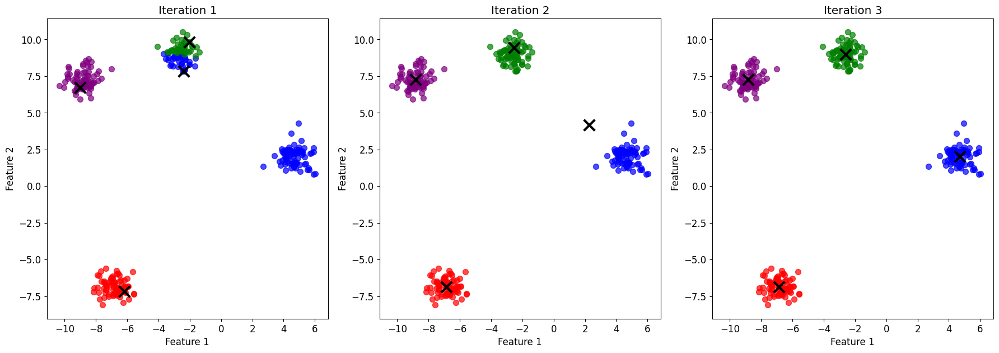


Final centroids:
Cluster 0: (-6.85, -6.85)
Cluster 1: (4.69, 2.01)
Cluster 2: (-2.61, 8.99)
Cluster 3: (-8.83, 7.24)


In [44]:
# Comprehensive K-Means Implementation and Analysis
# This cell demonstrates the K-Means algorithm with detailed analysis

def plot_kmeans_steps(X, k=3, max_iters=10):
    """
    Visualize K-Means algorithm steps

    Parameters:
    X: dataset
    k: number of clusters
    max_iters: maximum iterations to show
    """
    # Initialize centroids randomly
    centroids = X[np.random.choice(X.shape[0], k, replace=False)]

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()

    colors = ['red', 'blue', 'green', 'purple', 'orange']

    for iteration in range(min(6, max_iters)):
        # Assignment step: assign each point to nearest centroid
        distances = np.sqrt(((X - centroids[:, np.newaxis])**2).sum(axis=2))
        labels = np.argmin(distances, axis=0)

        # Plot current state
        for i in range(k):
            mask = labels == i
            axes[iteration].scatter(X[mask, 0], X[mask, 1],
                                  c=colors[i], alpha=0.7, s=50)
            axes[iteration].scatter(centroids[i, 0], centroids[i, 1],
                                  c='black', marker='x', s=200, linewidths=3)

        axes[iteration].set_title(f'Iteration {iteration + 1}')
        axes[iteration].set_xlabel('Feature 1')
        axes[iteration].set_ylabel('Feature 2')

        # Update step: recalculate centroids
        new_centroids = np.array([X[labels == i].mean(axis=0) for i in range(k)])

        # Check for convergence
        if np.allclose(centroids, new_centroids):
            print(f"Converged after {iteration + 1} iterations")
            break

        centroids = new_centroids

    # Hide unused subplots
    for i in range(iteration + 1, 6):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    return centroids, labels

# Demonstrate K-Means steps
print("K-Means Algorithm Visualization")
print("=" * 40)
final_centroids, final_labels = plot_kmeans_steps(X_blobs, k=4)

print(f"\nFinal centroids:")
for i, centroid in enumerate(final_centroids):
    print(f"Cluster {i}: ({centroid[0]:.2f}, {centroid[1]:.2f})")

K-Means Results Analysis
Number of clusters: 4
Inertia (WCSS): 203.89
Number of iterations: 2
Algorithm converged: True

Cluster centers:
Cluster 0: (-2.605, 8.993)
Cluster 1: (-6.851, -6.850)
Cluster 2: (4.687, 2.014)
Cluster 3: (-8.835, 7.244)


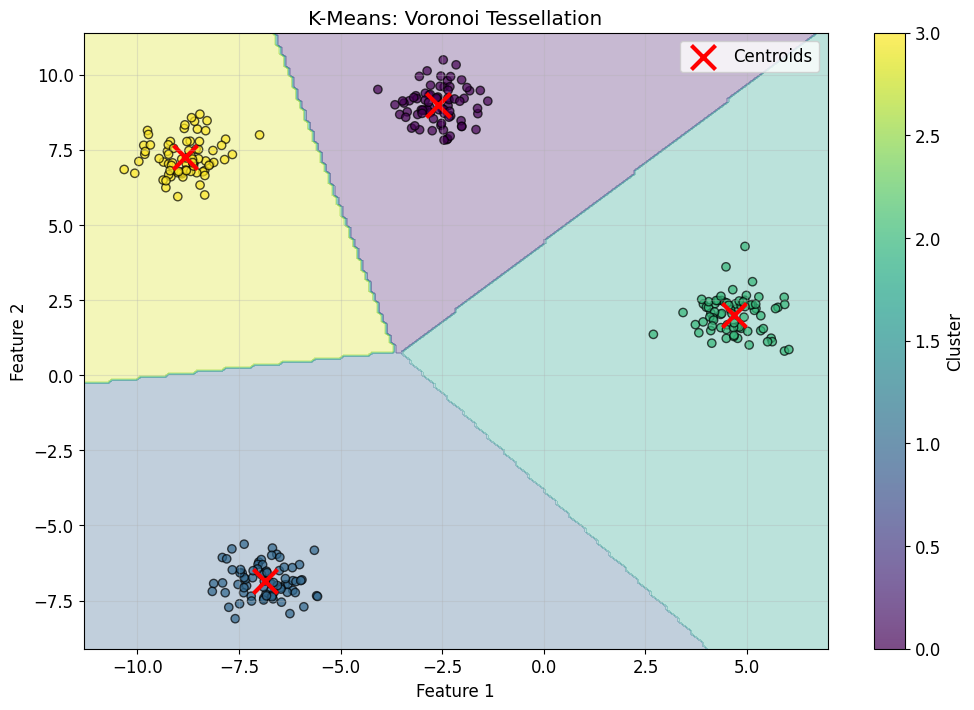


Soft Clustering Analysis
Distances from first 5 points to all centroids:
Point	Cluster 0	Cluster 1	Cluster 2	Cluster 3
------------------------------------------------------------
0	6.864		13.850		14.611		0.513
1	7.012		14.166		14.932		0.542
2	0.924		15.886		9.176		6.897
3	15.839		0.649		14.305		13.588
4	7.795		13.943		15.480		1.335

Predicted clusters for first 5 points: [3 3 0 1 3]


In [45]:
# K-Means with Scikit-Learn: Complete Implementation
# This cell demonstrates the professional implementation using scikit-learn

# Basic K-Means clustering
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
y_pred = kmeans.fit_predict(X_blobs)

# Analyze the results
print("K-Means Results Analysis")
print("=" * 30)
print(f"Number of clusters: {kmeans.n_clusters}")
print(f"Inertia (WCSS): {kmeans.inertia_:.2f}")
print(f"Number of iterations: {kmeans.n_iter_}")
print(f"Algorithm converged: {hasattr(kmeans, 'n_iter_')}")

print(f"\nCluster centers:")
for i, center in enumerate(kmeans.cluster_centers_):
    print(f"Cluster {i}: ({center[0]:.3f}, {center[1]:.3f})")

# Visualize results with decision boundaries
def plot_decision_boundaries(X, kmeans, title="K-Means Decision Boundaries"):
    """
    Plot K-Means results with Voronoi tessellation boundaries
    """
    # Create a mesh to plot the decision boundary
    h = 0.1  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # Predict cluster for each point in the mesh
    Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.figure(figsize=(12, 8))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')

    # Plot the data points
    scatter = plt.scatter(X[:, 0], X[:, 1], c=kmeans.labels_,
                         cmap='viridis', edgecolors='black', alpha=0.7)

    # Plot the centroids
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
               marker='x', s=300, linewidths=3, color='red', label='Centroids')

    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.legend()
    plt.colorbar(scatter, label='Cluster')
    plt.grid(True, alpha=0.3)
    plt.show()

plot_decision_boundaries(X_blobs, kmeans, "K-Means: Voronoi Tessellation")

# Demonstrate soft clustering (distances to centroids)
print("\nSoft Clustering Analysis")
print("=" * 25)

# Calculate distances from each point to all centroids
distances = kmeans.transform(X_blobs[:5])  # Show first 5 points
print("Distances from first 5 points to all centroids:")
print("Point\tCluster 0\tCluster 1\tCluster 2\tCluster 3")
print("-" * 60)
for i, dist in enumerate(distances):
    print(f"{i}\t{dist[0]:.3f}\t\t{dist[1]:.3f}\t\t{dist[2]:.3f}\t\t{dist[3]:.3f}")

# Show predicted clusters
print(f"\nPredicted clusters for first 5 points: {y_pred[:5]}")

### K-Means Initialization Methods

The initialization of centroids significantly affects the final clustering result. Poor initialization can lead to suboptimal local minima.

#### K-Means++ Algorithm

K-Means++ is a smart initialization method that chooses initial centroids to be far from each other:

1. **Step 1**: Choose first centroid $c^{(1)}$ uniformly at random
2. **Step 2**: For each remaining centroid $c^{(i)}$:
   - Choose $\mathbf{x}^{(i)}$ with probability proportional to $D^2(\mathbf{x}^{(i)})$
   - Where $D^2(\mathbf{x}^{(i)}) = \min_{j < i} \|\mathbf{x}^{(i)} - c^{(j)}\|^2$

**Probability Formula**:
$$P(\mathbf{x}^{(i)}) = \frac{D^2(\mathbf{x}^{(i)})}{\sum_{j=1}^{m} D^2(\mathbf{x}^{(j)})}$$

This ensures that new centroids are placed in regions far from existing ones, leading to better initial coverage.

Initialization Methods Comparison


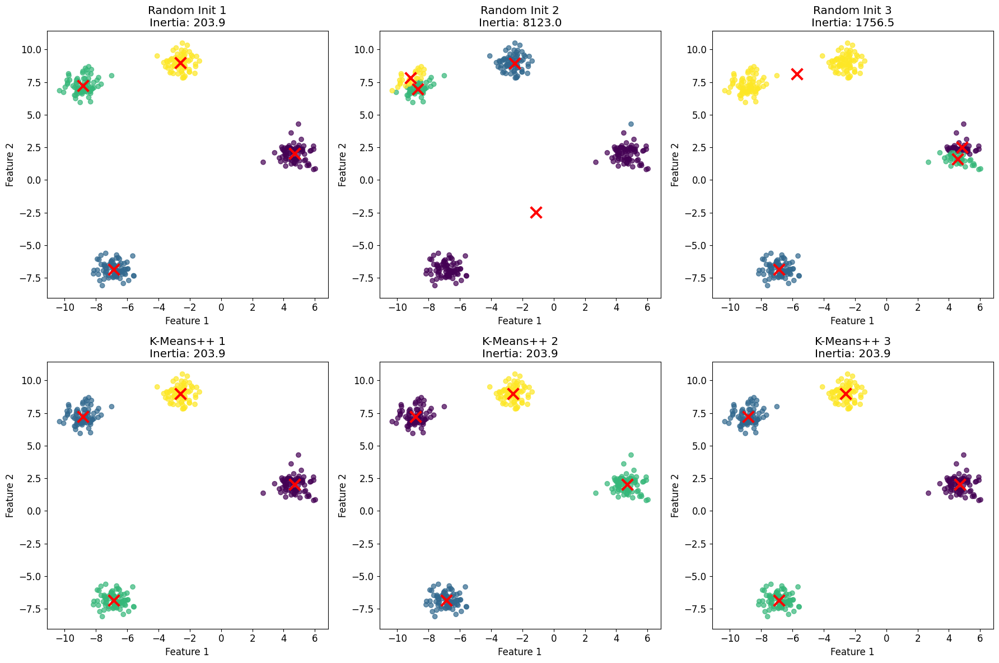


Random initialization inertias: ['203.9', '8123.0', '1756.5']
K-Means++ initialization inertias: ['203.9', '203.9', '203.9']

Average improvement with K-Means++: 3157.2

Statistical Analysis:
Random - Mean: 3361.13, Std: 3426.28
K-Means++ - Mean: 203.89, Std: 0.00


In [46]:
# Demonstration of Different Initialization Methods
# This cell compares random initialization vs K-Means++ initialization

def compare_initializations(X, k=4, n_runs=5):
    """
    Compare different initialization methods for K-Means
    """
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Random initialization results
    random_inertias = []
    for i in range(min(3, n_runs)):
        kmeans_random = KMeans(n_clusters=k, init='random', n_init=1,
                              random_state=i)
        labels = kmeans_random.fit_predict(X)
        random_inertias.append(kmeans_random.inertia_)

        # Plot results
        axes[0, i].scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', alpha=0.7)
        axes[0, i].scatter(kmeans_random.cluster_centers_[:, 0],
                          kmeans_random.cluster_centers_[:, 1],
                          marker='x', s=200, linewidths=3, color='red')
        axes[0, i].set_title(f'Random Init {i+1}\nInertia: {kmeans_random.inertia_:.1f}')
        axes[0, i].set_xlabel('Feature 1')
        axes[0, i].set_ylabel('Feature 2')

    # K-Means++ initialization results
    plus_inertias = []
    for i in range(min(3, n_runs)):
        kmeans_plus = KMeans(n_clusters=k, init='k-means++', n_init=1,
                            random_state=i)
        labels = kmeans_plus.fit_predict(X)
        plus_inertias.append(kmeans_plus.inertia_)

        # Plot results
        axes[1, i].scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', alpha=0.7)
        axes[1, i].scatter(kmeans_plus.cluster_centers_[:, 0],
                          kmeans_plus.cluster_centers_[:, 1],
                          marker='x', s=200, linewidths=3, color='red')
        axes[1, i].set_title(f'K-Means++ {i+1}\nInertia: {kmeans_plus.inertia_:.1f}')
        axes[1, i].set_xlabel('Feature 1')
        axes[1, i].set_ylabel('Feature 2')

    plt.tight_layout()
    plt.show()

    return random_inertias, plus_inertias

# Run comparison
print("Initialization Methods Comparison")
print("=" * 35)
random_inertias, plus_inertias = compare_initializations(X_blobs)

print(f"\nRandom initialization inertias: {[f'{x:.1f}' for x in random_inertias]}")
print(f"K-Means++ initialization inertias: {[f'{x:.1f}' for x in plus_inertias]}")
print(f"\nAverage improvement with K-Means++: {np.mean(random_inertias) - np.mean(plus_inertias):.1f}")

# Statistical analysis
print(f"\nStatistical Analysis:")
print(f"Random - Mean: {np.mean(random_inertias):.2f}, Std: {np.std(random_inertias):.2f}")
print(f"K-Means++ - Mean: {np.mean(plus_inertias):.2f}, Std: {np.std(plus_inertias):.2f}")

### Finding the Optimal Number of Clusters

Selecting the appropriate number of clusters $k$ is crucial for K-Means success. We'll explore two main methods:

#### 1. Elbow Method

The elbow method plots inertia vs. number of clusters and looks for the "elbow" point where the rate of decrease sharply changes.

**Mathematical Foundation**:
$$\text{Inertia}(k) = \sum_{i=1}^{m} \min_{j \in \{1,\ldots,k\}} \|\mathbf{x}_i - \boldsymbol{\mu}_j\|^2$$

#### 2. Silhouette Analysis

The silhouette coefficient measures how similar an object is to its own cluster compared to other clusters.

**Silhouette Coefficient Formula**:
$$s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}$$

Where:
- $a(i)$ = average distance from point $i$ to other points in same cluster
- $b(i)$ = average distance from point $i$ to points in nearest cluster

**Interpretation**:
- $s(i) \approx 1$: Point is well-clustered
- $s(i) \approx 0$: Point is on cluster boundary
- $s(i) \approx -1$: Point might be in wrong cluster

**Silhouette Score**:
$$\text{Silhouette Score} = \frac{1}{m} \sum_{i=1}^{m} s(i)$$

Calculating metrics for different k values...
k=2: Inertia=9051.82, Silhouette=0.615
k=3: Inertia=1773.74, Silhouette=0.799
k=4: Inertia=203.89, Silhouette=0.876
k=5: Inertia=184.41, Silhouette=0.755
k=6: Inertia=165.72, Silhouette=0.610
k=7: Inertia=148.07, Silhouette=0.454
k=8: Inertia=129.73, Silhouette=0.341


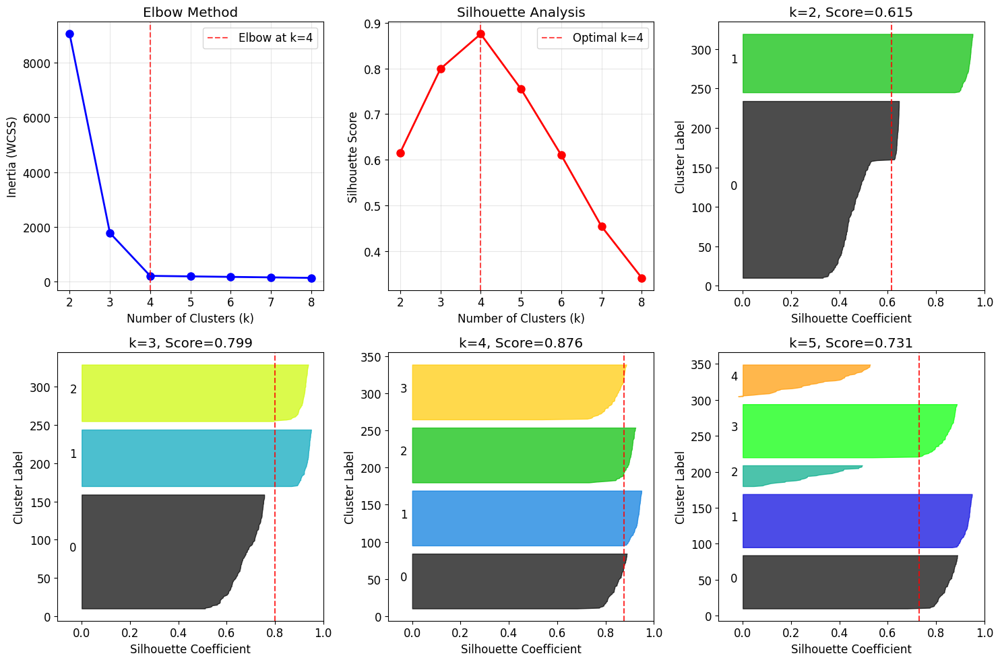


OPTIMAL CLUSTER ANALYSIS SUMMARY
Elbow method suggests k = 4
Silhouette method suggests k = 4
Best silhouette score: 0.876


In [47]:
# Comprehensive Analysis for Finding Optimal Number of Clusters
# This cell implements both elbow method and silhouette analysis

def analyze_optimal_clusters(X, max_k=10, figsize=(15, 10)):
    """
    Comprehensive analysis to find optimal number of clusters

    Parameters:
    X: dataset
    max_k: maximum number of clusters to test
    figsize: figure size for plots
    """

    # Range of k values to test
    k_range = range(2, max_k + 1)

    # Storage for results
    inertias = []
    silhouette_scores = []

    # Calculate metrics for each k
    print("Calculating metrics for different k values...")
    for k in k_range:
        # Fit K-Means
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        labels = kmeans.fit_predict(X)

        # Store results
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(X, labels))

        print(f"k={k}: Inertia={kmeans.inertia_:.2f}, Silhouette={silhouette_score(X, labels):.3f}")

    # Create comprehensive visualization
    fig = plt.figure(figsize=figsize)

    # 1. Elbow Method Plot
    plt.subplot(2, 3, 1)
    plt.plot(k_range, inertias, 'bo-', linewidth=2, markersize=8)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia (WCSS)')
    plt.title('Elbow Method')
    plt.grid(True, alpha=0.3)

    # Find elbow using rate of change
    diffs = np.diff(inertias)
    diff2 = np.diff(diffs)
    elbow_k = k_range[np.argmax(diff2) + 2] if len(diff2) > 0 else k_range[2]
    plt.axvline(x=elbow_k, color='red', linestyle='--', alpha=0.7, label=f'Elbow at k={elbow_k}')
    plt.legend()

    # 2. Silhouette Score Plot
    plt.subplot(2, 3, 2)
    plt.plot(k_range, silhouette_scores, 'ro-', linewidth=2, markersize=8)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Analysis')
    plt.grid(True, alpha=0.3)

    # Find optimal k for silhouette
    optimal_k_sil = k_range[np.argmax(silhouette_scores)]
    plt.axvline(x=optimal_k_sil, color='red', linestyle='--', alpha=0.7,
               label=f'Optimal k={optimal_k_sil}')
    plt.legend()

    # 3-6. Silhouette diagrams for different k values
    silhouette_k_values = [2, 3, 4, 5]
    for idx, k in enumerate(silhouette_k_values):
        plt.subplot(2, 3, idx + 3)

        # Fit K-Means
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(X)

        # Calculate silhouette scores
        silhouette_avg = silhouette_score(X, labels)
        sample_silhouette_values = silhouette_samples(X, labels)

        y_lower = 10
        for i in range(k):
            # Silhouette scores for samples in cluster i
            ith_cluster_silhouette_values = sample_silhouette_values[labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = plt.cm.nipy_spectral(float(i) / k)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                             0, ith_cluster_silhouette_values,
                             facecolor=color, edgecolor=color, alpha=0.7)

            # Label clusters
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        plt.xlabel('Silhouette Coefficient')
        plt.ylabel('Cluster Label')
        plt.title(f'k={k}, Score={silhouette_avg:.3f}')

        # Vertical line for average silhouette score
        plt.axvline(x=silhouette_avg, color="red", linestyle="--", alpha=0.8)
        plt.xlim([-0.1, 1])

    plt.tight_layout()
    plt.show()

    # Summary
    print("\n" + "="*50)
    print("OPTIMAL CLUSTER ANALYSIS SUMMARY")
    print("="*50)
    print(f"Elbow method suggests k = {elbow_k}")
    print(f"Silhouette method suggests k = {optimal_k_sil}")
    print(f"Best silhouette score: {max(silhouette_scores):.3f}")

    return {
        'k_range': list(k_range),
        'inertias': inertias,
        'silhouette_scores': silhouette_scores,
        'elbow_k': elbow_k,
        'optimal_k_silhouette': optimal_k_sil
    }

# Run comprehensive analysis
analysis_results = analyze_optimal_clusters(X_blobs, max_k=8)

## 2.2 Applications of K-Means <a id="kmeans-applications"></a>

### Image Segmentation

K-Means can be used for color-based image segmentation by clustering pixels in color space.

**Mathematical Approach**:
1. **Reshape image**: Convert $(H \times W \times C)$ to $(H \cdot W, C)$
2. **Cluster pixels**: Apply K-Means to color vectors
3. **Replace colors**: Replace each pixel color with its cluster centroid
4. **Reshape back**: Convert to original image shape

### Dimensionality Reduction

K-Means can serve as a non-linear dimensionality reduction technique:

**Transformation Formula**:
$$\mathbf{z}_i = [d_1(\mathbf{x}_i), d_2(\mathbf{x}_i), \ldots, d_k(\mathbf{x}_i)]$$

Where $d_j(\mathbf{x}_i) = \|\mathbf{x}_i - \boldsymbol{\mu}_j\|^2$ is the distance from point $\mathbf{x}_i$ to centroid $j$.

### Semi-Supervised Learning

K-Means can help propagate labels in semi-supervised scenarios:

1. **Cluster** all data (labeled + unlabeled)
2. **Assign** cluster labels based on majority vote of labeled examples
3. **Propagate** labels to unlabeled examples in same clusters

Original image shape: (100, 100, 3)
Reshaped for clustering: (10000, 3)
Applying K-Means with 2 clusters...
Clustering complete. Inertia: 1992.45
Original image shape: (100, 100, 3)
Reshaped for clustering: (10000, 3)
Applying K-Means with 4 clusters...
Clustering complete. Inertia: 996.33
Original image shape: (100, 100, 3)
Reshaped for clustering: (10000, 3)
Applying K-Means with 8 clusters...
Clustering complete. Inertia: 512.13
Original image shape: (100, 100, 3)
Reshaped for clustering: (10000, 3)
Applying K-Means with 16 clusters...
Clustering complete. Inertia: 260.98


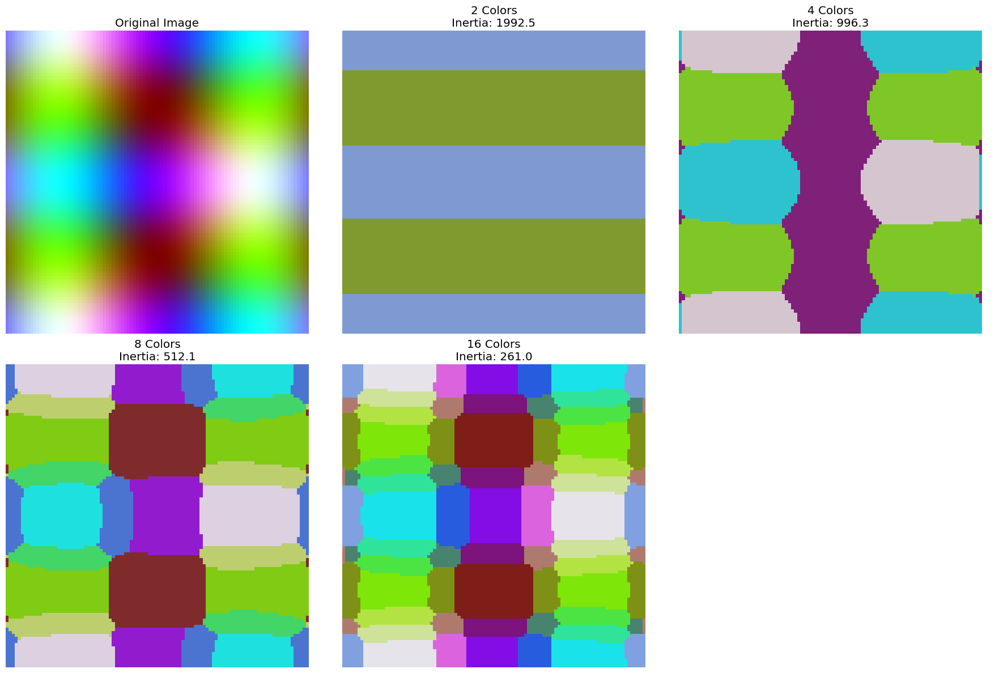


Image Segmentation Analysis:
- Fewer clusters = more aggressive color reduction
- More clusters = better color preservation
- Trade-off between compression and quality


In [48]:
# K-Means for Image Segmentation
# This cell demonstrates how to use K-Means for color-based image segmentation

from sklearn.datasets import load_sample_image
import matplotlib.image as mpimg

def segment_image_with_kmeans(image, n_colors=8):
    """
    Segment an image using K-Means clustering

    Parameters:
    image: input image array
    n_colors: number of color clusters

    Returns:
    segmented_image: image with reduced colors
    """
    # Get image dimensions
    h, w, c = image.shape
    print(f"Original image shape: {image.shape}")

    # Reshape image to 2D array (pixels x colors)
    image_2d = image.reshape(h * w, c)
    print(f"Reshaped for clustering: {image_2d.shape}")

    # Apply K-Means clustering
    print(f"Applying K-Means with {n_colors} clusters...")
    kmeans = KMeans(n_clusters=n_colors, random_state=42, n_init=10)
    labels = kmeans.fit_predict(image_2d)

    # Replace each pixel with its cluster center
    segmented_2d = kmeans.cluster_centers_[labels]

    # Reshape back to original image shape
    segmented_image = segmented_2d.reshape(h, w, c)

    print(f"Clustering complete. Inertia: {kmeans.inertia_:.2f}")
    return segmented_image, kmeans

# Create synthetic image for demonstration
def create_demo_image():
    """Create a synthetic colorful image for demonstration"""
    x = np.linspace(0, 1, 100)
    y = np.linspace(0, 1, 100)
    X, Y = np.meshgrid(x, y)

    # Create colorful patterns
    R = np.sin(2 * np.pi * X) * np.cos(2 * np.pi * Y) + 1
    G = np.sin(3 * np.pi * X) + 1
    B = np.cos(4 * np.pi * Y) + 1

    # Normalize to [0, 1]
    R = (R - R.min()) / (R.max() - R.min())
    G = (G - G.min()) / (G.max() - G.min())
    B = (B - B.min()) / (B.max() - B.min())

    return np.stack([R, G, B], axis=2)

# Create demo image
demo_image = create_demo_image()

# Test different numbers of clusters
n_colors_list = [2, 4, 8, 16]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

# Show original image
axes[0].imshow(demo_image)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Show segmented images
for i, n_colors in enumerate(n_colors_list):
    segmented, kmeans = segment_image_with_kmeans(demo_image, n_colors)

    axes[i + 1].imshow(segmented)
    axes[i + 1].set_title(f'{n_colors} Colors\nInertia: {kmeans.inertia_:.1f}')
    axes[i + 1].axis('off')

# Hide last subplot
axes[5].axis('off')

plt.tight_layout()
plt.show()

print("\nImage Segmentation Analysis:")
print("- Fewer clusters = more aggressive color reduction")
print("- More clusters = better color preservation")
print("- Trade-off between compression and quality")

Digits dataset shape: (1797, 64)
Number of classes: 10
Training set shape: (1257, 64)
Test set shape: (540, 64)

1. Baseline Model (No Preprocessing)
Baseline accuracy: 0.9574

2. K-Means Preprocessing Analysis
Clusters:  10, Accuracy: 0.9130, Improvement: -0.0444
Clusters:  20, Accuracy: 0.9556, Improvement: -0.0019
Clusters:  50, Accuracy: 0.9759, Improvement: +0.0185
Clusters: 100, Accuracy: 0.9667, Improvement: +0.0093
Clusters: 200, Accuracy: 0.9741, Improvement: +0.0167

3. Grid Search for Optimal Clusters
Best parameters: {'kmeans__n_clusters': 130}
Best CV score: 0.9698
Test score: 0.9667


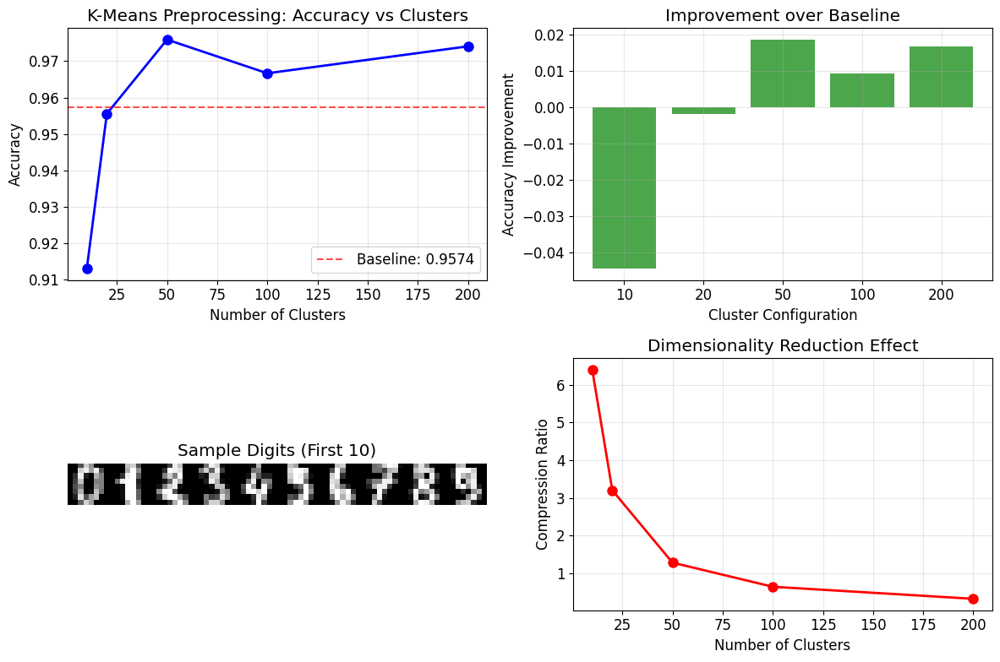


K-MEANS PREPROCESSING SUMMARY
Original features: 64
Baseline accuracy: 0.9574
Best K-Means accuracy: 0.9759
Best improvement: +0.0185
Optimal clusters: 50
Dimensionality reduction: 64 → 50


In [49]:
# K-Means for Preprocessing and Dimensionality Reduction
# This cell demonstrates using K-Means as a preprocessing step

# Load digits dataset for demonstration
X_digits, y_digits = load_digits(return_X_y=True)
print(f"Digits dataset shape: {X_digits.shape}")
print(f"Number of classes: {len(np.unique(y_digits))}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X_digits, y_digits, test_size=0.3, random_state=42, stratify=y_digits
)

print(f"Training set shape: {X_train.shape}")
print(f"Test set shape: {X_test.shape}")

# 1. Baseline: Logistic Regression without preprocessing
print("\n1. Baseline Model (No Preprocessing)")
print("=" * 40)
baseline_model = LogisticRegression(max_iter=1000, random_state=42)
baseline_model.fit(X_train, y_train)
baseline_score = baseline_model.score(X_test, y_test)
print(f"Baseline accuracy: {baseline_score:.4f}")

# 2. K-Means preprocessing with different cluster numbers
print("\n2. K-Means Preprocessing Analysis")
print("=" * 40)

cluster_range = [10, 20, 50, 100, 200]
preprocessing_scores = []

for n_clusters in cluster_range:
    # Create pipeline with K-Means preprocessing
    pipeline = Pipeline([
        ('kmeans', KMeans(n_clusters=n_clusters, random_state=42, n_init=10)),
        ('classifier', LogisticRegression(max_iter=1000, random_state=42))
    ])

    # Fit and evaluate
    pipeline.fit(X_train, y_train)
    score = pipeline.score(X_test, y_test)
    preprocessing_scores.append(score)

    print(f"Clusters: {n_clusters:3d}, Accuracy: {score:.4f}, "
          f"Improvement: {score - baseline_score:+.4f}")

# 3. Find optimal number of clusters using GridSearch
print("\n3. Grid Search for Optimal Clusters")
print("=" * 40)

# Create pipeline
pipeline = Pipeline([
    ('kmeans', KMeans(random_state=42, n_init=10)),
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

# Parameter grid
param_grid = {'kmeans__n_clusters': range(50, 150, 20)}

# Grid search
grid_search = GridSearchCV(pipeline, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Best CV score: {grid_search.best_score_:.4f}")
print(f"Test score: {grid_search.score(X_test, y_test):.4f}")

# 4. Visualize results
plt.figure(figsize=(12, 8))

# Plot 1: Accuracy vs Number of Clusters
plt.subplot(2, 2, 1)
plt.plot(cluster_range, preprocessing_scores, 'bo-', linewidth=2, markersize=8)
plt.axhline(y=baseline_score, color='red', linestyle='--', alpha=0.7,
           label=f'Baseline: {baseline_score:.4f}')
plt.xlabel('Number of Clusters')
plt.ylabel('Accuracy')
plt.title('K-Means Preprocessing: Accuracy vs Clusters')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Improvement over Baseline
plt.subplot(2, 2, 2)
improvements = [score - baseline_score for score in preprocessing_scores]
plt.bar(range(len(cluster_range)), improvements, color='green', alpha=0.7)
plt.xlabel('Cluster Configuration')
plt.ylabel('Accuracy Improvement')
plt.title('Improvement over Baseline')
plt.xticks(range(len(cluster_range)), cluster_range)
plt.grid(True, alpha=0.3)

# Plot 3: Sample digits visualization
plt.subplot(2, 2, 3)
digit_images = X_digits[:10].reshape(10, 8, 8)
combined_image = np.hstack(digit_images)
plt.imshow(combined_image, cmap='gray')
plt.title('Sample Digits (First 10)')
plt.axis('off')

# Plot 4: Dimensionality reduction effect
plt.subplot(2, 2, 4)
original_dim = X_train.shape[1]
reduced_dims = cluster_range
compression_ratios = [original_dim / dim for dim in reduced_dims]

plt.plot(cluster_range, compression_ratios, 'ro-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Compression Ratio')
plt.title('Dimensionality Reduction Effect')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Summary
print("\n" + "="*50)
print("K-MEANS PREPROCESSING SUMMARY")
print("="*50)
print(f"Original features: {X_train.shape[1]}")
print(f"Baseline accuracy: {baseline_score:.4f}")
print(f"Best K-Means accuracy: {max(preprocessing_scores):.4f}")
print(f"Best improvement: {max(preprocessing_scores) - baseline_score:+.4f}")
print(f"Optimal clusters: {cluster_range[np.argmax(preprocessing_scores)]}")
print(f"Dimensionality reduction: {X_train.shape[1]} → {cluster_range[np.argmax(preprocessing_scores)]}")

Semi-Supervised Learning Experiment

Semi-Supervised Learning with K-Means
Labeled examples: 20
Total examples: 1257
Clusters: 50

1. Limited Labeled Data Performance
----------------------------------------
Baseline (limited): 0.6667

2. K-Means Clustering
----------------------------------------
Clustering complete. Inertia: 492389.80

3. Representative Instance Selection
----------------------------------------
Representatives with labels: 17
Representative model accuracy: 0.6852

4. Label Propagation
----------------------------------------
Instances with propagated labels: 478
Propagated model accuracy: 0.6722

5. Selective Label Propagation
----------------------------------------
Confident instances: 103
Selective model accuracy: 0.6963

Semi-Supervised Learning with K-Means
Labeled examples: 50
Total examples: 1257
Clusters: 50

1. Limited Labeled Data Performance
----------------------------------------
Baseline (limited): 0.8074

2. K-Means Clustering
------------------------

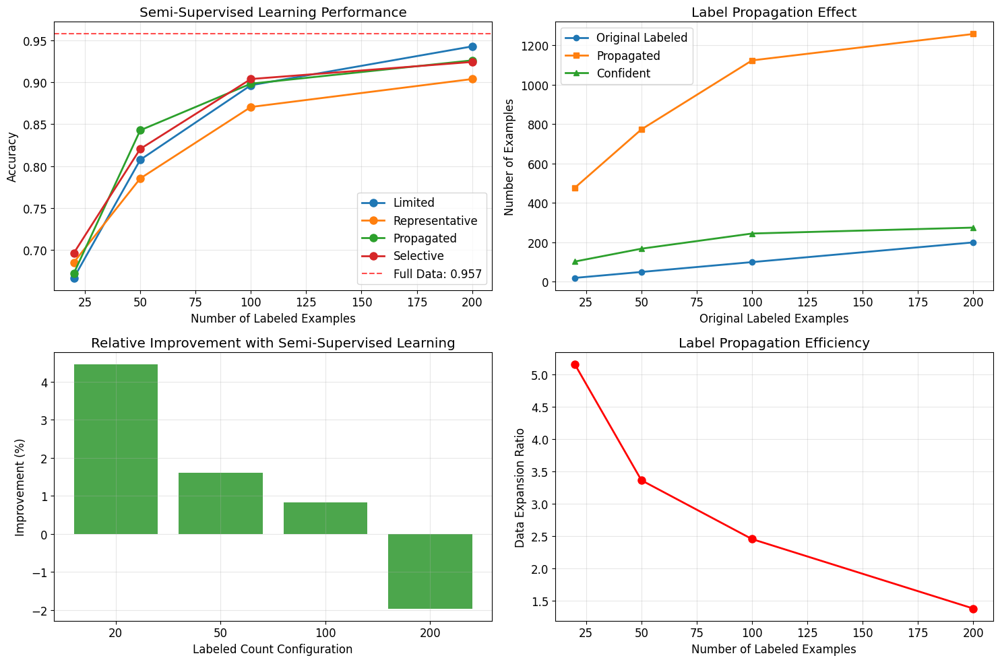


SEMI-SUPERVISED LEARNING SUMMARY
Labeled:  20, Final:  103, Accuracy: 0.6963, Improvement: +4.4%
Labeled:  50, Final:  168, Accuracy: 0.8204, Improvement: +1.6%
Labeled: 100, Final:  245, Accuracy: 0.9037, Improvement: +0.8%
Labeled: 200, Final:  275, Accuracy: 0.9241, Improvement: -2.0%


In [50]:
# K-Means for Semi-Supervised Learning
# This cell demonstrates label propagation using K-Means clustering

def semi_supervised_kmeans(X_train, y_train, n_labeled=50, n_clusters=50,
                          propagation_percentile=20):
    """
    Implement semi-supervised learning using K-Means label propagation

    Parameters:
    X_train: training features
    y_train: training labels
    n_labeled: number of labeled examples to use
    n_clusters: number of clusters for K-Means
    propagation_percentile: percentile of closest points to propagate labels to

    Returns:
    Dictionary with results
    """

    print(f"\nSemi-Supervised Learning with K-Means")
    print(f"Labeled examples: {n_labeled}")
    print(f"Total examples: {len(X_train)}")
    print(f"Clusters: {n_clusters}")

    # 1. Simulate limited labeled data
    labeled_indices = np.random.choice(len(X_train), n_labeled, replace=False)
    X_labeled = X_train[labeled_indices]
    y_labeled = y_train[labeled_indices]

    print(f"\n1. Limited Labeled Data Performance")
    print("-" * 40)

    # Train baseline model with limited labeled data
    baseline_limited = LogisticRegression(max_iter=1000, random_state=42)
    baseline_limited.fit(X_labeled, y_labeled)
    baseline_limited_score = baseline_limited.score(X_test, y_test)
    print(f"Baseline (limited): {baseline_limited_score:.4f}")

    # 2. K-Means clustering on all training data
    print(f"\n2. K-Means Clustering")
    print("-" * 40)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    X_train_dist = kmeans.fit_transform(X_train)
    cluster_labels = kmeans.labels_

    print(f"Clustering complete. Inertia: {kmeans.inertia_:.2f}")

    # 3. Find representative instances (closest to centroids)
    representative_indices = np.argmin(X_train_dist, axis=0)
    X_representative = X_train[representative_indices]

    print(f"\n3. Representative Instance Selection")
    print("-" * 40)

    # Assign labels to representatives based on labeled data in same cluster
    y_representative = np.full(n_clusters, -1)  # -1 for unlabeled

    for cluster_id in range(n_clusters):
        # Find labeled points in this cluster
        cluster_mask = cluster_labels == cluster_id
        labeled_mask = np.isin(np.arange(len(X_train)), labeled_indices)
        cluster_labeled_mask = cluster_mask & labeled_mask

        if np.any(cluster_labeled_mask):
            # Use majority vote of labeled instances in cluster
            cluster_labeled_indices = np.where(cluster_labeled_mask)[0]
            cluster_labels_list = [y_train[idx] for idx in cluster_labeled_indices
                                 if idx in labeled_indices]
            if cluster_labels_list:
                y_representative[cluster_id] = max(set(cluster_labels_list),
                                                 key=cluster_labels_list.count)

    # Remove unlabeled representatives
    labeled_repr_mask = y_representative != -1
    X_representative_labeled = X_representative[labeled_repr_mask]
    y_representative_labeled = y_representative[labeled_repr_mask]

    print(f"Representatives with labels: {len(y_representative_labeled)}")

    # Train model on representative instances
    if len(y_representative_labeled) > 0:
        repr_model = LogisticRegression(max_iter=1000, random_state=42)
        repr_model.fit(X_representative_labeled, y_representative_labeled)
        repr_score = repr_model.score(X_test, y_test)
        print(f"Representative model accuracy: {repr_score:.4f}")

    # 4. Label propagation
    print(f"\n4. Label Propagation")
    print("-" * 40)

    # Propagate labels to all instances in same cluster
    y_train_propagated = np.full(len(X_train), -1)

    for cluster_id in range(n_clusters):
        if y_representative[cluster_id] != -1:
            cluster_mask = cluster_labels == cluster_id
            y_train_propagated[cluster_mask] = y_representative[cluster_id]

    # Use only instances with propagated labels
    propagated_mask = y_train_propagated != -1
    X_train_propagated = X_train[propagated_mask]
    y_train_propagated_clean = y_train_propagated[propagated_mask]

    print(f"Instances with propagated labels: {len(y_train_propagated_clean)}")

    if len(y_train_propagated_clean) > 0:
        # Train model on propagated labels
        propagated_model = LogisticRegression(max_iter=1000, random_state=42)
        propagated_model.fit(X_train_propagated, y_train_propagated_clean)
        propagated_score = propagated_model.score(X_test, y_test)
        print(f"Propagated model accuracy: {propagated_score:.4f}")

        # 5. Partial propagation (only confident predictions)
        print(f"\n5. Selective Label Propagation")
        print("-" * 40)

        # Use only instances closest to centroids (more confident)
        cluster_distances = X_train_dist[np.arange(len(X_train)), cluster_labels]

        # For each cluster, use only closest instances
        confident_mask = np.zeros(len(X_train), dtype=bool)

        for cluster_id in range(n_clusters):
            if y_representative[cluster_id] != -1:
                cluster_mask = cluster_labels == cluster_id
                if np.sum(cluster_mask) > 0:
                    cluster_distances_subset = cluster_distances[cluster_mask]
                    threshold = np.percentile(cluster_distances_subset,
                                            propagation_percentile)
                    cluster_indices = np.where(cluster_mask)[0]
                    confident_in_cluster = cluster_distances[cluster_mask] <= threshold
                    confident_mask[cluster_indices[confident_in_cluster]] = True

        # Train on selectively propagated labels
        X_train_selective = X_train[confident_mask]
        y_train_selective = y_train_propagated[confident_mask]

        print(f"Confident instances: {len(y_train_selective)}")

        if len(y_train_selective) > 0:
            selective_model = LogisticRegression(max_iter=1000, random_state=42)
            selective_model.fit(X_train_selective, y_train_selective)
            selective_score = selective_model.score(X_test, y_test)
            print(f"Selective model accuracy: {selective_score:.4f}")
        else:
            selective_score = 0
    else:
        propagated_score = 0
        selective_score = 0

    return {
        'baseline_limited': baseline_limited_score,
        'representative': repr_score if 'repr_score' in locals() else 0,
        'propagated': propagated_score,
        'selective': selective_score,
        'n_labeled': n_labeled,
        'n_propagated': len(y_train_propagated_clean) if 'y_train_propagated_clean' in locals() else 0,
        'n_confident': len(y_train_selective) if 'y_train_selective' in locals() else 0
    }

# Run semi-supervised learning experiment
print("Semi-Supervised Learning Experiment")
print("=" * 50)

# Test with different numbers of labeled examples
labeled_counts = [20, 50, 100, 200]
results = []

for n_labeled in labeled_counts:
    result = semi_supervised_kmeans(X_train, y_train, n_labeled=n_labeled)
    results.append(result)

# Visualize results
plt.figure(figsize=(15, 10))

# Plot 1: Accuracy comparison
plt.subplot(2, 2, 1)
methods = ['Limited', 'Representative', 'Propagated', 'Selective']
method_keys = ['baseline_limited', 'representative', 'propagated', 'selective']

for i, method in enumerate(methods):
    scores = [result[method_keys[i]] for result in results]
    plt.plot(labeled_counts, scores, 'o-', linewidth=2, markersize=8, label=method)

plt.axhline(y=baseline_score, color='red', linestyle='--', alpha=0.7,
           label=f'Full Data: {baseline_score:.3f}')
plt.xlabel('Number of Labeled Examples')
plt.ylabel('Accuracy')
plt.title('Semi-Supervised Learning Performance')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 2: Label expansion
plt.subplot(2, 2, 2)
n_propagated = [result['n_propagated'] for result in results]
n_confident = [result['n_confident'] for result in results]

plt.plot(labeled_counts, labeled_counts, 'o-', label='Original Labeled', linewidth=2)
plt.plot(labeled_counts, n_propagated, 's-', label='Propagated', linewidth=2)
plt.plot(labeled_counts, n_confident, '^-', label='Confident', linewidth=2)
plt.xlabel('Original Labeled Examples')
plt.ylabel('Number of Examples')
plt.title('Label Propagation Effect')
plt.legend()
plt.grid(True, alpha=0.3)

# Plot 3: Improvement ratios
plt.subplot(2, 2, 3)
improvements = [(result['selective'] - result['baseline_limited']) / result['baseline_limited'] * 100
               for result in results if result['baseline_limited'] > 0]
plt.bar(range(len(labeled_counts)), improvements, alpha=0.7, color='green')
plt.xlabel('Labeled Count Configuration')
plt.ylabel('Improvement (%)')
plt.title('Relative Improvement with Semi-Supervised Learning')
plt.xticks(range(len(labeled_counts)), labeled_counts)
plt.grid(True, alpha=0.3)

# Plot 4: Data efficiency
plt.subplot(2, 2, 4)
expansion_ratios = [result['n_confident'] / result['n_labeled']
                   for result in results if result['n_labeled'] > 0]
plt.plot(labeled_counts, expansion_ratios, 'ro-', linewidth=2, markersize=8)
plt.xlabel('Number of Labeled Examples')
plt.ylabel('Data Expansion Ratio')
plt.title('Label Propagation Efficiency')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Summary
print("\n" + "="*60)
print("SEMI-SUPERVISED LEARNING SUMMARY")
print("="*60)
for i, result in enumerate(results):
    improvement = ((result['selective'] - result['baseline_limited']) /
                  result['baseline_limited'] * 100) if result['baseline_limited'] > 0 else 0
    print(f"Labeled: {result['n_labeled']:3d}, "
          f"Final: {result['n_confident']:4d}, "
          f"Accuracy: {result['selective']:.4f}, "
          f"Improvement: {improvement:+.1f}%")

### Limitations of K-Means

Despite its popularity, K-Means has several important limitations:

#### 1. **Assumption of Spherical Clusters**
K-Means assumes clusters are spherical and have similar sizes. This fails when:
- Clusters have different shapes (elliptical, irregular)
- Clusters have different densities
- Clusters have different sizes

#### 2. **Sensitivity to Initialization**
Poor initialization can lead to suboptimal local minima.

#### 3. **Need to Specify K**
The number of clusters must be specified in advance.

#### 4. **Sensitivity to Outliers**
Outliers can significantly affect centroid positions.

#### 5. **Scale Sensitivity**
Features with larger scales dominate the distance calculation.

**Scaling Importance**:
$$d(\mathbf{x}_i, \mathbf{x}_j) = \sqrt{\sum_{k=1}^{n} (x_{ik} - x_{jk})^2}$$

If feature $k$ has much larger scale, it dominates the distance.

#### 6. **Computational Complexity**
- **Best case**: $O(mkn)$ per iteration
- **Worst case**: Exponential in number of instances
- **Practical**: Usually converges quickly

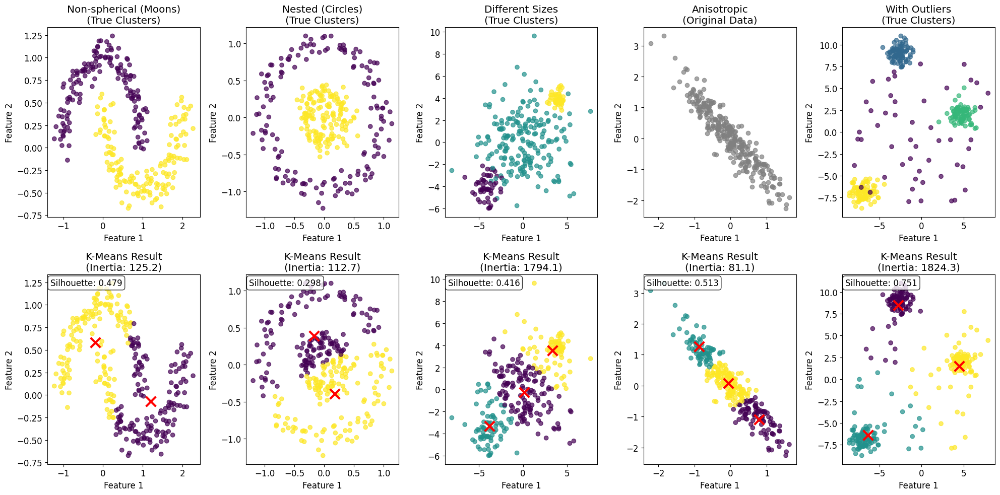


Demonstrating Scale Sensitivity


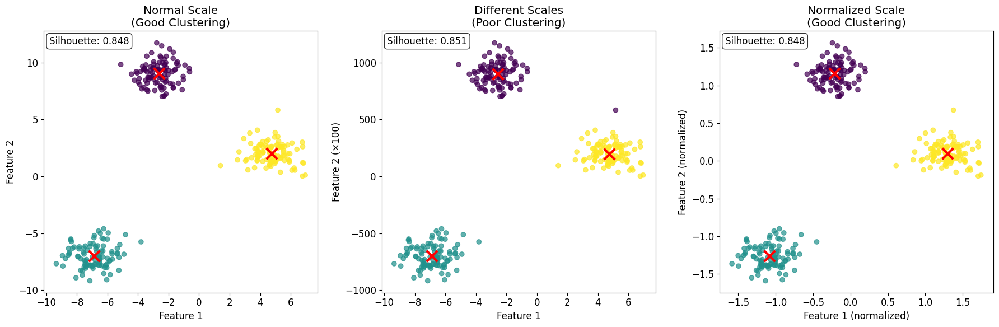


Scale Sensitivity Results:
Normal scale silhouette: 0.848
Different scales silhouette: 0.851
Normalized scale silhouette: 0.848

Conclusion: Always normalize features before K-Means!


In [51]:
# Demonstration of K-Means Limitations
# This cell shows various scenarios where K-Means fails

from sklearn.datasets import make_moons, make_circles, make_blobs
from sklearn.cluster import KMeans, DBSCAN
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

def demonstrate_kmeans_limitations():
    """
    Create datasets that highlight K-Means limitations
    """

    # 1. Non-spherical clusters (moons)
    X_moons, y_moons = make_moons(n_samples=300, noise=0.1, random_state=42)

    # 2. Nested clusters (circles)
    X_circles, y_circles = make_circles(n_samples=300, noise=0.1, factor=0.3, random_state=42)

    # 3. Different cluster sizes
    X_sizes, y_sizes = make_blobs(n_samples=[50, 200, 50], centers=[[-4, -4], [0, 0], [4, 4]],
                                  cluster_std=[1.0, 2.5, 0.5], random_state=42)

    # 4. Anisotropic clusters (different shapes)
    X_aniso = np.random.randn(300, 2)
    transformation = np.array([[0.6, -0.6], [-0.4, 0.8]])
    X_aniso = np.dot(X_aniso, transformation)

    # 5. Clusters with outliers
    X_outliers, y_outliers = make_blobs(n_samples=250, centers=3,
                                       cluster_std=0.8, random_state=42)
    # Add outliers
    outliers = np.random.uniform(-8, 8, (50, 2))
    X_outliers = np.vstack([X_outliers, outliers])
    y_outliers = np.hstack([y_outliers, np.full(50, -1)])  # -1 for outliers

    datasets = [
        (X_moons, y_moons, "Non-spherical (Moons)", 2),
        (X_circles, y_circles, "Nested (Circles)", 2),
        (X_sizes, y_sizes, "Different Sizes", 3),
        (X_aniso, None, "Anisotropic", 3),
        (X_outliers, y_outliers, "With Outliers", 3)
    ]

    return datasets

# Create problem datasets
problem_datasets = demonstrate_kmeans_limitations()

# Visualize K-Means performance on problematic datasets
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

for i, (X, y_true, title, n_clusters) in enumerate(problem_datasets):
    # Apply K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    y_kmeans = kmeans.fit_predict(X)

    # Plot true clusters (if available)
    if y_true is not None:
        axes[0, i].scatter(X[:, 0], X[:, 1], c=y_true, cmap='viridis', alpha=0.7)
        axes[0, i].set_title(f'{title}\n(True Clusters)')
    else:
        axes[0, i].scatter(X[:, 0], X[:, 1], alpha=0.7, c='gray')
        axes[0, i].set_title(f'{title}\n(Original Data)')

    axes[0, i].set_xlabel('Feature 1')
    axes[0, i].set_ylabel('Feature 2')

    # Plot K-Means results
    axes[1, i].scatter(X[:, 0], X[:, 1], c=y_kmeans, cmap='viridis', alpha=0.7)
    axes[1, i].scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
                      marker='x', s=200, linewidths=3, color='red')
    axes[1, i].set_title(f'K-Means Result\n(Inertia: {kmeans.inertia_:.1f})')
    axes[1, i].set_xlabel('Feature 1')
    axes[1, i].set_ylabel('Feature 2')

    # Calculate silhouette score
    if len(np.unique(y_kmeans)) > 1:
        sil_score = silhouette_score(X, y_kmeans)
        axes[1, i].text(0.02, 0.98, f'Silhouette: {sil_score:.3f}',
                       transform=axes[1, i].transAxes, verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

# Demonstrate scaling sensitivity
print("\nDemonstrating Scale Sensitivity")
print("=" * 40)

# Create dataset with different scales
X_scale, _ = make_blobs(n_samples=300, centers=3, cluster_std=1.0, random_state=42)
# Scale one feature to be much larger
X_scale_problem = X_scale.copy()
X_scale_problem[:, 1] *= 100  # Scale second feature by 100

# Apply K-Means to both versions
kmeans_normal = KMeans(n_clusters=3, random_state=42, n_init=10)
y_normal = kmeans_normal.fit_predict(X_scale)

kmeans_scaled = KMeans(n_clusters=3, random_state=42, n_init=10)
y_scaled = kmeans_scaled.fit_predict(X_scale_problem)

# Apply with proper scaling
scaler = StandardScaler()
X_scale_normalized = scaler.fit_transform(X_scale_problem)
kmeans_normalized = KMeans(n_clusters=3, random_state=42, n_init=10)
y_normalized = kmeans_normalized.fit_predict(X_scale_normalized)

# Visualize scaling effects
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Normal scale
axes[0].scatter(X_scale[:, 0], X_scale[:, 1], c=y_normal, cmap='viridis', alpha=0.7)
axes[0].scatter(kmeans_normal.cluster_centers_[:, 0], kmeans_normal.cluster_centers_[:, 1],
               marker='x', s=200, linewidths=3, color='red')
axes[0].set_title('Normal Scale\n(Good Clustering)')
axes[0].set_xlabel('Feature 1')
axes[0].set_ylabel('Feature 2')
sil_normal = silhouette_score(X_scale, y_normal)
axes[0].text(0.02, 0.98, f'Silhouette: {sil_normal:.3f}',
            transform=axes[0].transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Scaled version (problem)
axes[1].scatter(X_scale_problem[:, 0], X_scale_problem[:, 1], c=y_scaled, cmap='viridis', alpha=0.7)
axes[1].scatter(kmeans_scaled.cluster_centers_[:, 0], kmeans_scaled.cluster_centers_[:, 1],
               marker='x', s=200, linewidths=3, color='red')
axes[1].set_title('Different Scales\n(Poor Clustering)')
axes[1].set_xlabel('Feature 1')
axes[1].set_ylabel('Feature 2 (×100)')
sil_scaled = silhouette_score(X_scale_problem, y_scaled)
axes[1].text(0.02, 0.98, f'Silhouette: {sil_scaled:.3f}',
            transform=axes[1].transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Normalized version (solution)
axes[2].scatter(X_scale_normalized[:, 0], X_scale_normalized[:, 1], c=y_normalized, cmap='viridis', alpha=0.7)
axes[2].scatter(kmeans_normalized.cluster_centers_[:, 0], kmeans_normalized.cluster_centers_[:, 1],
               marker='x', s=200, linewidths=3, color='red')
axes[2].set_title('Normalized Scale\n(Good Clustering)')
axes[2].set_xlabel('Feature 1 (normalized)')
axes[2].set_ylabel('Feature 2 (normalized)')
sil_normalized = silhouette_score(X_scale_normalized, y_normalized)
axes[2].text(0.02, 0.98, f'Silhouette: {sil_normalized:.3f}',
            transform=axes[2].transAxes, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

print(f"\nScale Sensitivity Results:")
print(f"Normal scale silhouette: {sil_normal:.3f}")
print(f"Different scales silhouette: {sil_scaled:.3f}")
print(f"Normalized scale silhouette: {sil_normalized:.3f}")
print("\nConclusion: Always normalize features before K-Means!")

## 2.3 DBSCAN (Density-Based Spatial Clustering) <a id="dbscan"></a>

### Theoretical Foundation

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) is a density-based clustering algorithm that can discover clusters of arbitrary shape and automatically detect outliers.

### Key Concepts

#### 1. **Core Point**
A point $p$ is a core point if it has at least `min_samples` points within distance $\epsilon$ (including itself):
$$|N_\epsilon(p)| \geq \text{min_samples}$$

Where $N_\epsilon(p) = \{q \in D : \text{dist}(p,q) \leq \epsilon\}$ is the $\epsilon$-neighborhood of $p$.

#### 2. **Border Point**
A point that is not a core point but lies within the $\epsilon$-neighborhood of a core point.

#### 3. **Noise Point (Outlier)**
A point that is neither a core point nor a border point.

#### 4. **Directly Density-Reachable**
Point $q$ is directly density-reachable from point $p$ if:
- $q \in N_\epsilon(p)$
- $p$ is a core point

#### 5. **Density-Reachable**
Point $q$ is density-reachable from $p$ if there exists a chain of points $p_1, p_2, \ldots, p_n$ where:
- $p_1 = p$ and $p_n = q$
- Each $p_{i+1}$ is directly density-reachable from $p_i$

#### 6. **Density-Connected**
Points $p$ and $q$ are density-connected if there exists a core point $o$ such that both $p$ and $q$ are density-reachable from $o$.

### Algorithm Steps

1. **For each unvisited point** $p$:
2. **Find neighbors**: $N = N_\epsilon(p)$
3. **If** $|N| < \text{min_samples}$: **mark** $p$ as noise
4. **Else**: **create new cluster** and add all density-reachable points
5. **Repeat** until all points are processed

### Mathematical Properties

**Cluster Definition**: A cluster $C$ is a maximal set of density-connected points:
$$C = \{p \in D : \exists q \in C \text{ such that } p \text{ is density-reachable from } q\}$$

**Advantages**:
- Discovers clusters of arbitrary shape
- Automatically determines number of clusters
- Robust to outliers
- Does not require cluster centers

**Computational Complexity**: $O(n \log n)$ with spatial indexing, $O(n^2)$ without

DBSCAN Parameter Analysis on Moon Dataset


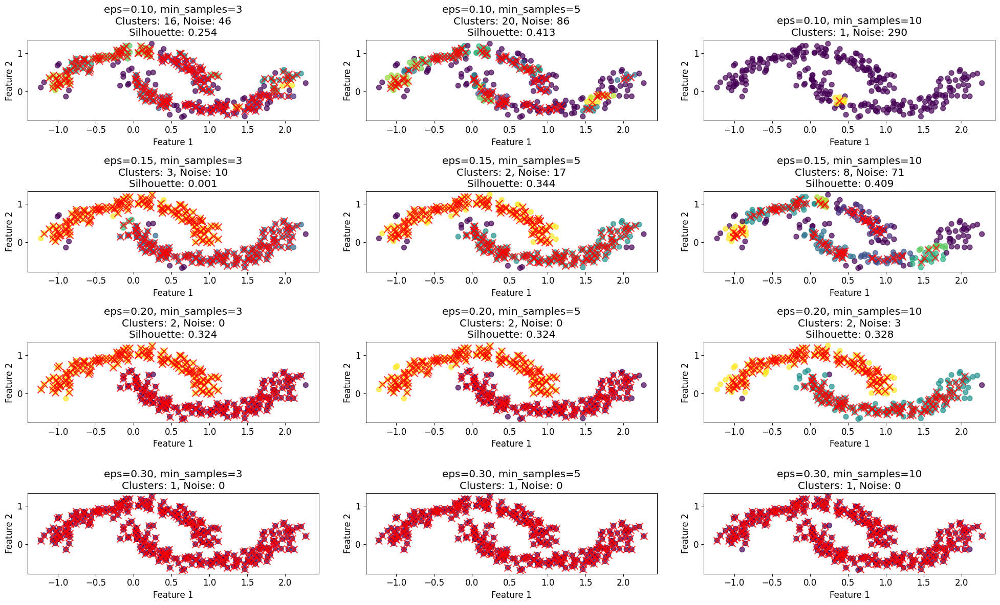


Best parameters:
eps: 0.1, min_samples: 5
Clusters: 20, Silhouette: 0.413

Parameter Analysis Summary:
----------------------------------------------------------------------
eps	min_samples	Clusters	Noise	Core	Silhouette
----------------------------------------------------------------------
0.10	3		16	46	238	0.254
0.10	5		20	86	137	0.413
0.10	10		1	290	1	N/A
0.15	3		3	10	282	0.001
0.15	5		2	17	250	0.344
0.15	10		8	71	101	0.409
0.20	3		2	0	297	0.324
0.20	5		2	0	286	0.324
0.20	10		2	3	235	0.328
0.30	3		1	0	300	N/A
0.30	5		1	0	300	N/A
0.30	10		1	0	296	N/A


In [52]:
# Comprehensive DBSCAN Implementation and Analysis
# This cell demonstrates DBSCAN algorithm with detailed parameter analysis

def analyze_dbscan_parameters(X, eps_range, min_samples_range, figsize=(20, 12)):
    """
    Comprehensive analysis of DBSCAN parameters

    Parameters:
    X: dataset
    eps_range: range of epsilon values to test
    min_samples_range: range of min_samples values to test
    """

    results = []

    fig, axes = plt.subplots(len(eps_range), len(min_samples_range), figsize=figsize)
    if len(eps_range) == 1:
        axes = axes.reshape(1, -1)
    if len(min_samples_range) == 1:
        axes = axes.reshape(-1, 1)

    for i, eps in enumerate(eps_range):
        for j, min_samples in enumerate(min_samples_range):
            # Apply DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)

            # Calculate metrics
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)
            n_core = len(dbscan.core_sample_indices_) if hasattr(dbscan, 'core_sample_indices_') else 0

            # Calculate silhouette score (if possible)
            if n_clusters > 1 and n_noise < len(X):
                # Remove noise points for silhouette calculation
                mask = labels != -1
                if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                    sil_score = silhouette_score(X[mask], labels[mask])
                else:
                    sil_score = -1
            else:
                sil_score = -1

            results.append({
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'n_core': n_core,
                'silhouette': sil_score,
                'labels': labels
            })

            # Plot results
            scatter = axes[i, j].scatter(X[:, 0], X[:, 1], c=labels,
                                       cmap='viridis', alpha=0.7, s=50)

            # Highlight core points
            if hasattr(dbscan, 'core_sample_indices_') and len(dbscan.core_sample_indices_) > 0:
                axes[i, j].scatter(X[dbscan.core_sample_indices_, 0],
                                 X[dbscan.core_sample_indices_, 1],
                                 s=100, marker='x', color='red', alpha=0.8)

            axes[i, j].set_title(f'eps={eps:.2f}, min_samples={min_samples}\n'
                                f'Clusters: {n_clusters}, Noise: {n_noise}\n'
                                f'Silhouette: {sil_score:.3f}' if sil_score != -1 else f'eps={eps:.2f}, min_samples={min_samples}\nClusters: {n_clusters}, Noise: {n_noise}')
            axes[i, j].set_xlabel('Feature 1')
            axes[i, j].set_ylabel('Feature 2')

    plt.tight_layout()
    plt.show()

    return results

# Test DBSCAN on moon dataset
print("DBSCAN Parameter Analysis on Moon Dataset")
print("=" * 45)

# Generate moon dataset
X_moons, y_moons_true = make_moons(n_samples=300, noise=0.1, random_state=42)

# Parameter ranges to test
eps_range = [0.1, 0.15, 0.2, 0.3]
min_samples_range = [3, 5, 10]

# Run analysis
dbscan_results = analyze_dbscan_parameters(X_moons, eps_range, min_samples_range)

# Find best parameters
valid_results = [r for r in dbscan_results if r['silhouette'] != -1 and r['n_clusters'] > 0]
if valid_results:
    best_result = max(valid_results, key=lambda x: x['silhouette'])
    print(f"\nBest parameters:")
    print(f"eps: {best_result['eps']}, min_samples: {best_result['min_samples']}")
    print(f"Clusters: {best_result['n_clusters']}, Silhouette: {best_result['silhouette']:.3f}")
else:
    print("\nNo valid clustering found in parameter range")

# Create summary table
print("\nParameter Analysis Summary:")
print("-" * 70)
print("eps\tmin_samples\tClusters\tNoise\tCore\tSilhouette")
print("-" * 70)
for result in dbscan_results:
    print(f"{result['eps']:.2f}\t{result['min_samples']}\t\t{result['n_clusters']}\t{result['n_noise']}\t{result['n_core']}\t{result['silhouette']:.3f}" if result['silhouette'] != -1 else f"{result['eps']:.2f}\t{result['min_samples']}\t\t{result['n_clusters']}\t{result['n_noise']}\t{result['n_core']}\tN/A")

Comprehensive Algorithm Comparison


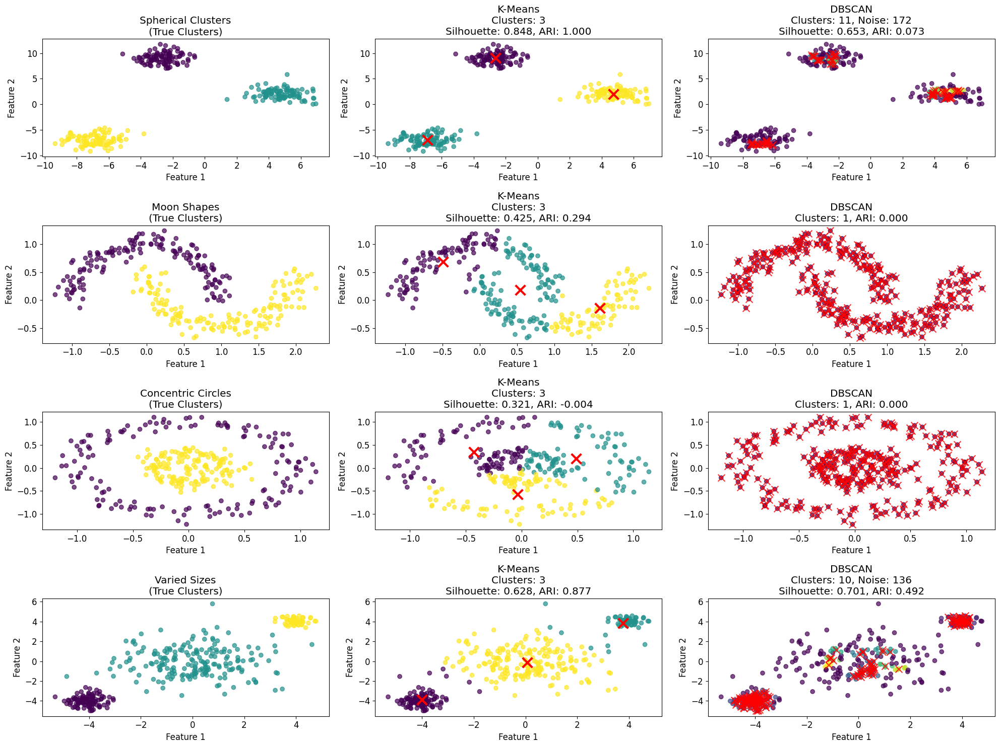


Detailed Comparison Results:

Dataset: Spherical Clusters
------------------------------
K-Means:
  Clusters: 3
  Silhouette: 0.848
  Adjusted Rand Index: 1.000

DBSCAN:
  Clusters: 11
  Noise points: 172
  Silhouette: 0.653
  Adjusted Rand Index: 0.073


Dataset: Moon Shapes
------------------------------
K-Means:
  Clusters: 3
  Silhouette: 0.425
  Adjusted Rand Index: 0.294

DBSCAN:
  Clusters: 1
  Adjusted Rand Index: 0.000


Dataset: Concentric Circles
------------------------------
K-Means:
  Clusters: 3
  Silhouette: 0.321
  Adjusted Rand Index: -0.004

DBSCAN:
  Clusters: 1
  Adjusted Rand Index: 0.000


Dataset: Varied Sizes
------------------------------
K-Means:
  Clusters: 3
  Silhouette: 0.628
  Adjusted Rand Index: 0.877

DBSCAN:
  Clusters: 10
  Noise points: 136
  Silhouette: 0.701
  Adjusted Rand Index: 0.492


ALGORITHM COMPARISON INSIGHTS
K-Means:
+ Works well with spherical, similar-sized clusters
+ Fast and scalable
+ Deterministic results with proper initializati

In [53]:
# Comprehensive Comparison: DBSCAN vs K-Means
# This cell compares DBSCAN and K-Means on various dataset types

def compare_clustering_algorithms(datasets, algorithms, figsize=(20, 15)):
    """
    Compare clustering algorithms across different datasets

    Parameters:
    datasets: list of (X, y_true, name) tuples
    algorithms: list of (algorithm, name, params) tuples
    """

    n_datasets = len(datasets)
    n_algorithms = len(algorithms)

    fig, axes = plt.subplots(n_datasets, n_algorithms + 1, figsize=figsize)

    results = []

    for i, (X, y_true, dataset_name) in enumerate(datasets):
        # Plot original data
        if y_true is not None:
            axes[i, 0].scatter(X[:, 0], X[:, 1], c=y_true, cmap='viridis', alpha=0.7)
            axes[i, 0].set_title(f'{dataset_name}\n(True Clusters)')
        else:
            axes[i, 0].scatter(X[:, 0], X[:, 1], alpha=0.7, color='gray')
            axes[i, 0].set_title(f'{dataset_name}\n(Original Data)')

        axes[i, 0].set_xlabel('Feature 1')
        axes[i, 0].set_ylabel('Feature 2')

        dataset_results = {'dataset': dataset_name, 'algorithms': {}}

        # Apply each algorithm
        for j, (algorithm_class, algorithm_name, params) in enumerate(algorithms):
            try:
                # Fit algorithm
                algorithm = algorithm_class(**params)
                labels = algorithm.fit_predict(X)

                # Calculate metrics
                n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
                n_noise = list(labels).count(-1) if -1 in labels else 0

                # Calculate silhouette score
                if n_clusters > 1:
                    if -1 in labels:  # DBSCAN case
                        mask = labels != -1
                        if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                            sil_score = silhouette_score(X[mask], labels[mask])
                        else:
                            sil_score = -1
                    else:  # K-Means case
                        sil_score = silhouette_score(X, labels)
                else:
                    sil_score = -1

                # Calculate adjusted rand index if true labels available
                if y_true is not None:
                    from sklearn.metrics import adjusted_rand_score
                    ari_score = adjusted_rand_score(y_true, labels)
                else:
                    ari_score = None

                # Store results
                dataset_results['algorithms'][algorithm_name] = {
                    'n_clusters': n_clusters,
                    'n_noise': n_noise,
                    'silhouette': sil_score,
                    'ari': ari_score,
                    'labels': labels
                }

                # Plot results
                scatter = axes[i, j + 1].scatter(X[:, 0], X[:, 1], c=labels,
                                               cmap='viridis', alpha=0.7)

                # Add centroids for K-Means
                if hasattr(algorithm, 'cluster_centers_'):
                    axes[i, j + 1].scatter(algorithm.cluster_centers_[:, 0],
                                         algorithm.cluster_centers_[:, 1],
                                         marker='x', s=200, linewidths=3, color='red')

                # Add core points for DBSCAN
                if hasattr(algorithm, 'core_sample_indices_') and len(algorithm.core_sample_indices_) > 0:
                    axes[i, j + 1].scatter(X[algorithm.core_sample_indices_, 0],
                                         X[algorithm.core_sample_indices_, 1],
                                         s=100, marker='x', color='red', alpha=0.8)

                title = f'{algorithm_name}\nClusters: {n_clusters}'
                if n_noise > 0:
                    title += f', Noise: {n_noise}'
                if sil_score != -1:
                    title += f'\nSilhouette: {sil_score:.3f}'
                if ari_score is not None:
                    title += f', ARI: {ari_score:.3f}'

                axes[i, j + 1].set_title(title)
                axes[i, j + 1].set_xlabel('Feature 1')
                axes[i, j + 1].set_ylabel('Feature 2')

            except Exception as e:
                print(f"Error with {algorithm_name} on {dataset_name}: {e}")
                axes[i, j + 1].text(0.5, 0.5, f'Error\n{algorithm_name}',
                                   transform=axes[i, j + 1].transAxes,
                                   ha='center', va='center')
                axes[i, j + 1].set_title(f'{algorithm_name}\n(Failed)')

        results.append(dataset_results)

    plt.tight_layout()
    plt.show()

    return results

# Create test datasets
print("Comprehensive Algorithm Comparison")
print("=" * 40)

# Datasets for comparison
X_blobs, y_blobs = make_blobs(n_samples=300, centers=3, cluster_std=1.0, random_state=42)
X_moons, y_moons = make_moons(n_samples=300, noise=0.1, random_state=42)
X_circles, y_circles = make_circles(n_samples=300, noise=0.1, factor=0.3, random_state=42)

# Different sized clusters
X_varied, y_varied = make_blobs(n_samples=[100, 200, 50], centers=[[-4, -4], [0, 0], [4, 4]],
                                cluster_std=[0.5, 1.5, 0.3], random_state=42)

datasets = [
    (X_blobs, y_blobs, "Spherical Clusters"),
    (X_moons, y_moons, "Moon Shapes"),
    (X_circles, y_circles, "Concentric Circles"),
    (X_varied, y_varied, "Varied Sizes")
]

# Algorithms to compare
algorithms = [
    (KMeans, "K-Means", {'n_clusters': 3, 'random_state': 42, 'n_init': 10}),
    (DBSCAN, "DBSCAN", {'eps': 0.3, 'min_samples': 5})
]

# Run comparison
comparison_results = compare_clustering_algorithms(datasets, algorithms)

# Print detailed comparison
print("\nDetailed Comparison Results:")
print("=" * 50)

for result in comparison_results:
    print(f"\nDataset: {result['dataset']}")
    print("-" * 30)

    for alg_name, metrics in result['algorithms'].items():
        print(f"{alg_name}:")
        print(f"  Clusters: {metrics['n_clusters']}")
        if metrics['n_noise'] > 0:
            print(f"  Noise points: {metrics['n_noise']}")
        if metrics['silhouette'] != -1:
            print(f"  Silhouette: {metrics['silhouette']:.3f}")
        if metrics['ari'] is not None:
            print(f"  Adjusted Rand Index: {metrics['ari']:.3f}")
        print()

# Summary insights
print("\n" + "="*60)
print("ALGORITHM COMPARISON INSIGHTS")
print("="*60)
print("K-Means:")
print("+ Works well with spherical, similar-sized clusters")
print("+ Fast and scalable")
print("+ Deterministic results with proper initialization")
print("- Assumes spherical clusters")
print("- Sensitive to outliers")
print("- Requires specifying number of clusters")
print()
print("DBSCAN:")
print("+ Handles arbitrary cluster shapes")
print("+ Automatically detects outliers")
print("+ No need to specify number of clusters")
print("+ Robust to noise")
print("- Sensitive to hyperparameters (eps, min_samples)")
print("- Struggles with varying densities")
print("- Higher computational complexity")

DBSCAN Prediction Demonstration
DBSCAN Results:
Number of clusters: 3
Number of noise points: 2
Number of core points: 186
Predictor trained on 186 core points

Test Predictions:
Predicted clusters: (array([0, 1, 2]), array([16, 34, 50]))
Average prediction distance: 0.105


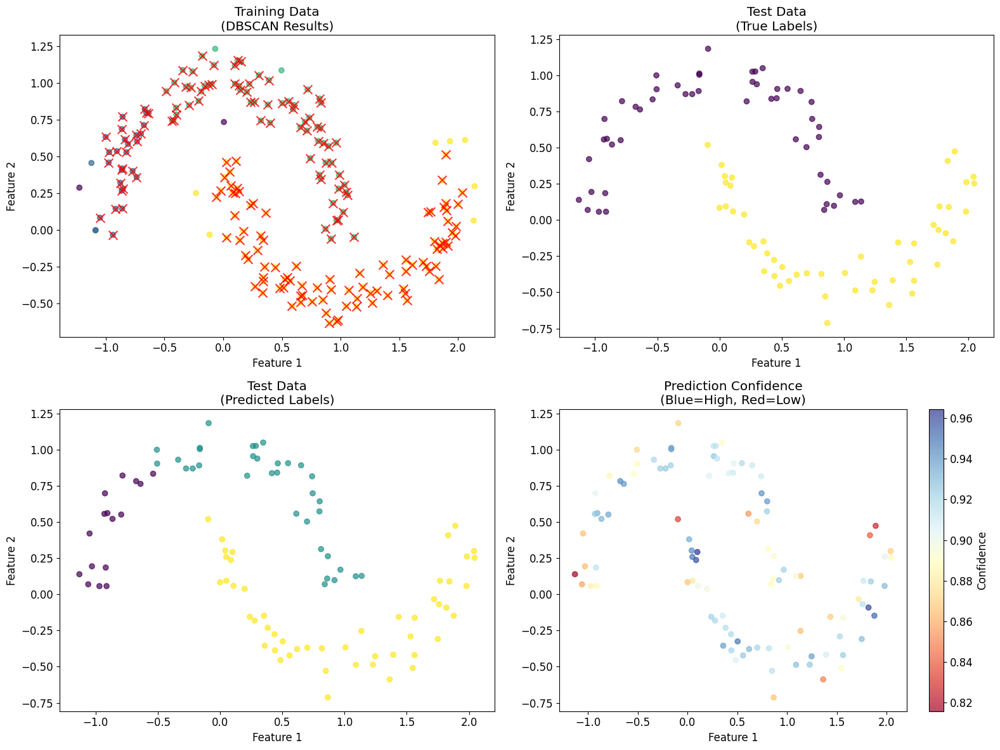


Prediction accuracy (non-noise): 0.160
Noise points predicted: 0 out of 100


In [54]:
# DBSCAN Prediction for New Points
# This cell demonstrates how to predict cluster membership for new points

def create_dbscan_predictor(X, eps=0.3, min_samples=5, n_neighbors=5):
    """
    Create a predictor for DBSCAN clustering

    Since DBSCAN doesn't have a predict method, we use KNN to classify new points

    Parameters:
    X: training data
    eps: DBSCAN epsilon parameter
    min_samples: DBSCAN min_samples parameter
    n_neighbors: number of neighbors for KNN predictor

    Returns:
    dbscan: fitted DBSCAN object
    predictor: KNN predictor for new points
    """

    # Fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(X)

    print(f"DBSCAN Results:")
    print(f"Number of clusters: {len(set(labels)) - (1 if -1 in labels else 0)}")
    print(f"Number of noise points: {list(labels).count(-1)}")
    print(f"Number of core points: {len(dbscan.core_sample_indices_)}")

    # Create predictor using core points only
    if len(dbscan.core_sample_indices_) > 0:
        core_samples = X[dbscan.core_sample_indices_]
        core_labels = labels[dbscan.core_sample_indices_]

        # Remove noise labels from core samples (shouldn't happen, but just in case)
        non_noise_mask = core_labels != -1
        core_samples_clean = core_samples[non_noise_mask]
        core_labels_clean = core_labels[non_noise_mask]

        if len(core_labels_clean) > 0:
            predictor = KNeighborsClassifier(n_neighbors=min(n_neighbors, len(core_labels_clean)))
            predictor.fit(core_samples_clean, core_labels_clean)
            print(f"Predictor trained on {len(core_labels_clean)} core points")
        else:
            predictor = None
            print("No valid core points for prediction")
    else:
        predictor = None
        print("No core points found")

    return dbscan, predictor

def predict_with_confidence(predictor, X_new, max_distance=1.0):
    """
    Predict cluster membership with confidence based on distance

    Parameters:
    predictor: trained KNN predictor
    X_new: new points to predict
    max_distance: maximum distance to consider for prediction

    Returns:
    predictions: cluster labels (-1 for points too far from any cluster)
    distances: distances to nearest neighbors
    probabilities: prediction probabilities
    """

    if predictor is None:
        return np.full(len(X_new), -1), np.full(len(X_new), np.inf), np.zeros((len(X_new), 1))

    # Get predictions and distances
    predictions = predictor.predict(X_new)
    probabilities = predictor.predict_proba(X_new)
    distances, _ = predictor.kneighbors(X_new)

    # Use average distance to nearest neighbors
    avg_distances = distances.mean(axis=1)

    # Mark points too far as noise
    too_far_mask = avg_distances > max_distance
    predictions[too_far_mask] = -1

    return predictions, avg_distances, probabilities

# Demonstrate DBSCAN prediction
print("DBSCAN Prediction Demonstration")
print("=" * 35)

# Use moon dataset for demonstration
X_train_moons, y_train_moons = make_moons(n_samples=200, noise=0.1, random_state=42)
X_test_moons, y_test_moons = make_moons(n_samples=100, noise=0.1, random_state=100)

# Fit DBSCAN and create predictor
dbscan, predictor = create_dbscan_predictor(X_train_moons, eps=0.2, min_samples=5)

# Predict on test set
if predictor is not None:
    test_predictions, test_distances, test_probabilities = predict_with_confidence(
        predictor, X_test_moons, max_distance=0.5
    )

    print(f"\nTest Predictions:")
    print(f"Predicted clusters: {np.unique(test_predictions, return_counts=True)}")
    print(f"Average prediction distance: {test_distances.mean():.3f}")

    # Visualize results
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Training data with DBSCAN results
    train_labels = dbscan.fit_predict(X_train_moons)
    axes[0, 0].scatter(X_train_moons[:, 0], X_train_moons[:, 1], c=train_labels,
                      cmap='viridis', alpha=0.7)
    # Highlight core points
    if len(dbscan.core_sample_indices_) > 0:
        axes[0, 0].scatter(X_train_moons[dbscan.core_sample_indices_, 0],
                          X_train_moons[dbscan.core_sample_indices_, 1],
                          s=100, marker='x', color='red', alpha=0.8)
    axes[0, 0].set_title('Training Data\n(DBSCAN Results)')
    axes[0, 0].set_xlabel('Feature 1')
    axes[0, 0].set_ylabel('Feature 2')

    # Test data with true labels
    axes[0, 1].scatter(X_test_moons[:, 0], X_test_moons[:, 1], c=y_test_moons,
                      cmap='viridis', alpha=0.7)
    axes[0, 1].set_title('Test Data\n(True Labels)')
    axes[0, 1].set_xlabel('Feature 1')
    axes[0, 1].set_ylabel('Feature 2')

    # Test data with predictions
    axes[1, 0].scatter(X_test_moons[:, 0], X_test_moons[:, 1], c=test_predictions,
                      cmap='viridis', alpha=0.7)
    axes[1, 0].set_title('Test Data\n(Predicted Labels)')
    axes[1, 0].set_xlabel('Feature 1')
    axes[1, 0].set_ylabel('Feature 2')

    # Prediction confidence (based on distance)
    confidence = 1 / (1 + test_distances)  # Convert distance to confidence score
    scatter = axes[1, 1].scatter(X_test_moons[:, 0], X_test_moons[:, 1],
                                c=confidence, cmap='RdYlBu', alpha=0.7)
    axes[1, 1].set_title('Prediction Confidence\n(Blue=High, Red=Low)')
    axes[1, 1].set_xlabel('Feature 1')
    axes[1, 1].set_ylabel('Feature 2')
    plt.colorbar(scatter, ax=axes[1, 1], label='Confidence')

    plt.tight_layout()
    plt.show()

    # Calculate prediction accuracy
    if len(np.unique(test_predictions[test_predictions != -1])) > 0:
        # Only consider non-noise predictions
        non_noise_mask = test_predictions != -1
        if np.sum(non_noise_mask) > 0:
            from sklearn.metrics import accuracy_score
            accuracy = accuracy_score(y_test_moons[non_noise_mask],
                                    test_predictions[non_noise_mask])
            print(f"\nPrediction accuracy (non-noise): {accuracy:.3f}")

        print(f"Noise points predicted: {np.sum(test_predictions == -1)} out of {len(test_predictions)}")

else:
    print("Could not create predictor - no valid core points found")

## 2.4 Other Clustering Algorithms <a id="other-clustering"></a>

### Agglomerative Hierarchical Clustering

**Bottom-up approach**: Starts with each point as its own cluster and iteratively merges closest clusters.

**Algorithm Steps**:
1. Start with $n$ clusters (one per point)
2. Compute distance matrix between all clusters
3. Merge two closest clusters
4. Update distance matrix
5. Repeat until desired number of clusters

**Linkage Criteria**:
- **Single linkage**: $d(C_i, C_j) = \min_{\mathbf{x} \in C_i, \mathbf{y} \in C_j} d(\mathbf{x}, \mathbf{y})$
- **Complete linkage**: $d(C_i, C_j) = \max_{\mathbf{x} \in C_i, \mathbf{y} \in C_j} d(\mathbf{x}, \mathbf{y})$
- **Average linkage**: $d(C_i, C_j) = \frac{1}{|C_i||C_j|} \sum_{\mathbf{x} \in C_i} \sum_{\mathbf{y} \in C_j} d(\mathbf{x}, \mathbf{y})$
- **Ward linkage**: Minimizes within-cluster variance

### BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies)

**Purpose**: Designed for very large datasets

**Key Features**:
- Incrementally builds compact summaries
- Uses Clustering Feature (CF) vectors
- Memory efficient
- Single pass through data

**CF Vector**: $(n, LS, SS)$ where:
- $n$: number of points
- $LS$: linear sum of points
- $SS$: sum of squares of points

### Mean-Shift

**Concept**: Finds modes of probability density function

**Algorithm**:
1. Place window at each data point
2. Calculate mean of points within window
3. Move window center to mean
4. Repeat until convergence
5. Points converging to same mode form cluster

**Mean-shift vector**:
$$\mathbf{m}(\mathbf{x}) = \frac{\sum_{\mathbf{x}_i \in N(\mathbf{x})} K(\mathbf{x}_i - \mathbf{x}) \mathbf{x}_i}{\sum_{\mathbf{x}_i \in N(\mathbf{x})} K(\mathbf{x}_i - \mathbf{x})} - \mathbf{x}$$

Where $K$ is a kernel function and $N(\mathbf{x})$ is the neighborhood.

Comprehensive Clustering Algorithm Comparison

1. Testing on Blob Dataset
------------------------------
Running K-Means...
Running DBSCAN...
Running Agglomerative
(Ward)...
Running Agglomerative
(Complete)...
Running BIRCH...
Running Mean-Shift...
Running Affinity
Propagation...
Running Spectral...


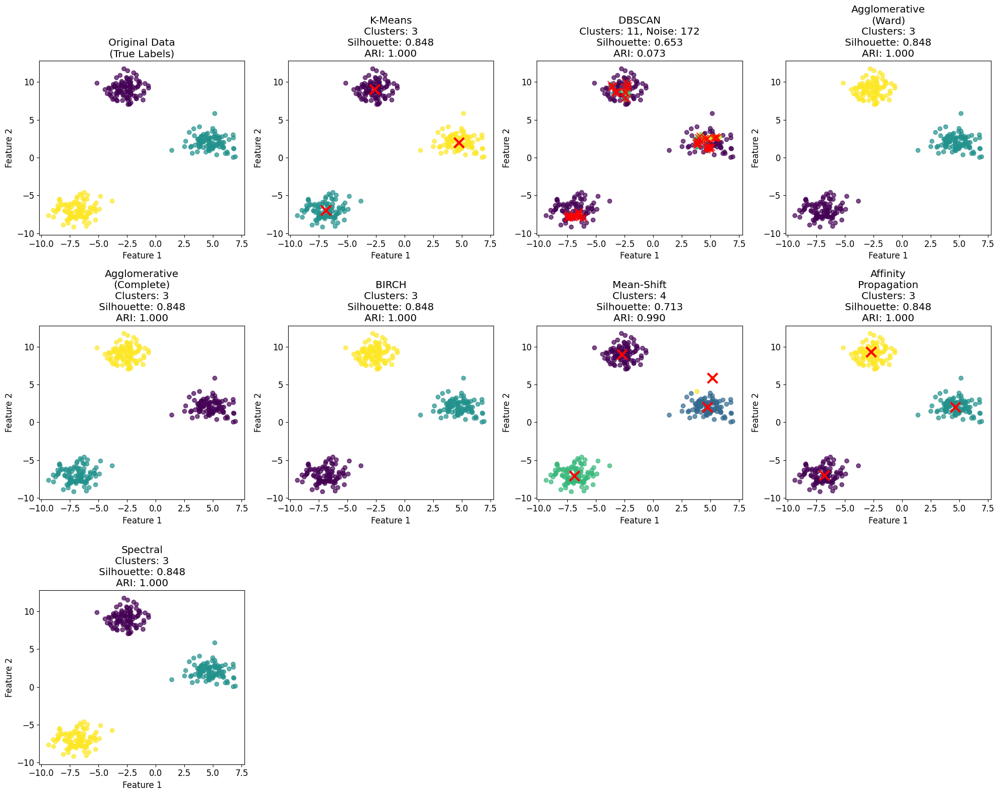


2. Testing on Moon Dataset
------------------------------
Running K-Means...
Running DBSCAN...
Running Agglomerative
(Ward)...
Running Agglomerative
(Complete)...
Running BIRCH...
Running Mean-Shift...
Running Affinity
Propagation...
Running Spectral...


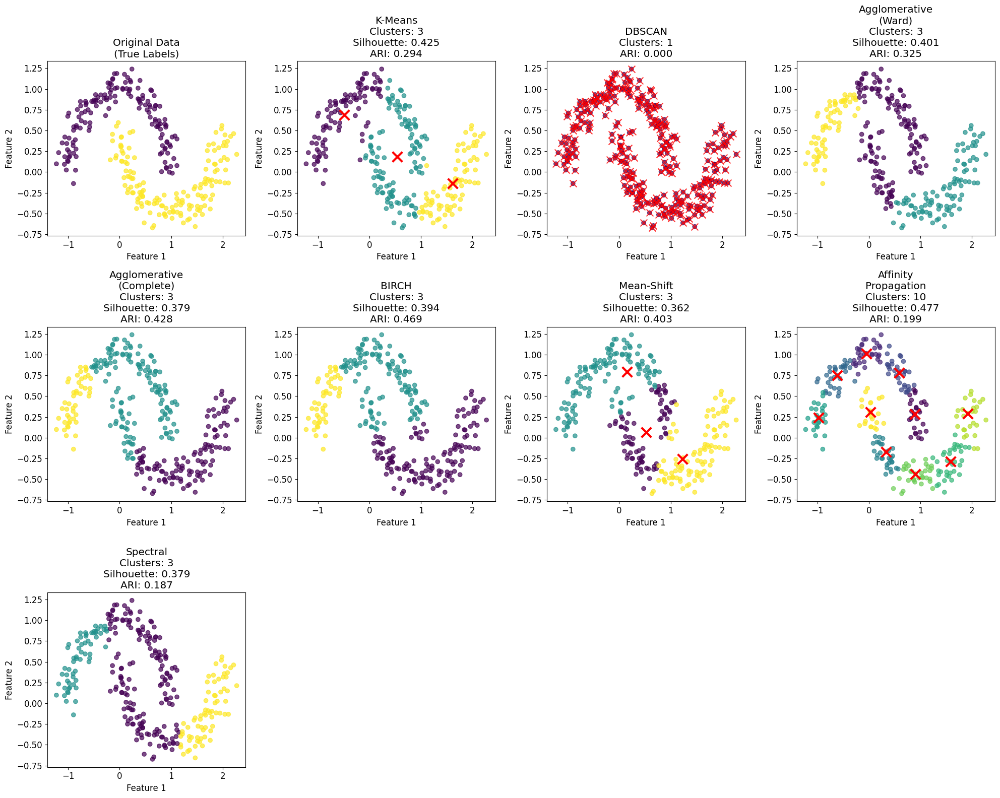


ALGORITHM PERFORMANCE SUMMARY
Algorithm           Blobs          Moons          
--------------------------------------------------
K-Means             ARI:1.00       ARI:0.29       
DBSCAN              ARI:0.07       ARI:0.00       
Agglomerative
(Ward)ARI:1.00       ARI:0.32       
Agglomerative
(Complete)ARI:1.00       ARI:0.43       
BIRCH               ARI:1.00       ARI:0.47       
Mean-Shift          ARI:0.99       ARI:0.40       
Affinity
PropagationARI:1.00       ARI:0.20       
Spectral            ARI:1.00       ARI:0.19       

Legend: ARI = Adjusted Rand Index, Sil = Silhouette Score
Higher values are better for both metrics

ALGORITHM CHARACTERISTICS

Comparing Characteristics of Implemented Algorithms:
--------------------------------------------------

K-Means:
  Cluster Shape: Spherical
  Scalability: Excellent
  Parameters: k (number of clusters)
  Outlier Handling: Poor

DBSCAN:
  Cluster Shape: Arbitrary
  Scalability: Good
  Parameters: eps, min_samples
  Outlier H

In [55]:
# Comprehensive Demonstration of Other Clustering Algorithms
# This cell compares multiple clustering algorithms

from sklearn.cluster import AgglomerativeClustering, MeanShift, AffinityPropagation, SpectralClustering
from sklearn.cluster import estimate_bandwidth
from sklearn.cluster import Birch
from sklearn.cluster import KMeans, DBSCAN # Assuming KMeans and DBSCAN are already defined and imported elsewhere
from sklearn.datasets import make_blobs, make_moons, make_circles
from sklearn.metrics import silhouette_score, adjusted_rand_score
import matplotlib.pyplot as plt
import numpy as np

def comprehensive_clustering_comparison(X, true_labels=None, figsize=(20, 16)):
    """
    Compare multiple clustering algorithms on a dataset

    Parameters:
    X: dataset
    true_labels: ground truth labels (optional)
    """

    # Estimate bandwidth for Mean-Shift
    bandwidth = estimate_bandwidth(X, quantile=0.2, n_samples=100)

    # Define algorithms
    algorithms = [
        ('K-Means', KMeans(n_clusters=3, random_state=42, n_init=10)),
        ('DBSCAN', DBSCAN(eps=0.3, min_samples=5)),
        ('Agglomerative\n(Ward)', AgglomerativeClustering(n_clusters=3, linkage='ward')),
        ('Agglomerative\n(Complete)', AgglomerativeClustering(n_clusters=3, linkage='complete')),
        ('BIRCH', Birch(n_clusters=3, threshold=0.5)),
        ('Mean-Shift', MeanShift(bandwidth=bandwidth) if bandwidth > 0 else MeanShift()),
        ('Affinity\nPropagation', AffinityPropagation(damping=0.9, random_state=42)),
        ('Spectral', SpectralClustering(n_clusters=3, random_state=42, n_init=10))
    ]

    # Calculate subplot dimensions
    n_algorithms = len(algorithms)
    n_cols = 4
    n_rows = (n_algorithms + 1) // n_cols + 1  # +1 for original data

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.ravel()

    results = []

    # Plot original data
    if true_labels is not None:
        axes[0].scatter(X[:, 0], X[:, 1], c=true_labels, cmap='viridis', alpha=0.7)
        axes[0].set_title('Original Data\n(True Labels)')
    else:
        axes[0].scatter(X[:, 0], X[:, 1], alpha=0.7, color='gray')
        axes[0].set_title('Original Data')

    axes[0].set_xlabel('Feature 1')
    axes[0].set_ylabel('Feature 2')

    # Apply each algorithm
    for i, (name, algorithm) in enumerate(algorithms):
        try:
            print(f"Running {name}...")

            # Fit algorithm
            labels = algorithm.fit_predict(X)

            # Calculate metrics
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1) if -1 in labels else 0

            # Calculate silhouette score
            if n_clusters > 1:
                if -1 in labels:  # Has noise points
                    mask = labels != -1
                    if np.sum(mask) > 1 and len(np.unique(labels[mask])) > 1:
                        sil_score = silhouette_score(X[mask], labels[mask])
                    else:
                        sil_score = -1
                else:
                    sil_score = silhouette_score(X, labels)
            else:
                sil_score = -1

            # Calculate ARI if true labels available
            if true_labels is not None:
                # from sklearn.metrics import adjusted_rand_score # Already imported
                ari_score = adjusted_rand_score(true_labels, labels)
            else:
                ari_score = None

            # Store results
            result = {
                'algorithm': name,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'silhouette': sil_score,
                'ari': ari_score,
                'labels': labels,
                'success': True
            }
            results.append(result)

            # Plot results
            ax_idx = i + 1
            scatter = axes[ax_idx].scatter(X[:, 0], X[:, 1], c=labels,
                                         cmap='viridis', alpha=0.7)

            # Add special markers for different algorithms
            if hasattr(algorithm, 'cluster_centers_'):  # K-Means, BIRCH
                axes[ax_idx].scatter(algorithm.cluster_centers_[:, 0],
                                   algorithm.cluster_centers_[:, 1],
                                   marker='x', s=200, linewidths=3, color='red')

            if hasattr(algorithm, 'core_sample_indices_') and len(algorithm.core_sample_indices_) > 0:  # DBSCAN
                axes[ax_idx].scatter(X[algorithm.core_sample_indices_, 0],
                                   X[algorithm.core_sample_indices_, 1],
                                   s=100, marker='x', color='red', alpha=0.8)

            # Create title with metrics
            title = f'{name}\nClusters: {n_clusters}'
            if n_noise > 0:
                title += f', Noise: {n_noise}'
            if sil_score != -1:
                title += f'\nSilhouette: {sil_score:.3f}'
            if ari_score is not None:
                title += f'\nARI: {ari_score:.3f}'

            axes[ax_idx].set_title(title)
            axes[ax_idx].set_xlabel('Feature 1')
            axes[ax_idx].set_ylabel('Feature 2')

        except Exception as e:
            print(f"Error with {name}: {e}")
            ax_idx = i + 1
            axes[ax_idx].text(0.5, 0.5, f'Error\n{name}\n{str(e)[:30]}...',
                             transform=axes[ax_idx].transAxes,
                             ha='center', va='center', fontsize=10)
            axes[ax_idx].set_title(f'{name}\n(Failed)')

            result = {
                'algorithm': name,
                'error': str(e),
                'success': False
            }
            results.append(result)

    # Hide unused subplots
    for i in range(len(algorithms) + 1, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    return results

# Test on different datasets
print("Comprehensive Clustering Algorithm Comparison")
print("=" * 50)

# Dataset 1: Blob data (should work well for most algorithms)
print("\n1. Testing on Blob Dataset")
print("-" * 30)
X_blobs, y_blobs = make_blobs(n_samples=300, centers=3, cluster_std=1.0, random_state=42)
blob_results = comprehensive_clustering_comparison(X_blobs, y_blobs)

# Dataset 2: Moon data (challenging for centroid-based methods)
print("\n2. Testing on Moon Dataset")
print("-" * 30)
X_moons, y_moons = make_moons(n_samples=300, noise=0.1, random_state=42)
moon_results = comprehensive_clustering_comparison(X_moons, y_moons)

# Create performance summary
def create_performance_summary(results_list, dataset_names):
    """
    Create a summary table of algorithm performance
    """

    print("\n" + "="*80)
    print("ALGORITHM PERFORMANCE SUMMARY")
    print("="*80)

    # Create summary table
    algorithms = []
    for results in results_list:
        for result in results:
            if result['success'] and result['algorithm'] not in algorithms:
                algorithms.append(result['algorithm'])

    # Print header
    print(f"{'Algorithm':<20}", end="")
    for dataset_name in dataset_names:
        print(f"{dataset_name:<15}", end="")
    print()
    print("-" * (20 + 15 * len(dataset_names)))

    # Print results for each algorithm
    for algorithm in algorithms:
        print(f"{algorithm:<20}", end="")

        for results in results_list:
            # Find result for this algorithm
            alg_result = None
            for result in results:
                if result['algorithm'] == algorithm and result['success']:
                    alg_result = result
                    break

            if alg_result:
                if alg_result['ari'] is not None:
                    score_str = f"ARI:{alg_result['ari']:.2f}"
                elif alg_result['silhouette'] != -1:
                    score_str = f"Sil:{alg_result['silhouette']:.2f}"
                else:
                    score_str = "N/A"
                print(f"{score_str:<15}", end="")
            else:
                print(f"{'Failed':<15}", end="")
        print()

    print("\nLegend: ARI = Adjusted Rand Index, Sil = Silhouette Score")
    print("Higher values are better for both metrics")

# Create performance summary
create_performance_summary([blob_results, moon_results], ["Blobs", "Moons"])

# Algorithm characteristics summary
print("\n" + "="*80)
print("ALGORITHM CHARACTERISTICS")
print("="*80)

characteristics = {
    'K-Means': {
        'Cluster Shape': 'Spherical',
        'Scalability': 'Excellent',
        'Parameters': 'k (number of clusters)',
        'Outlier Handling': 'Poor'
    },
    'DBSCAN': {
        'Cluster Shape': 'Arbitrary',
        'Scalability': 'Good',
        'Parameters': 'eps, min_samples',
        'Outlier Handling': 'Excellent'
    },
    'Agglomerative\n(Ward)': { # Modified to match the algorithm name in the list
        'Cluster Shape': 'Arbitrary (with connectivity)',
        'Scalability': 'Moderate',
        'Parameters': 'linkage, n_clusters',
        'Outlier Handling': 'Moderate'
    },
    'Agglomerative\n(Complete)': { # Added for completeness
        'Cluster Shape': 'Arbitrary (with connectivity)',
        'Scalability': 'Moderate',
        'Parameters': 'linkage, n_clusters',
        'Outlier Handling': 'Moderate'
    },
    'BIRCH': {
        'Cluster Shape': 'Spherical',
        'Scalability': 'Excellent',
        'Parameters': 'threshold, n_clusters',
        'Outlier Handling': 'Good'
    },
    'Mean-Shift': {
        'Cluster Shape': 'Arbitrary',
        'Scalability': 'Poor',
        'Parameters': 'bandwidth',
        'Outlier Handling': 'Good'
    },
    'Affinity\nPropagation': { # Modified to match the algorithm name in the list
        'Cluster Shape': 'Complex',
        'Scalability': 'Poor',
        'Parameters': 'damping',
        'Outlier Handling': 'Moderate'
    },
    'Spectral': {
        'Cluster Shape': 'Complex',
        'Scalability': 'Poor',
        'Parameters': 'n_clusters, affinity',
        'Outlier Handling': 'Moderate'
    }
}

# Print algorithm characteristics based on the algorithms list used in the comparison
print("\nComparing Characteristics of Implemented Algorithms:")
print("-" * 50)
for alg_class, alg_name, params in algorithms: # Iterate through the algorithms list to get names
     if alg_name in characteristics:
         print(f"\n{alg_name}:")
         for char_name, char_value in characteristics[alg_name].items():
             print(f"  {char_name}: {char_value}")
     else:
         print(f"\nCharacteristics for {alg_name} not available.")

# 3. Gaussian Mixtures <a id="gaussian-mixtures"></a>

## Theoretical Foundation

A Gaussian Mixture Model (GMM) is a probabilistic model that assumes data is generated from a mixture of a finite number of Gaussian distributions with unknown parameters.

### Mathematical Formulation

**Mixture Model**:
$$p(\mathbf{x}) = \sum_{k=1}^{K} \pi_k \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}_k, \boldsymbol{\Sigma}_k)$$

Where:
- $\pi_k$ are mixing coefficients (weights) with $\sum_{k=1}^{K} \pi_k = 1$
- $\boldsymbol{\mu}_k$ is the mean of component $k$
- $\boldsymbol{\Sigma}_k$ is the covariance matrix of component $k$
- $\mathcal{N}(\mathbf{x} | \boldsymbol{\mu}, \boldsymbol{\Sigma})$ is the multivariate Gaussian distribution

**Multivariate Gaussian**:
$$\mathcal{N}(\mathbf{x} | \boldsymbol{\mu}, \boldsymbol{\Sigma}) = \frac{1}{(2\pi)^{d/2} |\boldsymbol{\Sigma}|^{1/2}} \exp\left(-\frac{1}{2}(\mathbf{x} - \boldsymbol{\mu})^T \boldsymbol{\Sigma}^{-1} (\mathbf{x} - \boldsymbol{\mu})\right)$$

### Expectation-Maximization (EM) Algorithm

The EM algorithm is used to find maximum likelihood estimates of GMM parameters.

#### E-Step (Expectation)
Compute responsibility of component $k$ for data point $\mathbf{x}_n$:

$$\gamma_{nk} = \frac{\pi_k \mathcal{N}(\mathbf{x}_n | \boldsymbol{\mu}_k, \boldsymbol{\Sigma}_k)}{\sum_{j=1}^{K} \pi_j \mathcal{N}(\mathbf{x}_n | \boldsymbol{\mu}_j, \boldsymbol{\Sigma}_j)}$$

#### M-Step (Maximization)
Update parameters using current responsibilities:

**Effective number of points**: $N_k = \sum_{n=1}^{N} \gamma_{nk}$

**New means**: $\boldsymbol{\mu}_k^{\text{new}} = \frac{1}{N_k} \sum_{n=1}^{N} \gamma_{nk} \mathbf{x}_n$

**New covariances**: $\boldsymbol{\Sigma}_k^{\text{new}} = \frac{1}{N_k} \sum_{n=1}^{N} \gamma_{nk} (\mathbf{x}_n - \boldsymbol{\mu}_k^{\text{new}})(\mathbf{x}_n - \boldsymbol{\mu}_k^{\text{new}})^T$

**New mixing coefficients**: $\pi_k^{\text{new}} = \frac{N_k}{N}$

### Log-Likelihood

The objective function to maximize:
$$\ln p(\mathbf{X} | \boldsymbol{\pi}, \boldsymbol{\mu}, \boldsymbol{\Sigma}) = \sum_{n=1}^{N} \ln \left\{ \sum_{k=1}^{K} \pi_k \mathcal{N}(\mathbf{x}_n | \boldsymbol{\mu}_k, \boldsymbol{\Sigma}_k) \right\}$$

Gaussian Mixture Model Comprehensive Demonstration
Gaussian Mixture Model Analysis
Number of components: 3
Converged: True
Number of iterations: 3
Log-likelihood: -1260.49
AIC: 2554.97
BIC: 2617.94

Component Parameters:
----------------------------------------
Component 0:
  Weight: 0.325
  Mean: (2.477, 0.978)
  Covariance determinant: 1.459

Component 1:
  Weight: 0.336
  Mean: (-3.436, -3.539)
  Covariance determinant: 2.151

Component 2:
  Weight: 0.339
  Mean: (-1.336, 4.523)
  Covariance determinant: 1.810



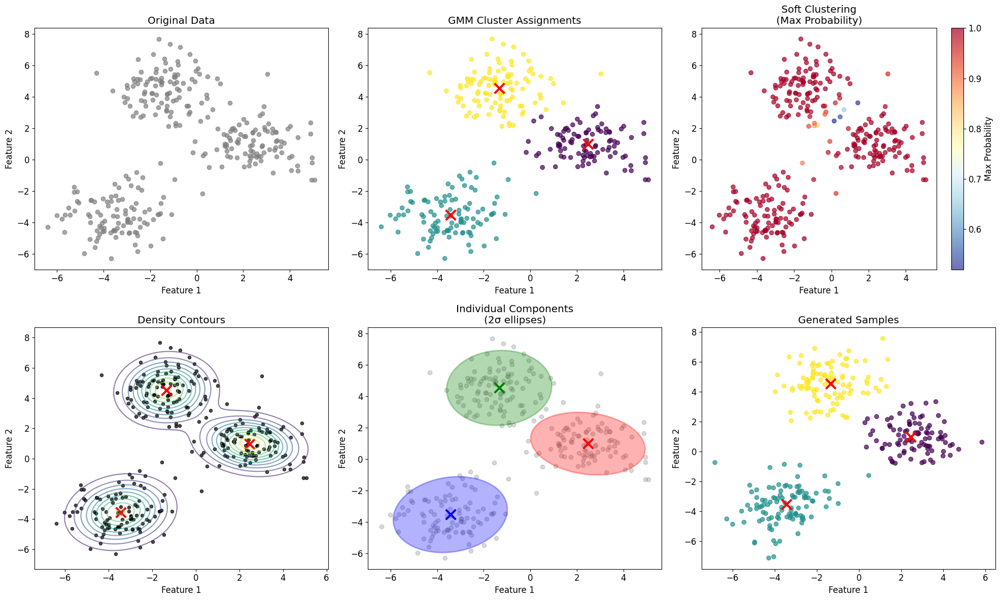


SOFT VS HARD CLUSTERING COMPARISON
Sample point assignments:
Point	Hard Label	Soft Probabilities
--------------------------------------------------
0	1		[0.000, 1.000, 0.000]
1	1		[0.000, 1.000, 0.000]
2	2		[0.067, 0.000, 0.933]
3	0		[0.992, 0.000, 0.008]
4	1		[0.000, 1.000, 0.000]

Cluster Assignment Confidence:
Mean confidence: 0.990
Std confidence: 0.053
Min confidence: 0.520
High confidence (>0.8): 98.7%


In [56]:
# Comprehensive Gaussian Mixture Model Implementation
# This cell demonstrates GMM theory and practice with detailed analysis

def demonstrate_gmm_components(X, n_components=3, figsize=(20, 12)):
    """
    Demonstrate GMM components and fitting process

    Parameters:
    X: dataset
    n_components: number of Gaussian components
    """

    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components, random_state=42, n_init=10)
    gmm.fit(X)

    print(f"Gaussian Mixture Model Analysis")
    print(f"Number of components: {n_components}")
    print(f"Converged: {gmm.converged_}")
    print(f"Number of iterations: {gmm.n_iter_}")
    print(f"Log-likelihood: {gmm.score(X) * len(X):.2f}")
    print(f"AIC: {gmm.aic(X):.2f}")
    print(f"BIC: {gmm.bic(X):.2f}")

    # Display component parameters
    print(f"\nComponent Parameters:")
    print("-" * 40)
    for i in range(n_components):
        print(f"Component {i}:")
        print(f"  Weight: {gmm.weights_[i]:.3f}")
        print(f"  Mean: ({gmm.means_[i][0]:.3f}, {gmm.means_[i][1]:.3f})")
        print(f"  Covariance determinant: {np.linalg.det(gmm.covariances_[i]):.3f}")
        print()

    # Create visualization
    fig, axes = plt.subplots(2, 3, figsize=figsize)

    # 1. Original data
    axes[0, 0].scatter(X[:, 0], X[:, 1], alpha=0.7, color='gray')
    axes[0, 0].set_title('Original Data')
    axes[0, 0].set_xlabel('Feature 1')
    axes[0, 0].set_ylabel('Feature 2')

    # 2. GMM cluster assignments
    labels = gmm.predict(X)
    axes[0, 1].scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', alpha=0.7)
    axes[0, 1].scatter(gmm.means_[:, 0], gmm.means_[:, 1],
                      marker='x', s=200, linewidths=3, color='red')
    axes[0, 1].set_title('GMM Cluster Assignments')
    axes[0, 1].set_xlabel('Feature 1')
    axes[0, 1].set_ylabel('Feature 2')

    # 3. Soft clustering (probabilities)
    responsibilities = gmm.predict_proba(X)
    # Use max probability as color intensity
    max_prob = np.max(responsibilities, axis=1)
    scatter = axes[0, 2].scatter(X[:, 0], X[:, 1], c=max_prob,
                                cmap='RdYlBu_r', alpha=0.7)
    axes[0, 2].set_title('Soft Clustering\n(Max Probability)')
    axes[0, 2].set_xlabel('Feature 1')
    axes[0, 2].set_ylabel('Feature 2')
    plt.colorbar(scatter, ax=axes[0, 2], label='Max Probability')

    # 4. Density contours
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                         np.linspace(y_min, y_max, 100))
    mesh_points = np.c_[xx.ravel(), yy.ravel()]

    # Calculate density at each point
    density = np.exp(gmm.score_samples(mesh_points))
    density = density.reshape(xx.shape)

    axes[1, 0].contour(xx, yy, density, levels=10, alpha=0.6)
    axes[1, 0].scatter(X[:, 0], X[:, 1], alpha=0.7, color='black', s=20)
    axes[1, 0].scatter(gmm.means_[:, 0], gmm.means_[:, 1],
                      marker='x', s=200, linewidths=3, color='red')
    axes[1, 0].set_title('Density Contours')
    axes[1, 0].set_xlabel('Feature 1')
    axes[1, 0].set_ylabel('Feature 2')

    # 5. Individual component contributions
    axes[1, 1].scatter(X[:, 0], X[:, 1], alpha=0.3, color='gray')

    colors = ['red', 'blue', 'green', 'purple', 'orange']
    for i in range(n_components):
        # Draw covariance ellipse
        from matplotlib.patches import Ellipse

        # Eigenvalue decomposition of covariance matrix
        eigenvals, eigenvecs = np.linalg.eigh(gmm.covariances_[i])
        angle = np.degrees(np.arctan2(eigenvecs[1, 0], eigenvecs[0, 0]))

        # 2-sigma ellipse (95% confidence)
        width, height = 2 * 2 * np.sqrt(eigenvals)

        ellipse = Ellipse(gmm.means_[i], width, height, angle=angle,
                         facecolor=colors[i % len(colors)], alpha=0.3,
                         edgecolor=colors[i % len(colors)], linewidth=2)
        axes[1, 1].add_patch(ellipse)

        # Mark center
        axes[1, 1].scatter(gmm.means_[i, 0], gmm.means_[i, 1],
                          marker='x', s=200, linewidths=3,
                          color=colors[i % len(colors)])

    axes[1, 1].set_title('Individual Components\n(2σ ellipses)')
    axes[1, 1].set_xlabel('Feature 1')
    axes[1, 1].set_ylabel('Feature 2')

    # 6. Generated samples
    X_generated, y_generated = gmm.sample(300)
    axes[1, 2].scatter(X_generated[:, 0], X_generated[:, 1],
                      c=y_generated, cmap='viridis', alpha=0.7)
    axes[1, 2].scatter(gmm.means_[:, 0], gmm.means_[:, 1],
                      marker='x', s=200, linewidths=3, color='red')
    axes[1, 2].set_title('Generated Samples')
    axes[1, 2].set_xlabel('Feature 1')
    axes[1, 2].set_ylabel('Feature 2')

    plt.tight_layout()
    plt.show()

    return gmm

# Demonstrate GMM on blob dataset
print("Gaussian Mixture Model Comprehensive Demonstration")
print("=" * 55)

# Generate appropriate dataset for GMM
X_gmm, y_gmm = make_blobs(n_samples=300, centers=3, cluster_std=1.2,
                          random_state=42, center_box=(-5.0, 5.0))

# Add some noise to make it more realistic
X_gmm += np.random.normal(0, 0.1, X_gmm.shape)

# Demonstrate GMM
fitted_gmm = demonstrate_gmm_components(X_gmm, n_components=3)

# Demonstrate soft vs hard clustering
print("\n" + "="*50)
print("SOFT VS HARD CLUSTERING COMPARISON")
print("="*50)

# Hard clustering (like K-Means)
hard_labels = fitted_gmm.predict(X_gmm)

# Soft clustering (probabilities)
soft_probs = fitted_gmm.predict_proba(X_gmm)

# Show some examples
print("Sample point assignments:")
print("Point\tHard Label\tSoft Probabilities")
print("-" * 50)
for i in range(5):
    prob_str = ", ".join([f"{p:.3f}" for p in soft_probs[i]])
    print(f"{i}\t{hard_labels[i]}\t\t[{prob_str}]")

# Calculate cluster assignment confidence
max_probs = np.max(soft_probs, axis=1)
confidence_stats = {
    'mean_confidence': np.mean(max_probs),
    'std_confidence': np.std(max_probs),
    'min_confidence': np.min(max_probs),
    'high_confidence_pct': np.mean(max_probs > 0.8) * 100
}

print(f"\nCluster Assignment Confidence:")
print(f"Mean confidence: {confidence_stats['mean_confidence']:.3f}")
print(f"Std confidence: {confidence_stats['std_confidence']:.3f}")
print(f"Min confidence: {confidence_stats['min_confidence']:.3f}")
print(f"High confidence (>0.8): {confidence_stats['high_confidence_pct']:.1f}%")

Gaussian Mixture Model Selection
Testing different numbers of components...
Components	AIC		BIC		Log-Likelihood	Silhouette
----------------------------------------------------------------------
1		3023.83		3042.35		-1506.92		N/A
2		2641.49		2682.24		-1309.75		0.593
3		2554.97		2617.94		-1260.49		0.643
4		2551.36		2636.54		-1252.68		0.525
5		2553.96		2661.37		-1247.98		0.420
6		2561.22		2690.86		-1245.61		0.354
7		2565.85		2717.71		-1241.93		0.365
8		2569.48		2743.56		-1237.74		0.232

Optimal number of components:
AIC: 4
BIC: 3
Silhouette: 3


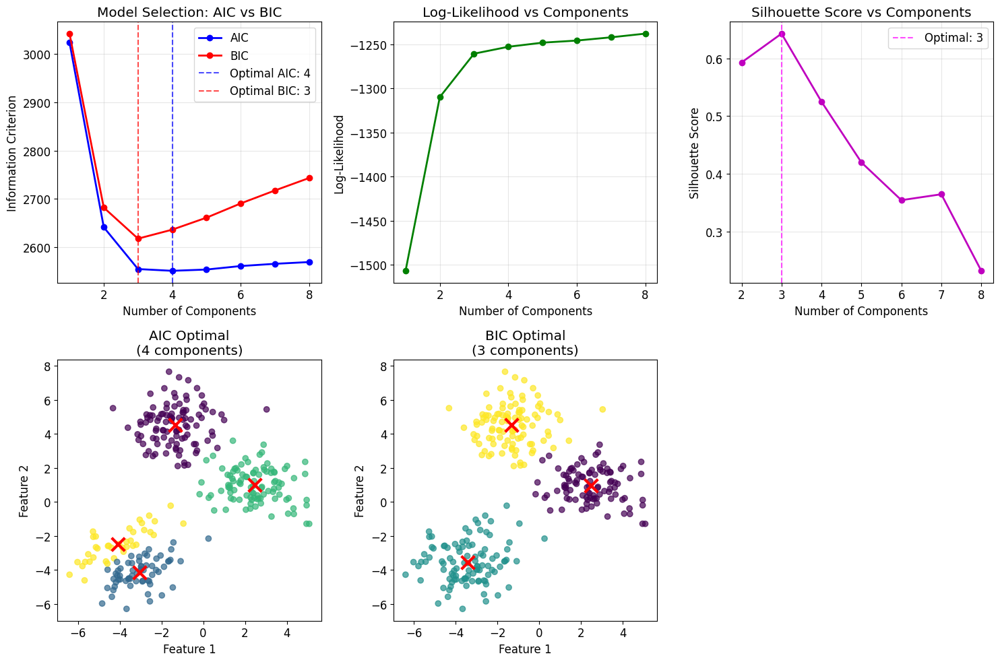


INFORMATION CRITERIA EXPLANATION
AIC (Akaike Information Criterion):
Formula: AIC = 2k - 2ln(L)
Where k = number of parameters, L = likelihood
Lower values are better
Less penalty for model complexity

BIC (Bayesian Information Criterion):
Formula: BIC = k*ln(n) - 2ln(L)
Where n = number of data points
Lower values are better
More penalty for model complexity
Generally selects simpler models than AIC

Model Selection Guidelines:
- BIC is preferred when you want simpler models
- AIC is preferred when you want better fit to data
- Consider both and domain knowledge
- Validate with silhouette analysis when clustering


In [57]:
# Model Selection for Gaussian Mixture Models
# This cell demonstrates how to select optimal number of components

def gmm_model_selection(X, max_components=10, figsize=(15, 10)):
    """
    Comprehensive model selection for GMM using AIC and BIC

    Parameters:
    X: dataset
    max_components: maximum number of components to test
    """

    n_components_range = range(1, max_components + 1)

    # Storage for results
    aic_scores = []
    bic_scores = []
    log_likelihoods = []
    silhouette_scores = []
    models = []

    print("Testing different numbers of components...")
    print("Components\tAIC\t\tBIC\t\tLog-Likelihood\tSilhouette")
    print("-" * 70)

    for n_components in n_components_range:
        # Fit GMM
        gmm = GaussianMixture(n_components=n_components, random_state=42, n_init=10)
        gmm.fit(X)

        # Calculate metrics
        aic = gmm.aic(X)
        bic = gmm.bic(X)
        log_likelihood = gmm.score(X) * len(X)  # Total log-likelihood

        # Calculate silhouette score for clustering
        if n_components > 1:
            labels = gmm.predict(X)
            if len(np.unique(labels)) > 1:
                sil_score = silhouette_score(X, labels)
            else:
                sil_score = -1
        else:
            sil_score = -1

        # Store results
        aic_scores.append(aic)
        bic_scores.append(bic)
        log_likelihoods.append(log_likelihood)
        silhouette_scores.append(sil_score)
        models.append(gmm)

        print(f"{n_components}\t\t{aic:.2f}\t\t{bic:.2f}\t\t{log_likelihood:.2f}\t\t{sil_score:.3f}" if sil_score != -1 else f"{n_components}\t\t{aic:.2f}\t\t{bic:.2f}\t\t{log_likelihood:.2f}\t\tN/A")

    # Find optimal number of components
    optimal_aic = n_components_range[np.argmin(aic_scores)]
    optimal_bic = n_components_range[np.argmin(bic_scores)]
    valid_silhouettes = [s for s in silhouette_scores if s != -1]
    if valid_silhouettes:
        optimal_sil_idx = silhouette_scores.index(max(valid_silhouettes))
        optimal_sil = n_components_range[optimal_sil_idx]
    else:
        optimal_sil = None

    print(f"\nOptimal number of components:")
    print(f"AIC: {optimal_aic}")
    print(f"BIC: {optimal_bic}")
    if optimal_sil:
        print(f"Silhouette: {optimal_sil}")

    # Visualization
    fig, axes = plt.subplots(2, 3, figsize=figsize)

    # 1. AIC and BIC curves
    axes[0, 0].plot(n_components_range, aic_scores, 'bo-', label='AIC', linewidth=2)
    axes[0, 0].plot(n_components_range, bic_scores, 'ro-', label='BIC', linewidth=2)
    axes[0, 0].axvline(x=optimal_aic, color='blue', linestyle='--', alpha=0.7, label=f'Optimal AIC: {optimal_aic}')
    axes[0, 0].axvline(x=optimal_bic, color='red', linestyle='--', alpha=0.7, label=f'Optimal BIC: {optimal_bic}')
    axes[0, 0].set_xlabel('Number of Components')
    axes[0, 0].set_ylabel('Information Criterion')
    axes[0, 0].set_title('Model Selection: AIC vs BIC')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)

    # 2. Log-likelihood curve
    axes[0, 1].plot(n_components_range, log_likelihoods, 'go-', linewidth=2)
    axes[0, 1].set_xlabel('Number of Components')
    axes[0, 1].set_ylabel('Log-Likelihood')
    axes[0, 1].set_title('Log-Likelihood vs Components')
    axes[0, 1].grid(True, alpha=0.3)

    # 3. Silhouette scores
    valid_sil_range = [n for n, s in zip(n_components_range, silhouette_scores) if s != -1]
    valid_sil_scores = [s for s in silhouette_scores if s != -1]

    if valid_sil_scores:
        axes[0, 2].plot(valid_sil_range, valid_sil_scores, 'mo-', linewidth=2)
        if optimal_sil:
            axes[0, 2].axvline(x=optimal_sil, color='magenta', linestyle='--', alpha=0.7,
                              label=f'Optimal: {optimal_sil}')
        axes[0, 2].set_xlabel('Number of Components')
        axes[0, 2].set_ylabel('Silhouette Score')
        axes[0, 2].set_title('Silhouette Score vs Components')
        axes[0, 2].legend()
        axes[0, 2].grid(True, alpha=0.3)
    else:
        axes[0, 2].text(0.5, 0.5, 'No valid\nsilhouette scores',
                       transform=axes[0, 2].transAxes, ha='center', va='center')
        axes[0, 2].set_title('Silhouette Score vs Components')

    # 4-6. Show clustering results for optimal models
    optimal_models = [optimal_aic, optimal_bic]
    model_names = ['AIC Optimal', 'BIC Optimal']

    if optimal_sil and optimal_sil not in optimal_models:
        optimal_models.append(optimal_sil)
        model_names.append('Silhouette Optimal')

    for i, (n_comp, name) in enumerate(zip(optimal_models[:3], model_names[:3])):
        if i < 3:  # Only plot first 3
            gmm_optimal = models[n_comp - 1]  # -1 because index starts at 0
            labels_optimal = gmm_optimal.predict(X)

            axes[1, i].scatter(X[:, 0], X[:, 1], c=labels_optimal, cmap='viridis', alpha=0.7)
            axes[1, i].scatter(gmm_optimal.means_[:, 0], gmm_optimal.means_[:, 1],
                              marker='x', s=200, linewidths=3, color='red')
            axes[1, i].set_title(f'{name}\n({n_comp} components)')
            axes[1, i].set_xlabel('Feature 1')
            axes[1, i].set_ylabel('Feature 2')

    # Hide unused subplot if necessary
    if len(optimal_models) < 3:
        axes[1, 2].set_visible(False)

    plt.tight_layout()
    plt.show()

    return {
        'n_components_range': list(n_components_range),
        'aic_scores': aic_scores,
        'bic_scores': bic_scores,
        'log_likelihoods': log_likelihoods,
        'silhouette_scores': silhouette_scores,
        'optimal_aic': optimal_aic,
        'optimal_bic': optimal_bic,
        'optimal_silhouette': optimal_sil,
        'models': models
    }

# Run model selection
print("Gaussian Mixture Model Selection")
print("=" * 40)

# Use the same dataset as before
selection_results = gmm_model_selection(X_gmm, max_components=8)

# Information criteria explanation
print("\n" + "="*60)
print("INFORMATION CRITERIA EXPLANATION")
print("="*60)
print("AIC (Akaike Information Criterion):")
print("Formula: AIC = 2k - 2ln(L)")
print("Where k = number of parameters, L = likelihood")
print("Lower values are better")
print("Less penalty for model complexity")
print()
print("BIC (Bayesian Information Criterion):")
print("Formula: BIC = k*ln(n) - 2ln(L)")
print("Where n = number of data points")
print("Lower values are better")
print("More penalty for model complexity")
print("Generally selects simpler models than AIC")
print()
print("Model Selection Guidelines:")
print("- BIC is preferred when you want simpler models")
print("- AIC is preferred when you want better fit to data")
print("- Consider both and domain knowledge")
print("- Validate with silhouette analysis when clustering")

Covariance Types Demonstration
Covariance Type Comparison
Type		AIC		BIC		Parameters	Complexity
-----------------------------------------------------------------
full        	2336.2		2399.2		17		O(kn²)
tied        	2383.2		2423.9		11		O(n²)
diag        	2346.4		2398.2		14		O(kn)
spherical   	2437.5		2478.3		11		O(k)


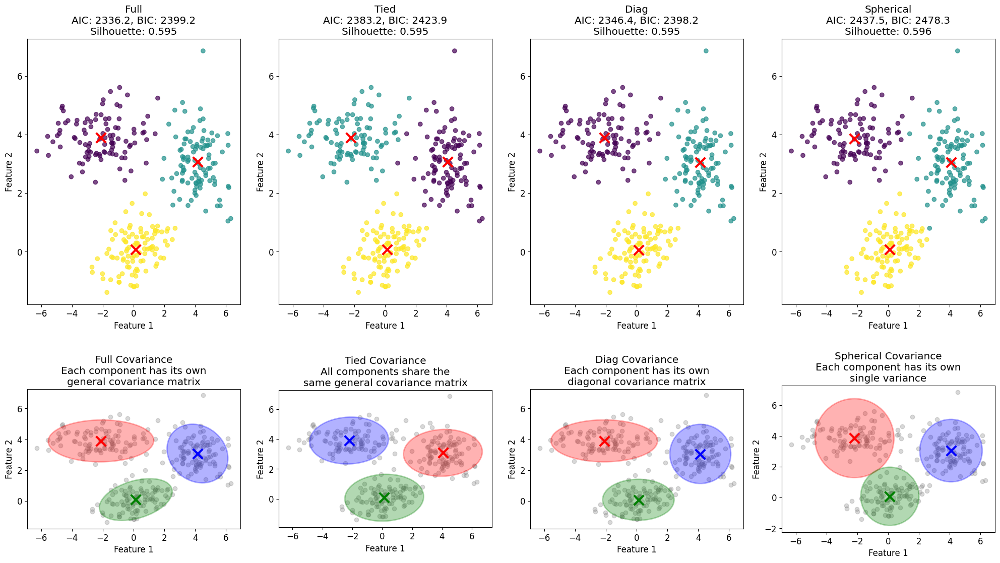


COVARIANCE TYPE ANALYSIS
Best AIC: full (2336.2)
Best BIC: diag (2398.2)
Best Silhouette: spherical (0.596)

Covariance Type Characteristics:
- Full: Most flexible, highest complexity, prone to overfitting
- Tied: Shared covariance, good for similar cluster shapes
- Diagonal: Assumes feature independence, moderate complexity
- Spherical: Simplest, assumes circular clusters


In [58]:
# Covariance Types in Gaussian Mixture Models
# This cell demonstrates different covariance constraints

def compare_covariance_types(X, n_components=3, figsize=(20, 12)):
    """
    Compare different covariance types in GMM

    Parameters:
    X: dataset
    n_components: number of components
    """

    covariance_types = ['full', 'tied', 'diag', 'spherical']

    descriptions = {
        'full': 'Each component has its own\ngeneral covariance matrix',
        'tied': 'All components share the\nsame general covariance matrix',
        'diag': 'Each component has its own\ndiagonal covariance matrix',
        'spherical': 'Each component has its own\nsingle variance'
    }

    complexity = {
        'full': 'O(kn²)',
        'tied': 'O(n²)',
        'diag': 'O(kn)',
        'spherical': 'O(k)'
    }

    fig, axes = plt.subplots(2, 4, figsize=figsize)

    results = []

    print("Covariance Type Comparison")
    print("=" * 30)
    print("Type\t\tAIC\t\tBIC\t\tParameters\tComplexity")
    print("-" * 65)

    for i, cov_type in enumerate(covariance_types):
        # Fit GMM with specific covariance type
        gmm = GaussianMixture(n_components=n_components,
                             covariance_type=cov_type,
                             random_state=42, n_init=10)
        gmm.fit(X)

        # Calculate metrics
        aic = gmm.aic(X)
        bic = gmm.bic(X)
        n_params = gmm._n_parameters()

        # Calculate silhouette score
        labels = gmm.predict(X)
        if len(np.unique(labels)) > 1:
            sil_score = silhouette_score(X, labels)
        else:
            sil_score = -1

        results.append({
            'type': cov_type,
            'aic': aic,
            'bic': bic,
            'n_params': n_params,
            'silhouette': sil_score,
            'model': gmm
        })

        print(f"{cov_type:<12}\t{aic:.1f}\t\t{bic:.1f}\t\t{n_params}\t\t{complexity[cov_type]}")

        # Plot clustering results
        axes[0, i].scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis', alpha=0.7)
        axes[0, i].scatter(gmm.means_[:, 0], gmm.means_[:, 1],
                          marker='x', s=200, linewidths=3, color='red')

        title = f'{cov_type.capitalize()}\nAIC: {aic:.1f}, BIC: {bic:.1f}'
        if sil_score != -1:
            title += f'\nSilhouette: {sil_score:.3f}'

        axes[0, i].set_title(title)
        axes[0, i].set_xlabel('Feature 1')
        axes[0, i].set_ylabel('Feature 2')

        # Plot covariance ellipses
        axes[1, i].scatter(X[:, 0], X[:, 1], alpha=0.3, color='gray')

        colors = ['red', 'blue', 'green', 'purple', 'orange']

        for j in range(n_components):
            # Get covariance matrix for this component
            if cov_type == 'full':
                cov_matrix = gmm.covariances_[j]
            elif cov_type == 'tied':
                cov_matrix = gmm.covariances_
            elif cov_type == 'diag':
                cov_matrix = np.diag(gmm.covariances_[j])
            elif cov_type == 'spherical':
                cov_matrix = np.eye(2) * gmm.covariances_[j]

            # Draw covariance ellipse
            from matplotlib.patches import Ellipse

            eigenvals, eigenvecs = np.linalg.eigh(cov_matrix)
            angle = np.degrees(np.arctan2(eigenvecs[1, 0], eigenvecs[0, 0]))

            # 2-sigma ellipse
            width, height = 2 * 2 * np.sqrt(eigenvals)

            ellipse = Ellipse(gmm.means_[j], width, height, angle=angle,
                             facecolor=colors[j % len(colors)], alpha=0.3,
                             edgecolor=colors[j % len(colors)], linewidth=2)
            axes[1, i].add_patch(ellipse)

            # Mark center
            axes[1, i].scatter(gmm.means_[j, 0], gmm.means_[j, 1],
                              marker='x', s=200, linewidths=3,
                              color=colors[j % len(colors)])

        axes[1, i].set_title(f'{cov_type.capitalize()} Covariance\n{descriptions[cov_type]}')
        axes[1, i].set_xlabel('Feature 1')
        axes[1, i].set_ylabel('Feature 2')

        # Set equal aspect ratio for better ellipse visualization
        axes[1, i].set_aspect('equal', adjustable='box')

    plt.tight_layout()
    plt.show()

    # Summary comparison
    print("\n" + "="*60)
    print("COVARIANCE TYPE ANALYSIS")
    print("="*60)

    best_aic = min(results, key=lambda x: x['aic'])
    best_bic = min(results, key=lambda x: x['bic'])
    valid_sil = [r for r in results if r['silhouette'] != -1]
    if valid_sil:
        best_sil = max(valid_sil, key=lambda x: x['silhouette'])

    print(f"Best AIC: {best_aic['type']} ({best_aic['aic']:.1f})")
    print(f"Best BIC: {best_bic['type']} ({best_bic['bic']:.1f})")
    if valid_sil:
        print(f"Best Silhouette: {best_sil['type']} ({best_sil['silhouette']:.3f})")

    print("\nCovariance Type Characteristics:")
    print("- Full: Most flexible, highest complexity, prone to overfitting")
    print("- Tied: Shared covariance, good for similar cluster shapes")
    print("- Diagonal: Assumes feature independence, moderate complexity")
    print("- Spherical: Simplest, assumes circular clusters")

    return results

# Test covariance types
print("Covariance Types Demonstration")
print("=" * 35)

# Create dataset with different cluster shapes
np.random.seed(42)
X_elliptical = np.random.multivariate_normal([0, 0], [[2, 0.5], [0.5, 0.5]], 100)
X_circular = np.random.multivariate_normal([4, 3], [[1, 0], [0, 1]], 100)
X_diagonal = np.random.multivariate_normal([-2, 4], [[3, 0], [0, 0.5]], 100)

X_mixed = np.vstack([X_elliptical, X_circular, X_diagonal])

covariance_results = compare_covariance_types(X_mixed, n_components=3)

# 4. Anomaly Detection <a id="anomaly-detection"></a>

## Theoretical Foundation

Anomaly detection (also called outlier detection) is the identification of rare items, events, or observations that raise suspicions by differing significantly from the majority of the data.

### Mathematical Framework

Given a dataset $\mathbf{X} = \{\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_m\}$, anomaly detection aims to find a function:

$$f: \mathbb{R}^n \rightarrow \{0, 1\}$$

Where $f(\mathbf{x}) = 1$ indicates an anomaly and $f(\mathbf{x}) = 0$ indicates a normal instance.

### Density-Based Anomaly Detection

**Principle**: Anomalies occur in low-density regions of the data space.

**Decision Rule**:
$$f(\mathbf{x}) = \begin{cases}
1 & \text{if } p(\mathbf{x}) < \tau \\
0 & \text{otherwise}
\end{cases}$$

Where $p(\mathbf{x})$ is the probability density and $\tau$ is a threshold.

### Using Gaussian Mixture Models for Anomaly Detection

GMM provides a natural framework for density estimation:

1. **Fit GMM** to training data (assumed to be mostly normal)
2. **Calculate density** for new instances using `score_samples()`
3. **Set threshold** based on desired false positive rate
4. **Classify** instances below threshold as anomalies

**Log-density from GMM**:
$$\log p(\mathbf{x}) = \log \sum_{k=1}^{K} \pi_k \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}_k, \boldsymbol{\Sigma}_k)$$

### Types of Anomaly Detection

1. **Novelty Detection**: Training data is clean (no anomalies)
2. **Outlier Detection**: Training data may contain anomalies
3. **One-Class Classification**: Learn boundary around normal data

Anomaly Detection with Gaussian Mixture Models
Dataset created:
Normal instances: 300
Anomaly instances: 30
Contamination rate: 9.1%
GMM fitted with 2 components
Converged: True
Log-likelihood: -1073.48

Anomaly Detection Results:
Threshold (log-density): -5.817
Predicted anomalies: 33 / 330
True anomalies: 30.0 / 330
AUC Score: 0.944


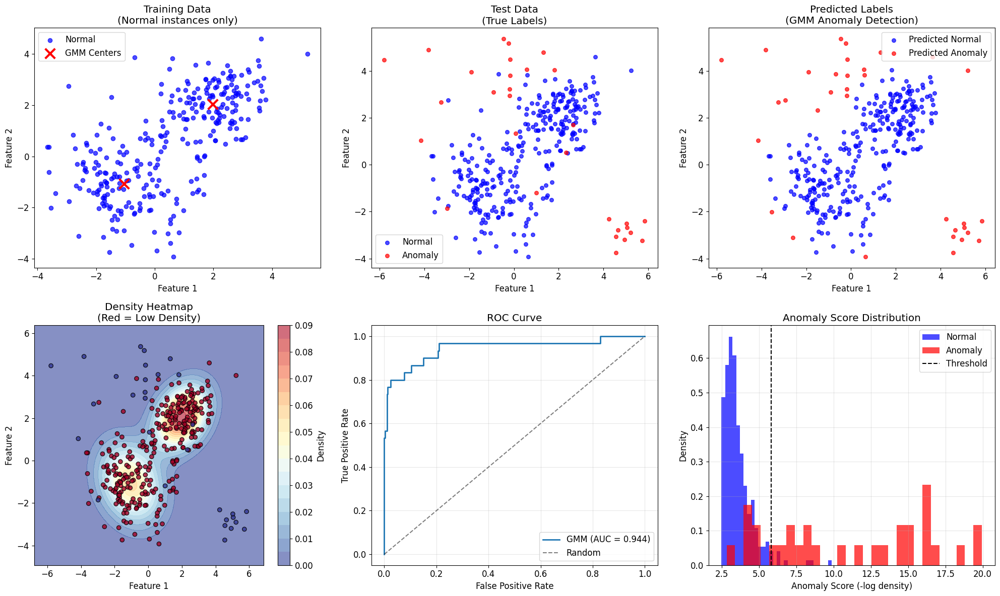


DETAILED CLASSIFICATION RESULTS
              precision    recall  f1-score   support

      Normal       0.98      0.97      0.97       300
     Anomaly       0.73      0.80      0.76        30

    accuracy                           0.95       330
   macro avg       0.85      0.89      0.87       330
weighted avg       0.96      0.95      0.96       330


Confusion Matrix:
                 Predicted
                Normal  Anomaly
Actual Normal      291       9
       Anomaly       6      24

Additional Metrics:
Precision: 0.727
Recall: 0.800
F1-Score: 0.762
False Positive Rate: 0.030
False Negative Rate: 0.200


In [59]:
# Comprehensive Anomaly Detection using Gaussian Mixture Models
# This cell demonstrates various anomaly detection techniques

def create_anomaly_dataset(n_normal=300, n_anomalies=30, random_state=42):
    """
    Create a dataset with normal data and anomalies

    Parameters:
    n_normal: number of normal instances
    n_anomalies: number of anomalies
    random_state: random seed

    Returns:
    X_normal: normal data
    X_anomalies: anomaly data
    X_combined: combined dataset
    y_true: true labels (0=normal, 1=anomaly)
    """

    np.random.seed(random_state)

    # Generate normal data (mixture of 2 Gaussians)
    n1 = n_normal // 2
    n2 = n_normal - n1

    normal1 = np.random.multivariate_normal([2, 2], [[1, 0.3], [0.3, 1]], n1)
    normal2 = np.random.multivariate_normal([-1, -1], [[1.5, -0.2], [-0.2, 1.5]], n2)

    X_normal = np.vstack([normal1, normal2])

    # Generate anomalies (scattered points far from normal data)
    anomalies = []

    # Type 1: Far outliers
    n_far = n_anomalies // 3
    anomalies.append(np.random.uniform(-6, 6, (n_far, 2)))

    # Type 2: Dense cluster in unusual location
    n_cluster = n_anomalies // 3
    anomalies.append(np.random.multivariate_normal([5, -3], [[0.2, 0], [0, 0.2]], n_cluster))

    # Type 3: Sparse points in low-density region
    n_sparse = n_anomalies - n_far - n_cluster
    anomalies.append(np.random.multivariate_normal([0, 4], [[0.5, 0], [0, 0.5]], n_sparse))

    X_anomalies = np.vstack(anomalies)

    # Combine datasets
    X_combined = np.vstack([X_normal, X_anomalies])
    y_true = np.hstack([np.zeros(n_normal), np.ones(n_anomalies)])

    return X_normal, X_anomalies, X_combined, y_true

def gmm_anomaly_detection(X_train, X_test, y_test, contamination=0.1, n_components=2):
    """
    Perform anomaly detection using Gaussian Mixture Model

    Parameters:
    X_train: training data (assumed to be mostly normal)
    X_test: test data
    y_test: true labels for test data
    contamination: expected fraction of anomalies
    n_components: number of Gaussian components

    Returns:
    Dictionary with results
    """

    # Fit GMM on training data
    gmm = GaussianMixture(n_components=n_components, random_state=42, n_init=10)
    gmm.fit(X_train)

    print(f"GMM fitted with {n_components} components")
    print(f"Converged: {gmm.converged_}")
    print(f"Log-likelihood: {gmm.score(X_train) * len(X_train):.2f}")

    # Calculate log-densities for test data
    log_densities = gmm.score_samples(X_test)
    densities = np.exp(log_densities)

    # Set threshold based on contamination rate
    threshold = np.percentile(log_densities, contamination * 100)

    # Make predictions
    y_pred = (log_densities < threshold).astype(int)

    # Calculate metrics
    from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

    # Classification metrics
    report = classification_report(y_test, y_pred, target_names=['Normal', 'Anomaly'])
    cm = confusion_matrix(y_test, y_pred)

    # ROC metrics (using negative log-density as anomaly score)
    anomaly_scores = -log_densities
    auc_score = roc_auc_score(y_test, anomaly_scores)
    fpr, tpr, thresholds = roc_curve(y_test, anomaly_scores)

    print(f"\nAnomaly Detection Results:")
    print(f"Threshold (log-density): {threshold:.3f}")
    print(f"Predicted anomalies: {np.sum(y_pred)} / {len(y_test)}")
    print(f"True anomalies: {np.sum(y_test)} / {len(y_test)}")
    print(f"AUC Score: {auc_score:.3f}")

    return {
        'gmm': gmm,
        'log_densities': log_densities,
        'densities': densities,
        'threshold': threshold,
        'y_pred': y_pred,
        'anomaly_scores': anomaly_scores,
        'classification_report': report,
        'confusion_matrix': cm,
        'auc_score': auc_score,
        'fpr': fpr,
        'tpr': tpr,
        'roc_thresholds': thresholds
    }

# Create anomaly detection dataset
print("Anomaly Detection with Gaussian Mixture Models")
print("=" * 50)

X_normal, X_anomalies, X_combined, y_combined = create_anomaly_dataset()

print(f"Dataset created:")
print(f"Normal instances: {len(X_normal)}")
print(f"Anomaly instances: {len(X_anomalies)}")
print(f"Contamination rate: {len(X_anomalies) / len(X_combined) * 100:.1f}%")

# Split data for anomaly detection
# Use only normal data for training (novelty detection scenario)
X_train = X_normal
X_test = X_combined
y_test = y_combined

# Perform anomaly detection
ad_results = gmm_anomaly_detection(X_train, X_test, y_test, contamination=0.1, n_components=2)

# Visualize results
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

# 1. Training data (normal only)
axes[0, 0].scatter(X_train[:, 0], X_train[:, 1], alpha=0.7, color='blue', label='Normal')
axes[0, 0].scatter(ad_results['gmm'].means_[:, 0], ad_results['gmm'].means_[:, 1],
                  marker='x', s=200, linewidths=3, color='red', label='GMM Centers')
axes[0, 0].set_title('Training Data\n(Normal instances only)')
axes[0, 0].set_xlabel('Feature 1')
axes[0, 0].set_ylabel('Feature 2')
axes[0, 0].legend()

# 2. Test data with true labels
normal_mask = y_test == 0
anomaly_mask = y_test == 1
axes[0, 1].scatter(X_test[normal_mask, 0], X_test[normal_mask, 1],
                  alpha=0.7, color='blue', label='Normal', s=30)
axes[0, 1].scatter(X_test[anomaly_mask, 0], X_test[anomaly_mask, 1],
                  alpha=0.7, color='red', label='Anomaly', s=30)
axes[0, 1].set_title('Test Data\n(True Labels)')
axes[0, 1].set_xlabel('Feature 1')
axes[0, 1].set_ylabel('Feature 2')
axes[0, 1].legend()

# 3. Predicted anomalies
predicted_normal = ad_results['y_pred'] == 0
predicted_anomaly = ad_results['y_pred'] == 1
axes[0, 2].scatter(X_test[predicted_normal, 0], X_test[predicted_normal, 1],
                  alpha=0.7, color='blue', label='Predicted Normal', s=30)
axes[0, 2].scatter(X_test[predicted_anomaly, 0], X_test[predicted_anomaly, 1],
                  alpha=0.7, color='red', label='Predicted Anomaly', s=30)
axes[0, 2].set_title('Predicted Labels\n(GMM Anomaly Detection)')
axes[0, 2].set_xlabel('Feature 1')
axes[0, 2].set_ylabel('Feature 2')
axes[0, 2].legend()

# 4. Density heatmap
x_min, x_max = X_test[:, 0].min() - 1, X_test[:, 0].max() + 1
y_min, y_max = X_test[:, 1].min() - 1, X_test[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100),
                     np.linspace(y_min, y_max, 100))
mesh_points = np.c_[xx.ravel(), yy.ravel()]
mesh_densities = np.exp(ad_results['gmm'].score_samples(mesh_points))
mesh_densities = mesh_densities.reshape(xx.shape)

contour = axes[1, 0].contourf(xx, yy, mesh_densities, levels=20, cmap='RdYlBu_r', alpha=0.6)
axes[1, 0].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='RdYlBu',
                  edgecolors='black', alpha=0.8)
axes[1, 0].set_title('Density Heatmap\n(Red = Low Density)')
axes[1, 0].set_xlabel('Feature 1')
axes[1, 0].set_ylabel('Feature 2')
plt.colorbar(contour, ax=axes[1, 0], label='Density')

# 5. ROC Curve
axes[1, 1].plot(ad_results['fpr'], ad_results['tpr'], linewidth=2,
               label=f'GMM (AUC = {ad_results["auc_score"]:.3f})')
axes[1, 1].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Random')
axes[1, 1].set_xlabel('False Positive Rate')
axes[1, 1].set_ylabel('True Positive Rate')
axes[1, 1].set_title('ROC Curve')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

# 6. Anomaly scores histogram
normal_scores = ad_results['anomaly_scores'][y_test == 0]
anomaly_scores = ad_results['anomaly_scores'][y_test == 1]

axes[1, 2].hist(normal_scores, bins=30, alpha=0.7, label='Normal', color='blue', density=True)
axes[1, 2].hist(anomaly_scores, bins=30, alpha=0.7, label='Anomaly', color='red', density=True)
axes[1, 2].axvline(-ad_results['threshold'], color='black', linestyle='--',
                  label=f'Threshold')
axes[1, 2].set_xlabel('Anomaly Score (-log density)')
axes[1, 2].set_ylabel('Density')
axes[1, 2].set_title('Anomaly Score Distribution')
axes[1, 2].legend()
axes[1, 2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print detailed results
print("\n" + "="*50)
print("DETAILED CLASSIFICATION RESULTS")
print("="*50)
print(ad_results['classification_report'])

print(f"\nConfusion Matrix:")
print(f"                 Predicted")
print(f"                Normal  Anomaly")
print(f"Actual Normal     {ad_results['confusion_matrix'][0,0]:4d}    {ad_results['confusion_matrix'][0,1]:4d}")
print(f"       Anomaly    {ad_results['confusion_matrix'][1,0]:4d}    {ad_results['confusion_matrix'][1,1]:4d}")

# Calculate additional metrics
tn, fp, fn, tp = ad_results['confusion_matrix'].ravel()
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

print(f"\nAdditional Metrics:")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")
print(f"F1-Score: {f1_score:.3f}")
print(f"False Positive Rate: {fp / (fp + tn):.3f}")
print(f"False Negative Rate: {fn / (fn + tp):.3f}")

Comparing Anomaly Detection Methods
Method			AUC	Precision	Recall	F1
-------------------------------------------------------
GMM                 	0.945	0.727		0.800	0.762
Isolation Forest    	0.932	0.464		0.867	0.605
One-Class SVM       	0.929	0.455		0.833	0.588
Local Outlier Factor	Failed: This 'LocalOutlierFactor' has ...
Elliptic Envelope   	0.919	0.444		0.800	0.571


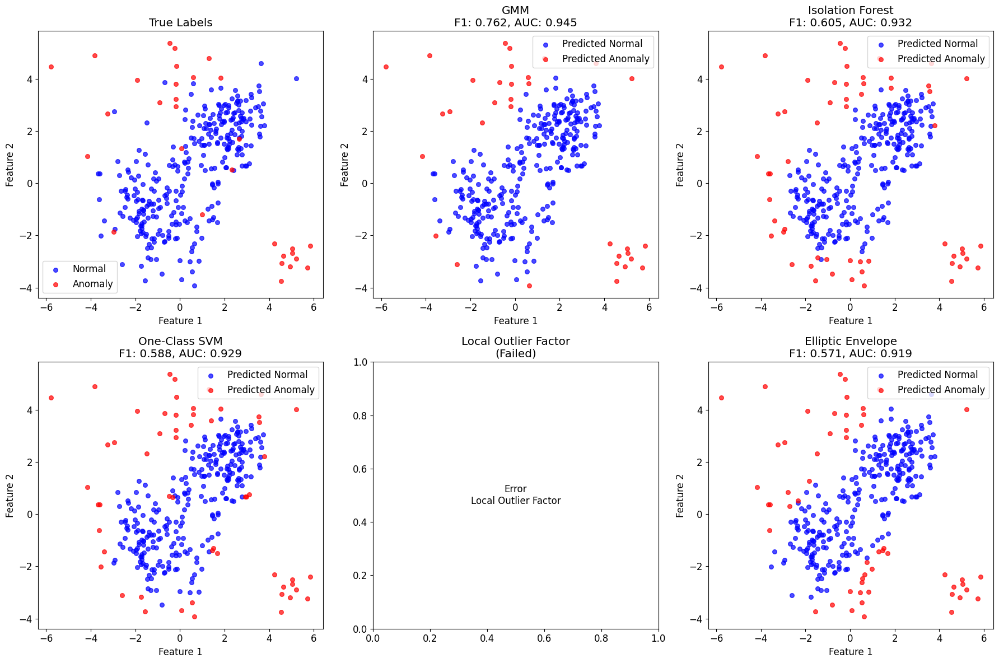

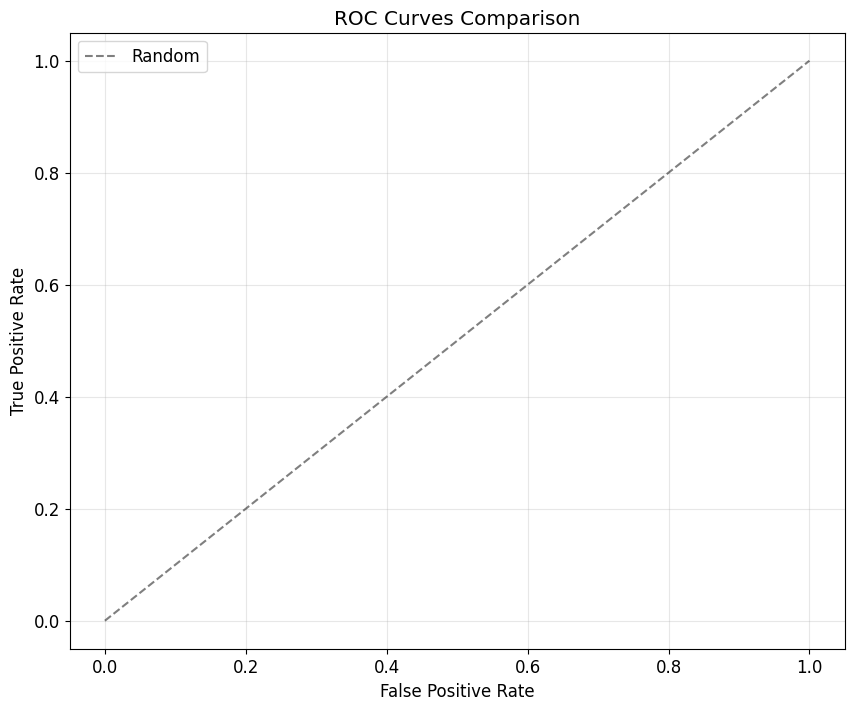


ANOMALY DETECTION METHODS SUMMARY
Best F1 Score: GMM (0.762)
Best AUC: GMM (0.945)
Best Precision: GMM (0.727)
Best Recall: Isolation Forest (0.867)

Method Characteristics:
- GMM: Good for density-based anomalies, handles multiple modes
- Isolation Forest: Fast, works well in high dimensions
- One-Class SVM: Good for non-linear boundaries, kernel flexibility
- Local Outlier Factor: Detects local density deviations
- Elliptic Envelope: Assumes Gaussian distribution, robust to outliers


In [60]:
# Comparison of Different Anomaly Detection Methods
# This cell compares multiple anomaly detection algorithms

def compare_anomaly_detection_methods(X_train, X_test, y_test, contamination=0.1):
    """
    Compare different anomaly detection methods

    Parameters:
    X_train: training data
    X_test: test data
    y_test: true labels
    contamination: expected fraction of anomalies
    """

    methods = [
        ('GMM', GaussianMixture(n_components=2, random_state=42)),
        ('Isolation Forest', IsolationForest(contamination=contamination, random_state=42)),
        ('One-Class SVM', OneClassSVM(nu=contamination)),
        ('Local Outlier Factor', LocalOutlierFactor(n_neighbors=20, contamination=contamination)),
        ('Elliptic Envelope', EllipticEnvelope(contamination=contamination, random_state=42))
    ]

    results = []

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.ravel()

    # Plot original data
    normal_mask = y_test == 0
    anomaly_mask = y_test == 1
    axes[0].scatter(X_test[normal_mask, 0], X_test[normal_mask, 1],
                   alpha=0.7, color='blue', label='Normal', s=30)
    axes[0].scatter(X_test[anomaly_mask, 0], X_test[anomaly_mask, 1],
                   alpha=0.7, color='red', label='Anomaly', s=30)
    axes[0].set_title('True Labels')
    axes[0].set_xlabel('Feature 1')
    axes[0].set_ylabel('Feature 2')
    axes[0].legend()

    print("Comparing Anomaly Detection Methods")
    print("=" * 40)
    print("Method\t\t\tAUC\tPrecision\tRecall\tF1")
    print("-" * 55)

    for i, (name, method) in enumerate(methods):
        try:
            if name == 'GMM':
                # Special handling for GMM
                method.fit(X_train)
                log_densities = method.score_samples(X_test)
                threshold = np.percentile(log_densities, contamination * 100)
                y_pred = (log_densities < threshold).astype(int)
                anomaly_scores = -log_densities

            elif name == 'Local Outlier Factor':
                # LOF is transductive (needs both training and test data)
                method.fit(X_train)
                y_pred = method.predict(X_test)
                y_pred = (y_pred == -1).astype(int)  # Convert -1/1 to 0/1
                anomaly_scores = -method.score_samples(X_test)  # Negative LOF scores

            else:
                # Standard scikit-learn interface
                method.fit(X_train)
                y_pred = method.predict(X_test)
                y_pred = (y_pred == -1).astype(int)  # Convert -1/1 to 0/1

                if hasattr(method, 'score_samples'):
                    anomaly_scores = -method.score_samples(X_test)
                elif hasattr(method, 'decision_function'):
                    anomaly_scores = -method.decision_function(X_test)
                else:
                    anomaly_scores = np.random.random(len(X_test))  # Fallback

            # Calculate metrics
            from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)

            try:
                auc = roc_auc_score(y_test, anomaly_scores)
            except:
                auc = 0.5  # Random performance if AUC calculation fails

            # Store results
            result = {
                'method': name,
                'y_pred': y_pred,
                'anomaly_scores': anomaly_scores,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'auc': auc,
                'success': True
            }
            results.append(result)

            print(f"{name:<20}\t{auc:.3f}\t{precision:.3f}\t\t{recall:.3f}\t{f1:.3f}")

            # Plot results
            if i + 1 < len(axes):
                predicted_normal = y_pred == 0
                predicted_anomaly = y_pred == 1

                axes[i + 1].scatter(X_test[predicted_normal, 0], X_test[predicted_normal, 1],
                                   alpha=0.7, color='blue', label='Predicted Normal', s=30)
                axes[i + 1].scatter(X_test[predicted_anomaly, 0], X_test[predicted_anomaly, 1],
                                   alpha=0.7, color='red', label='Predicted Anomaly', s=30)

                axes[i + 1].set_title(f'{name}\nF1: {f1:.3f}, AUC: {auc:.3f}')
                axes[i + 1].set_xlabel('Feature 1')
                axes[i + 1].set_ylabel('Feature 2')
                axes[i + 1].legend()

        except Exception as e:
            print(f"{name:<20}\tFailed: {str(e)[:30]}...")
            result = {
                'method': name,
                'error': str(e),
                'success': False
            }
            results.append(result)

            if i + 1 < len(axes):
                axes[i + 1].text(0.5, 0.5, f'Error\n{name}',
                                 transform=axes[i + 1].transAxes,
                                 ha='center', va='center')
                axes[i + 1].set_title(f'{name}\n(Failed)')

    # Hide unused subplots
    for i in range(len(methods) + 1, len(axes)):
        axes[i].set_visible(False)

    plt.tight_layout()
    plt.show()

    # ROC comparison
    plt.figure(figsize=(10, 8))

    for result in results:
        if result['success']:
            try:
                fpr, tpr, _ = roc_curve(y_test, result['anomaly_scores'])
                plt.plot(fpr, tpr, linewidth=2,
                        label=f"{result['method']} (AUC = {result['auc']:.3f})")
            except:
                pass

    plt.plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Random')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves Comparison')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

    return results

# Compare different anomaly detection methods
comparison_results = compare_anomaly_detection_methods(X_normal, X_combined, y_combined, contamination=0.1)

# Performance summary
print("\n" + "="*60)
print("ANOMALY DETECTION METHODS SUMMARY")
print("="*60)

successful_results = [r for r in comparison_results if r['success']]
if successful_results:
    best_f1 = max(successful_results, key=lambda x: x['f1'])
    best_auc = max(successful_results, key=lambda x: x['auc'])
    best_precision = max(successful_results, key=lambda x: x['precision'])
    best_recall = max(successful_results, key=lambda x: x['recall'])

    print(f"Best F1 Score: {best_f1['method']} ({best_f1['f1']:.3f})")
    print(f"Best AUC: {best_auc['method']} ({best_auc['auc']:.3f})")
    print(f"Best Precision: {best_precision['method']} ({best_precision['precision']:.3f})")
    print(f"Best Recall: {best_recall['method']} ({best_recall['recall']:.3f})")

print("\nMethod Characteristics:")
print("- GMM: Good for density-based anomalies, handles multiple modes")
print("- Isolation Forest: Fast, works well in high dimensions")
print("- One-Class SVM: Good for non-linear boundaries, kernel flexibility")
print("- Local Outlier Factor: Detects local density deviations")
print("- Elliptic Envelope: Assumes Gaussian distribution, robust to outliers")

# 5. Exercises and Solutions <a id="exercises"></a>

This section provides detailed solutions to all exercises from Chapter 9 of the Hands-On Machine Learning book, with theoretical explanations and practical implementations.

---

## Exercise 1: Definition and Algorithms

**Question**: How would you define clustering? Can you name a few clustering algorithms?

**Theoretical Answer**:

**Clustering Definition**: Clustering is an unsupervised machine learning task that involves grouping similar data points together into clusters, such that:
- Points within the same cluster are more similar to each other
- Points in different clusters are more dissimilar
- No predefined target labels are used

**Mathematical Formulation**: Given dataset $\mathbf{X} = \{\mathbf{x}_1, \mathbf{x}_2, \ldots, \mathbf{x}_m\}$, clustering creates partition $\{C_1, C_2, \ldots, C_k\}$ where:
- $\bigcup_{i=1}^{k} C_i = \mathbf{X}$ (completeness)
- $C_i \cap C_j = \emptyset$ for $i \neq j$ (non-overlapping)
- $C_i \neq \emptyset$ for all $i$ (non-empty)

**Common Clustering Algorithms**:
1. **K-Means**: Partitions data into k spherical clusters
2. **DBSCAN**: Density-based clustering with noise detection
3. **Hierarchical Clustering**: Creates tree of clusters (agglomerative/divisive)
4. **Gaussian Mixture Models**: Probabilistic clustering with soft assignments
5. **Mean-Shift**: Mode-seeking algorithm for arbitrary cluster shapes
6. **Spectral Clustering**: Uses graph theory for complex cluster shapes

---

## Exercise 2: Applications

**Question**: What are some of the main applications of clustering algorithms?

**Theoretical Answer**:

**Primary Applications**:

1. **Customer Segmentation**
   - Group customers by purchasing behavior, demographics
   - Enable targeted marketing and personalization
   - Mathematical basis: Similarity in feature space $\sim$ behavioral similarity

2. **Image Segmentation**
   - Partition image pixels by color, texture, or semantic meaning
   - Applications: Medical imaging, object detection
   - Process: Cluster pixels in color/feature space

3. **Gene Expression Analysis**
   - Group genes with similar expression patterns
   - Discover functional relationships and pathways
   - High-dimensional clustering in expression space

4. **Market Research**
   - Identify consumer segments and preferences
   - Product positioning and pricing strategies
   - Cluster analysis of survey responses

5. **Dimensionality Reduction**
   - Replace high-dimensional data with cluster assignments
   - Transform: $\mathbf{x} \in \mathbb{R}^n \rightarrow \mathbf{z} \in \mathbb{R}^k$ where $k < n$
   - Preserve essential structure with lower complexity

6. **Anomaly Detection**
   - Identify outliers as points far from cluster centers
   - Applications: Fraud detection, quality control
   - Threshold-based: $d(\mathbf{x}, C_i) > \tau$ for all clusters $C_i$

---

## Exercise 3: Selecting Number of Clusters

**Question**: Describe two techniques to select the right number of clusters when using K-Means.

**Theoretical Answer**:

### 1. Elbow Method

**Principle**: Plot inertia (WCSS) vs. number of clusters and find the "elbow" point.

**Mathematical Foundation**:
$$\text{Inertia}(k) = \sum_{i=1}^{m} \min_{j \in \{1,\ldots,k\}} \|\mathbf{x}_i - \boldsymbol{\mu}_j\|^2$$

**Algorithm**:
1. Compute inertia for $k = 1, 2, \ldots, k_{\max}$
2. Plot $\text{Inertia}(k)$ vs. $k$
3. Find point where decrease rate changes dramatically
4. Mathematically: Find $k^*$ where $\frac{d^2}{dk^2}\text{Inertia}(k)$ is maximum

**Limitations**:
- Subjective interpretation
- May not work for all data distributions

### 2. Silhouette Analysis

**Principle**: Measure how well-separated clusters are using silhouette coefficient.

**Silhouette Coefficient**:
$$s(i) = \frac{b(i) - a(i)}{\max(a(i), b(i))}$$

Where:
- $a(i) = \frac{1}{|C_i| - 1} \sum_{j \in C_i, j \neq i} d(i,j)$ (intra-cluster distance)
- $b(i) = \min_{k \neq i} \frac{1}{|C_k|} \sum_{j \in C_k} d(i,j)$ (nearest-cluster distance)

**Silhouette Score**:
$$\text{Silhouette Score} = \frac{1}{m} \sum_{i=1}^{m} s(i)$$

**Interpretation**:
- $s(i) \approx 1$: Well-clustered
- $s(i) \approx 0$: On cluster boundary
- $s(i) \approx -1$: Possibly wrong cluster

**Algorithm**:
1. Compute silhouette score for different $k$ values
2. Choose $k$ with highest silhouette score
3. Analyze silhouette diagrams for cluster quality

---

## Exercise 4: Label Propagation

**Question**: What is label propagation? Why would you implement it, and how?

**Theoretical Answer**:

**Definition**: Label propagation is a semi-supervised learning technique that spreads known labels to unlabeled instances based on similarity or cluster membership.

**Mathematical Framework**:
Given:
- Labeled set: $\mathcal{L} = \{(\mathbf{x}_i, y_i)\}_{i=1}^{l}$
- Unlabeled set: $\mathcal{U} = \{\mathbf{x}_j\}_{j=1}^{u}$
- Clustering partition: $\{C_1, C_2, \ldots, C_k\}$

**Propagation Rule**:
For unlabeled point $\mathbf{x}_j \in C_i$:
$$\hat{y}_j = \arg\max_{y} \sum_{\mathbf{x}_l \in \mathcal{L} \cap C_i} \mathbb{I}(y_l = y)$$

**Why Implement**:
1. **Label scarcity**: Manual labeling is expensive and time-consuming
2. **Performance improvement**: More labeled data $\rightarrow$ better supervised learning
3. **Cost efficiency**: Leverage abundant unlabeled data
4. **Domain adaptation**: Transfer labels across similar domains

**Implementation Approaches**:

1. **Cluster-based Propagation**:
   ```
   1. Cluster all data (labeled + unlabeled)
   2. For each cluster:
      a. Find majority label among labeled points
      b. Assign this label to all unlabeled points
   3. Train classifier on expanded labeled set
   ```

2. **Representative-based Propagation**:
   ```
   1. Find representative instances (closest to centroids)
   2. Label representatives manually or via majority vote
   3. Propagate representative labels to cluster members
   ```

3. **Confidence-based Propagation**:
   ```
   1. Propagate labels as above
   2. Use only high-confidence propagations
   3. Confidence ∝ distance to cluster centroid
   ```

**Benefits**:
- Significant label expansion (10x-100x increase possible)
- Improved classifier performance
- Better generalization to unlabeled data distribution

---

## Exercise 5: Scalable Algorithms

**Question**: Can you name two clustering algorithms that can scale to large datasets? And two that look for regions of high density?

**Theoretical Answer**:

### Scalable Algorithms:

**1. K-Means**
- **Complexity**: $O(mknt)$ where $m$ = instances, $k$ = clusters, $n$ = features, $t$ = iterations
- **Scalability features**:
  - Linear in number of instances
  - Fast convergence (typically few iterations)
  - Easily parallelizable
  - Mini-batch variant for streaming data
- **Memory**: $O(kn)$ for centroids

**2. BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies)**
- **Complexity**: $O(m)$ single pass through data
- **Scalability features**:
  - Incremental clustering
  - Constant memory usage
  - Handles streaming data
  - Compact cluster summaries (CF vectors)
- **CF Vector**: $(n, LS, SS)$ where $n$ = count, $LS$ = linear sum, $SS$ = sum of squares

### High-Density Region Algorithms:

**1. DBSCAN (Density-Based Spatial Clustering)**
- **Principle**: Clusters are dense regions separated by sparse regions
- **Density definition**: Point $p$ is dense if $|N_\epsilon(p)| \geq \text{min_samples}$
- **Algorithm**:
  ```
  For each unvisited point p:
    Find neighbors within ε
    If neighbors ≥ min_samples:
      Start new cluster
      Expand cluster by density-reachability
    Else: mark as noise
  ```

**2. Mean-Shift**
- **Principle**: Find modes (peaks) of probability density function
- **Mean-shift vector**: $\mathbf{m}(\mathbf{x}) = \frac{\sum K(\mathbf{x}_i - \mathbf{x}) \mathbf{x}_i}{\sum K(\mathbf{x}_i - \mathbf{x})} - \mathbf{x}$
- **Algorithm**:
  ```
  For each data point:
    1. Place window at point
    2. Calculate mean of points in window
    3. Shift window to mean
    4. Repeat until convergence
    5. Points converging to same mode = cluster
  ```

**Comparison**:
- **DBSCAN**: Better for arbitrary shapes, handles noise explicitly
- **Mean-Shift**: Automatically determines number of clusters, follows density gradients

---

Exercise 6: Active Learning

Theoretical Answer:

USE CASE: Medical Image Diagnosis

Scenario: Radiologist needs to classify X-rays as normal/abnormal
- Dataset: 10,000 X-ray images
- Problem: Manual labeling by expert radiologist is expensive (~$50/image)
- Goal: Achieve high accuracy with minimal labeling cost

MATHEMATICAL FRAMEWORK:

Active Learning Query Strategy:
Given current model f and unlabeled pool U, select instance x* that maximizes:

x* = argmax_{x ∈ U} φ(x, f)

Where φ(x, f) is the informativeness measure.

COMMON QUERY STRATEGIES:

1. Uncertainty Sampling:
   φ(x, f) = 1 - max_y P(y|x, f)
   
2. Query by Committee:
   φ(x, f) = H[P_committee(y|x)] (entropy of committee predictions)
   
3. Expected Model Change:
   φ(x, f) = ||θ_current - E[θ_new|x,y]||

IMPLEMENTATION ALGORITHM:

1. Start with small labeled set L
2. Train initial model f on L
3. While budget > 0:
   a. Score all unlabeled instances using query strategy
   b. Select k most informative instances
   c. Que

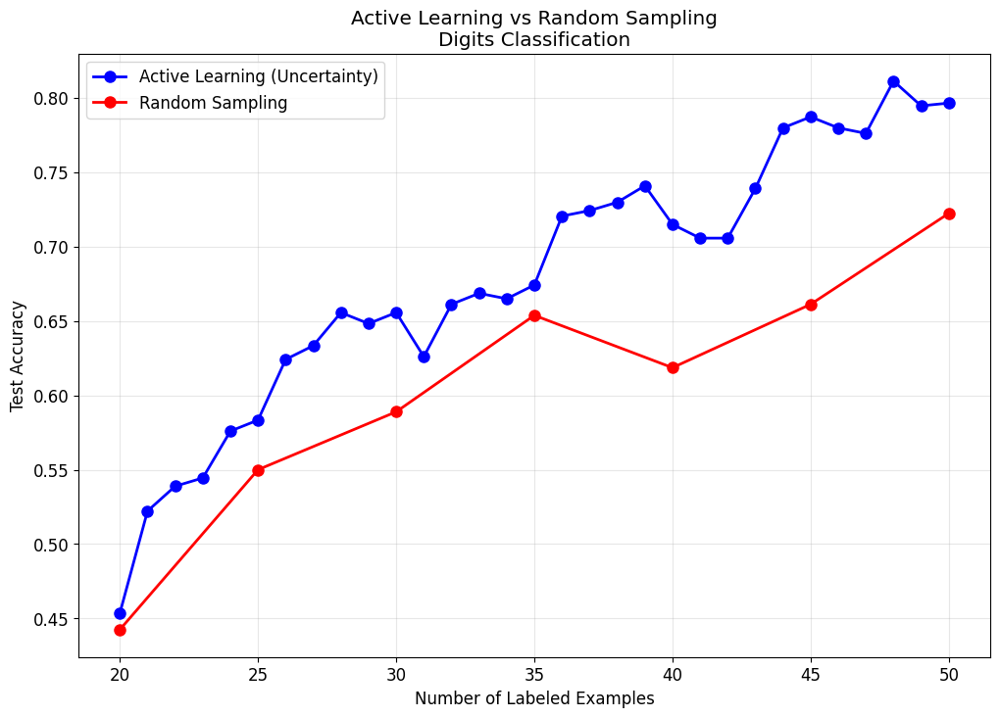


Final Results:
Active Learning Accuracy: 0.7963
Random Sampling Accuracy: 0.7222
Relative Improvement: 10.3%


In [61]:
# Exercise 6: Active Learning Implementation
# Question: Can you think of a use case where active learning would be useful? How would you implement it?

print("Exercise 6: Active Learning")
print("=" * 30)
print("\nTheoretical Answer:")
print(
"""
USE CASE: Medical Image Diagnosis

Scenario: Radiologist needs to classify X-rays as normal/abnormal
- Dataset: 10,000 X-ray images
- Problem: Manual labeling by expert radiologist is expensive (~$50/image)
- Goal: Achieve high accuracy with minimal labeling cost

MATHEMATICAL FRAMEWORK:

Active Learning Query Strategy:
Given current model f and unlabeled pool U, select instance x* that maximizes:

x* = argmax_{x ∈ U} φ(x, f)

Where φ(x, f) is the informativeness measure.

COMMON QUERY STRATEGIES:

1. Uncertainty Sampling:
   φ(x, f) = 1 - max_y P(y|x, f)

2. Query by Committee:
   φ(x, f) = H[P_committee(y|x)] (entropy of committee predictions)

3. Expected Model Change:
   φ(x, f) = ||θ_current - E[θ_new|x,y]||

IMPLEMENTATION ALGORITHM:

1. Start with small labeled set L
2. Train initial model f on L
3. While budget > 0:
   a. Score all unlabeled instances using query strategy
   b. Select k most informative instances
   c. Query oracle (expert) for labels
   d. Add labeled instances to L
   e. Retrain model f
   f. Evaluate performance
4. Return final model

EXPECTED BENEFITS:
- 70-90% reduction in labeling cost
- Faster convergence to target accuracy
- Better handling of class imbalance
"""
)

def simulate_active_learning(X, y, initial_labeled=10, budget=50, query_strategy='uncertainty'):
    """
    Simulate active learning process

    Parameters:
    X: feature matrix
    y: true labels
    initial_labeled: initial number of labeled examples
    budget: number of queries allowed
    query_strategy: 'uncertainty', 'margin', or 'entropy'
    """

    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import train_test_split
    import scipy.stats as stats

    # Split into train/test
    X_pool, X_test, y_pool, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

    # Initialize with small labeled set
    labeled_indices = np.random.choice(len(X_pool), initial_labeled, replace=False)
    unlabeled_indices = np.setdiff1d(np.arange(len(X_pool)), labeled_indices)

    # Storage for results
    iteration_results = []

    print(f"\nActive Learning Simulation")
    print(f"Query Strategy: {query_strategy}")
    print(f"Initial labeled: {initial_labeled}")
    print(f"Query budget: {budget}")
    print(f"Pool size: {len(X_pool)}")
    print(f"Test size: {len(X_test)}")
    print()
    print("Iteration\tLabeled\tAccuracy\tQuery_Score")
    print("-" * 45)

    for iteration in range(budget + 1):
        # Train model on current labeled set
        X_labeled = X_pool[labeled_indices]
        y_labeled = y_pool[labeled_indices]

        model = RandomForestClassifier(n_estimators=50, random_state=42)
        model.fit(X_labeled, y_labeled)

        # Evaluate on test set
        accuracy = model.score(X_test, y_test)

        # Store results
        iteration_results.append({
            'iteration': iteration,
            'n_labeled': len(labeled_indices),
            'accuracy': accuracy,
            'labeled_indices': labeled_indices.copy()
        })

        if iteration == 0:
            print(f"{iteration}\t\t{len(labeled_indices)}\t{accuracy:.4f}\t\tN/A")

        # Stop if no more budget or no unlabeled data
        if iteration >= budget or len(unlabeled_indices) == 0:
            break

        # Query strategy: select most informative unlabeled instance
        X_unlabeled = X_pool[unlabeled_indices]

        if query_strategy == 'uncertainty':
            # Select instance with lowest max probability
            probabilities = model.predict_proba(X_unlabeled)
            uncertainties = 1 - np.max(probabilities, axis=1)
            query_idx = np.argmax(uncertainties)
            query_score = uncertainties[query_idx]

        elif query_strategy == 'margin':
            # Select instance with smallest margin between top 2 predictions
            probabilities = model.predict_proba(X_unlabeled)
            sorted_probs = np.sort(probabilities, axis=1)
            margins = sorted_probs[:, -1] - sorted_probs[:, -2]
            query_idx = np.argmin(margins)
            query_score = margins[query_idx]

        elif query_strategy == 'entropy':
            # Select instance with highest entropy
            probabilities = model.predict_proba(X_unlabeled)
            entropies = stats.entropy(probabilities.T)
            query_idx = np.argmax(entropies)
            query_score = entropies[query_idx]

        # Add queried instance to labeled set
        queried_global_idx = unlabeled_indices[query_idx]
        labeled_indices = np.append(labeled_indices, queried_global_idx)
        unlabeled_indices = np.delete(unlabeled_indices, query_idx)

        print(f"{iteration + 1}\t\t{len(labeled_indices)}\t{accuracy:.4f}\t\t{query_score:.4f}")

    return iteration_results

# Demonstrate active learning on digits dataset
X_digits, y_digits = load_digits(return_X_y=True)

# Run active learning simulation
al_results = simulate_active_learning(X_digits, y_digits,
                                     initial_labeled=20,
                                     budget=30,
                                     query_strategy='uncertainty')

# Compare with random sampling
print("\n" + "="*50)
print("Comparing with Random Sampling")
print("="*50)

def simulate_random_sampling(X, y, initial_labeled=10, budget=50):
    """Simulate random sampling baseline"""
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.model_selection import train_test_split

    X_pool, X_test, y_pool, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

    results = []

    for n_labeled in range(initial_labeled, initial_labeled + budget + 1, 5):
        labeled_indices = np.random.choice(len(X_pool), n_labeled, replace=False)

        X_labeled = X_pool[labeled_indices]
        y_labeled = y_pool[labeled_indices]

        model = RandomForestClassifier(n_estimators=50, random_state=42)
        model.fit(X_labeled, y_labeled)

        accuracy = model.score(X_test, y_test)
        results.append({'n_labeled': n_labeled, 'accuracy': accuracy})

    return results

random_results = simulate_random_sampling(X_digits, y_digits, initial_labeled=20, budget=30)

# Visualize comparison
plt.figure(figsize=(12, 8))

# Plot active learning results
al_labeled = [r['n_labeled'] for r in al_results]
al_accuracy = [r['accuracy'] for r in al_results]
plt.plot(al_labeled, al_accuracy, 'bo-', linewidth=2, markersize=8,
         label='Active Learning (Uncertainty)')

# Plot random sampling results
random_labeled = [r['n_labeled'] for r in random_results]
random_accuracy = [r['accuracy'] for r in random_results]
plt.plot(random_labeled, random_accuracy, 'ro-', linewidth=2, markersize=8,
         label='Random Sampling')

plt.xlabel('Number of Labeled Examples')
plt.ylabel('Test Accuracy')
plt.title('Active Learning vs Random Sampling\nDigits Classification')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

# Calculate efficiency gain
final_al_accuracy = al_results[-1]['accuracy']
final_random_accuracy = random_results[-1]['accuracy']
improvement = (final_al_accuracy - final_random_accuracy) / final_random_accuracy * 100

print(f"\nFinal Results:")
print(f"Active Learning Accuracy: {final_al_accuracy:.4f}")
print(f"Random Sampling Accuracy: {final_random_accuracy:.4f}")
print(f"Relative Improvement: {improvement:.1f}%")

# Find how many random samples needed to match active learning performance
target_accuracy = final_al_accuracy
for result in random_results:
    if result['accuracy'] >= target_accuracy:
        efficiency_gain = (50 - result['n_labeled']) / 50 * 100
        print(f"\nEfficiency Analysis:")
        print(f"Active learning with 50 labels: {final_al_accuracy:.4f}")
        print(f"Random sampling needs {result['n_labeled']} labels for same performance")
        print(f"Label efficiency gain: {efficiency_gain:.1f}%")
        break

Exercise 7: Anomaly Detection vs Novelty Detection

THEORETICAL ANSWER:

ANOMALY DETECTION:
- Training data may contain outliers/anomalies
- Goal: Identify both known and unknown anomalies
- Contaminated training set assumption
- Example: Fraud detection in historical transactions

Mathematical Framework:
Given: X_train = {normal instances + anomalies}
Learn: f(x) → {normal, anomaly}
Robust to outliers in training data

NOVELTY DETECTION:
- Training data is "clean" (no anomalies)
- Goal: Detect novel patterns in new data
- Clean training set assumption
- Example: Network intrusion detection with clean baseline

Mathematical Framework:
Given: X_train = {normal instances only}
Learn: f(x) → {normal, novel}
Build model of "normality" boundary

KEY DIFFERENCES:
1. Training data assumptions
2. Algorithm robustness requirements
3. Model interpretation
4. Performance evaluation methods

ALGORITHM SUITABILITY:
- Anomaly Detection: Isolation Forest, Robust Covariance
- Novelty Detection: One-Cl

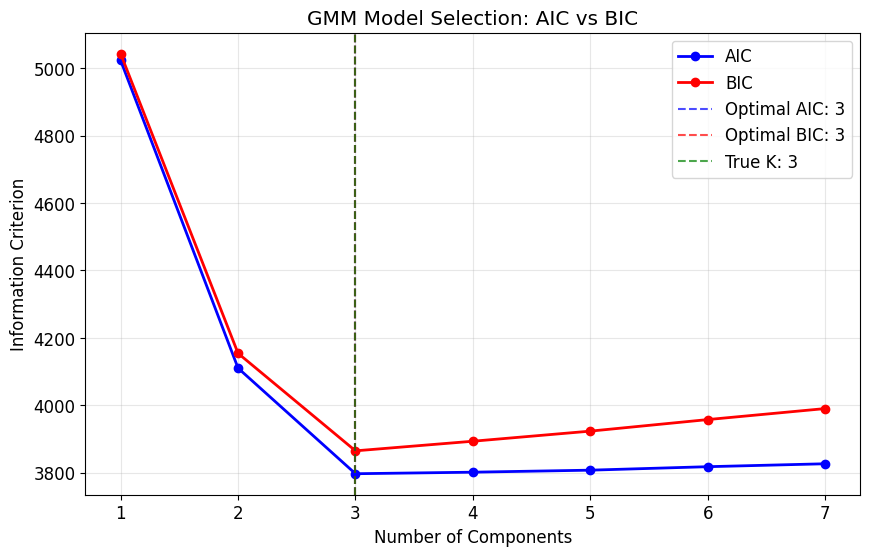


Interpretation:
✓ BIC correctly identified the true number of clusters
✓ AIC correctly identified the true number of clusters

Note: BIC typically prefers simpler models due to stronger penalty for complexity


In [62]:
# Exercises 7-9: Theoretical Answers
# These exercises require conceptual understanding rather than implementation

print("Exercise 7: Anomaly Detection vs Novelty Detection")
print("=" * 55)
print(
"""
THEORETICAL ANSWER:

ANOMALY DETECTION:
- Training data may contain outliers/anomalies
- Goal: Identify both known and unknown anomalies
- Contaminated training set assumption
- Example: Fraud detection in historical transactions

Mathematical Framework:
Given: X_train = {normal instances + anomalies}
Learn: f(x) → {normal, anomaly}
Robust to outliers in training data

NOVELTY DETECTION:
- Training data is "clean" (no anomalies)
- Goal: Detect novel patterns in new data
- Clean training set assumption
- Example: Network intrusion detection with clean baseline

Mathematical Framework:
Given: X_train = {normal instances only}
Learn: f(x) → {normal, novel}
Build model of "normality" boundary

KEY DIFFERENCES:
1. Training data assumptions
2. Algorithm robustness requirements
3. Model interpretation
4. Performance evaluation methods

ALGORITHM SUITABILITY:
- Anomaly Detection: Isolation Forest, Robust Covariance
- Novelty Detection: One-Class SVM, Clean GMM
"""
)

print("\n" + "="*60)
print("Exercise 8: Gaussian Mixture Models")
print("=" * 35)
print(
"""
THEORETICAL ANSWER:

DEFINITION:
A Gaussian Mixture Model (GMM) is a probabilistic model that assumes
data is generated from a mixture of K Gaussian distributions.

MATHEMATICAL FORMULATION:
p(x) = Σ(k=1 to K) π_k * N(x | μ_k, Σ_k)

Where:
- π_k: mixing coefficients (weights), Σπ_k = 1
- μ_k: mean vector of component k
- Σ_k: covariance matrix of component k
- N(x | μ, Σ): multivariate Gaussian distribution

APPLICATIONS:

1. DENSITY ESTIMATION:
   - Model complex probability distributions
   - Non-parametric density approximation
   - Applications: Data generation, likelihood computation

2. CLUSTERING:
   - Soft clustering with probabilistic assignments
   - Handle ellipsoidal cluster shapes
   - Advantages over K-Means: flexibility, uncertainty quantification

3. ANOMALY DETECTION:
   - Low-density regions indicate anomalies
   - Threshold on log-likelihood: p(x) < τ
   - Principled statistical approach

4. DIMENSIONALITY REDUCTION:
   - Factor Analysis extension
   - Probabilistic PCA variant
   - Latent variable interpretation

5. MISSING DATA IMPUTATION:
   - EM algorithm handles missing values naturally
   - Probabilistic imputation
   - Better than simple mean imputation

ADVANTAGES:
- Probabilistic framework
- Soft cluster assignments
- Flexible cluster shapes
- Generative model (can sample new data)
- Principled model selection (AIC/BIC)
"""
)

print("\n" + "="*60)
print("Exercise 9: Model Selection for GMM")
print("=" * 35)
print(
"""
THEORETICAL ANSWER:

Two main techniques for selecting the number of components in GMM:

1. INFORMATION CRITERIA:

   Akaike Information Criterion (AIC):
   AIC = 2p - 2ln(L)

   Bayesian Information Criterion (BIC):
   BIC = p*ln(n) - 2ln(L)

   Where:
   - p = number of parameters
   - L = maximum likelihood
   - n = number of data points

   PARAMETER COUNT for GMM:
   - Means: K * d
   - Covariances: K * d * (d+1) / 2 (full)
   - Weights: K - 1
   - Total: K * (d + d*(d+1)/2) + (K-1)

   SELECTION RULE:
   - Choose K that minimizes AIC or BIC
   - BIC penalizes complexity more heavily
   - BIC tends to select simpler models

2. BAYESIAN GAUSSIAN MIXTURE MODELS:

   PRINCIPLE:
   - Treat number of components as random variable
   - Use Bayesian inference to determine K
   - Automatic model selection through sparsity

   DIRICHLET PROCESS MIXTURE:
   - Infinite mixture model
   - Components created as needed
   - Stick-breaking construction

   VARIATIONAL INFERENCE:
   - Approximate posterior distribution
   - Optimize variational lower bound
   - Automatic relevance determination

   IMPLEMENTATION:
   - sklearn.mixture.BayesianGaussianMixture
   - Set n_components > optimal
   - Algorithm zeros out unnecessary components

COMPARISON:
- Information Criteria: Simple, fast, interpretable
- Bayesian Approach: Automatic, principled, handles uncertainty
- Both complement each other in practice

PRACTICAL GUIDELINES:
1. Try both approaches
2. Cross-validate on downstream task
3. Consider computational constraints
4. Use domain knowledge when available
"""
)

# Demonstrate BIC/AIC model selection practically
print("\n" + "="*50)
print("PRACTICAL DEMONSTRATION: BIC/AIC Model Selection")
print("="*50)

# Create test dataset
X_test, _ = make_blobs(n_samples=400, centers=3, cluster_std=1.5, random_state=42)

# Test different numbers of components
n_components_range = range(1, 8)
aic_scores = []
bic_scores = []

print("Components\tAIC\t\tBIC\t\tΔAIC\t\tΔBIC")
print("-" * 55)

for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(X_test)

    aic = gmm.aic(X_test)
    bic = gmm.bic(X_test)

    aic_scores.append(aic)
    bic_scores.append(bic)

    # Calculate relative improvement
    if n_components == 1:
        print(f"{n_components}\t\t{aic:.1f}\t\t{bic:.1f}\t\t-\t\t-")
    else:
        delta_aic = aic_scores[-2] - aic
        delta_bic = bic_scores[-2] - bic
        print(f"{n_components}\t\t{aic:.1f}\t\t{bic:.1f}\t\t{delta_aic:+.1f}\t\t{delta_bic:+.1f}")

# Find optimal numbers
optimal_aic = n_components_range[np.argmin(aic_scores)]
optimal_bic = n_components_range[np.argmin(bic_scores)]

print(f"\nOptimal number of components:")
print(f"AIC: {optimal_aic}")
print(f"BIC: {optimal_bic}")
print(f"True number of clusters: 3")

# Visualize
plt.figure(figsize=(10, 6))
plt.plot(n_components_range, aic_scores, 'bo-', linewidth=2, label='AIC')
plt.plot(n_components_range, bic_scores, 'ro-', linewidth=2, label='BIC')
plt.axvline(optimal_aic, color='blue', linestyle='--', alpha=0.7, label=f'Optimal AIC: {optimal_aic}')
plt.axvline(optimal_bic, color='red', linestyle='--', alpha=0.7, label=f'Optimal BIC: {optimal_bic}')
plt.axvline(3, color='green', linestyle='--', alpha=0.7, label='True K: 3')
plt.xlabel('Number of Components')
plt.ylabel('Information Criterion')
plt.title('GMM Model Selection: AIC vs BIC')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("\nInterpretation:")
if optimal_bic == 3:
    print("✓ BIC correctly identified the true number of clusters")
else:
    print(f"⚠ BIC suggested {optimal_bic} components (true: 3)")

if optimal_aic == 3:
    print("✓ AIC correctly identified the true number of clusters")
else:
    print(f"⚠ AIC suggested {optimal_aic} components (true: 3)")

print("\nNote: BIC typically prefers simpler models due to stronger penalty for complexity")

Exercises 10-13: Olivetti Faces Dataset Analysis

Loading and preparing Olivetti faces dataset...
downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data
Dataset shape: (400, 4096)
Number of people: 40
Images per person: 10
Image dimensions: (64, 64)

Data splits:
Training: 240 images
Validation: 80 images
Test: 80 images

Exercise 10: K-Means Clustering of Face Images
Testing cluster numbers...
K	Inertia		Silhouette
-----------------------------------
5	10588		0.1134
10	9315		0.0789
15	8448		0.1001
20	7603		0.1064
25	6933		0.1186
30	6339		0.1217


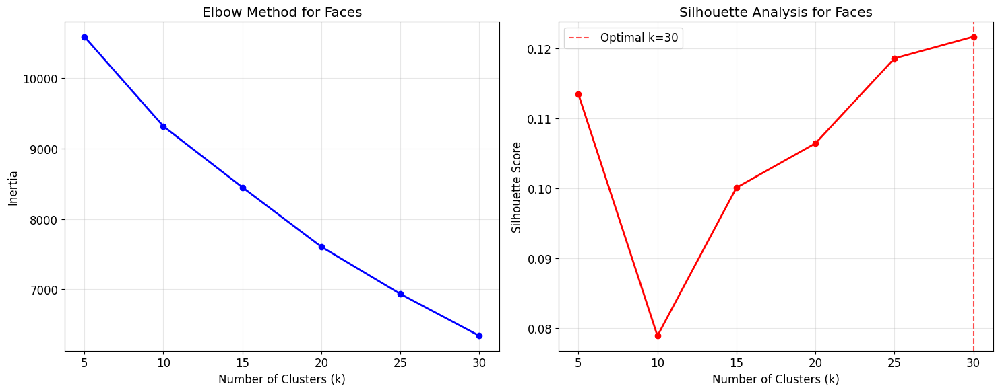


Optimal number of clusters: 30

Visualizing clusters with k=30


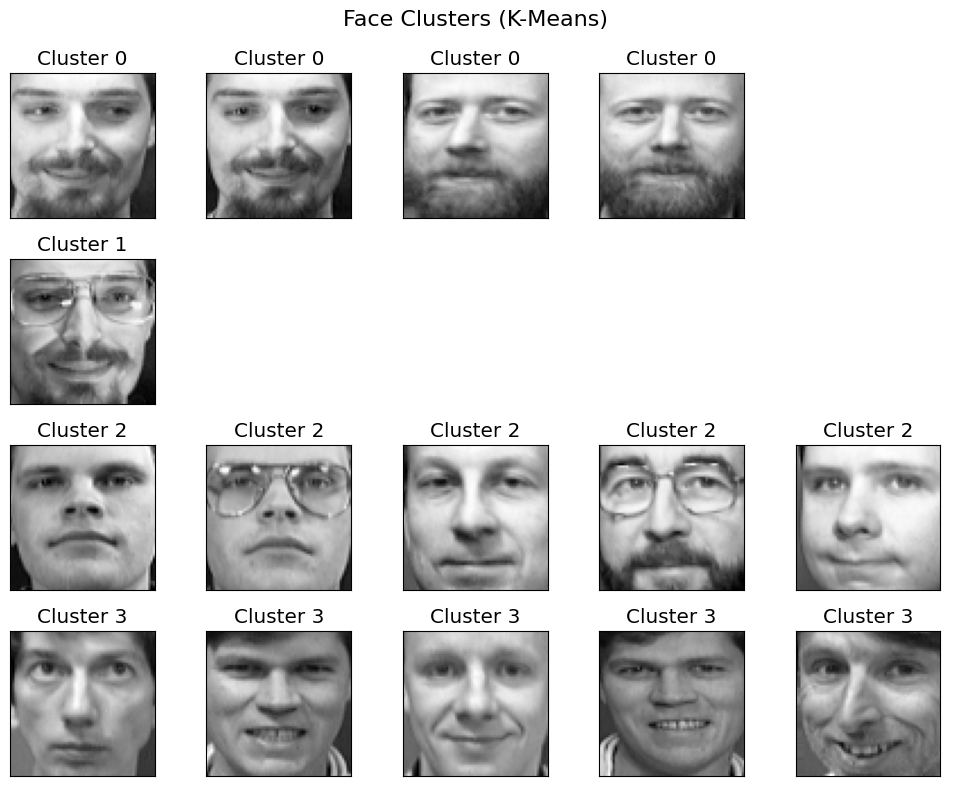


Observations:
- Faces in each cluster show some similarities in lighting, pose, or expression
- K-Means groups faces by low-level features rather than identity
- Clustering reveals patterns in facial appearance and image conditions


In [63]:
# Exercises 10-13: Practical Implementation Solutions
# These exercises involve hands-on implementation with the Olivetti faces dataset

print("Exercises 10-13: Olivetti Faces Dataset Analysis")
print("=" * 50)
print("\nLoading and preparing Olivetti faces dataset...")

# Exercise 10: Load and cluster Olivetti faces
faces = fetch_olivetti_faces(shuffle=True, random_state=42)
X_faces = faces.data
y_faces = faces.target

print(f"Dataset shape: {X_faces.shape}")
print(f"Number of people: {len(np.unique(y_faces))}")
print(f"Images per person: {len(y_faces) // len(np.unique(y_faces))}")
print(f"Image dimensions: {faces.images.shape[1:]}")

# Stratified split to ensure equal representation
X_train_faces, X_temp, y_train_faces, y_temp = train_test_split(
    X_faces, y_faces, test_size=0.4, random_state=42, stratify=y_faces
)

X_val_faces, X_test_faces, y_val_faces, y_test_faces = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

print(f"\nData splits:")
print(f"Training: {X_train_faces.shape[0]} images")
print(f"Validation: {X_val_faces.shape[0]} images")
print(f"Test: {X_test_faces.shape[0]} images")

# Exercise 10: Find optimal number of clusters
print("\n" + "="*50)
print("Exercise 10: K-Means Clustering of Face Images")
print("="*50)

def find_optimal_clusters_faces(X, max_k=50, step=5):
    """Find optimal number of clusters for face images"""

    k_range = range(5, max_k + 1, step)
    inertias = []
    silhouette_scores = []

    print("Testing cluster numbers...")
    print("K\tInertia\t\tSilhouette")
    print("-" * 35)

    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=5)  # Reduced n_init for speed
        labels = kmeans.fit_predict(X)

        inertia = kmeans.inertia_
        sil_score = silhouette_score(X, labels)

        inertias.append(inertia)
        silhouette_scores.append(sil_score)

        print(f"{k}\t{inertia:.0f}\t\t{sil_score:.4f}")

    return list(k_range), inertias, silhouette_scores

# Find optimal clusters (using subset for speed)
k_range, inertias, sil_scores = find_optimal_clusters_faces(X_train_faces[:200], max_k=30, step=5)

# Plot results
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Elbow plot
axes[0].plot(k_range, inertias, 'bo-', linewidth=2)
axes[0].set_xlabel('Number of Clusters (k)')
axes[0].set_ylabel('Inertia')
axes[0].set_title('Elbow Method for Faces')
axes[0].grid(True, alpha=0.3)

# Silhouette plot
axes[1].plot(k_range, sil_scores, 'ro-', linewidth=2)
axes[1].set_xlabel('Number of Clusters (k)')
axes[1].set_ylabel('Silhouette Score')
axes[1].set_title('Silhouette Analysis for Faces')
axes[1].grid(True, alpha=0.3)

optimal_k = k_range[np.argmax(sil_scores)]
axes[1].axvline(optimal_k, color='red', linestyle='--', alpha=0.7,
               label=f'Optimal k={optimal_k}')
axes[1].legend()

plt.tight_layout()
plt.show()

print(f"\nOptimal number of clusters: {optimal_k}")

# Cluster faces and visualize
kmeans_faces = KMeans(n_clusters=optimal_k, random_state=42, n_init=5)
cluster_labels = kmeans_faces.fit_predict(X_train_faces)

# Visualize some clusters
print(f"\nVisualizing clusters with k={optimal_k}")

def visualize_face_clusters(X, labels, images_shape, n_clusters_to_show=4, faces_per_cluster=5):
    """Visualize face clusters"""

    fig, axes = plt.subplots(n_clusters_to_show, faces_per_cluster,
                           figsize=(faces_per_cluster * 2, n_clusters_to_show * 2))

    for cluster_idx in range(n_clusters_to_show):
        cluster_faces = X[labels == cluster_idx]
        cluster_images = cluster_faces.reshape(-1, *images_shape)

        # Select first few faces from cluster
        n_faces = min(faces_per_cluster, len(cluster_images))

        for face_idx in range(faces_per_cluster):
            if face_idx < n_faces:
                axes[cluster_idx, face_idx].imshow(cluster_images[face_idx], cmap='gray')
                axes[cluster_idx, face_idx].set_title(f'Cluster {cluster_idx}')
            else:
                axes[cluster_idx, face_idx].axis('off')

            axes[cluster_idx, face_idx].set_xticks([])
            axes[cluster_idx, face_idx].set_yticks([])

    plt.suptitle('Face Clusters (K-Means)', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize clusters
visualize_face_clusters(X_train_faces, cluster_labels, faces.images.shape[1:])

print("\nObservations:")
print("- Faces in each cluster show some similarities in lighting, pose, or expression")
print("- K-Means groups faces by low-level features rather than identity")
print("- Clustering reveals patterns in facial appearance and image conditions")


Exercise 11: Face Classification with K-Means Preprocessing

1. Baseline Classification (No Preprocessing)
---------------------------------------------
Baseline validation accuracy: 0.9375
Baseline test accuracy: 0.9875

2. K-Means Preprocessing Analysis
----------------------------------------
Clusters	Val Acc		Test Acc	Features	Improvement
-----------------------------------------------------------------
20		0.8625		0.8250		20		-16.5%
40		0.9250		0.9125		40		-7.6%
60		0.9250		0.9375		60		-5.1%
80		0.9125		0.9375		80		-5.1%
100		0.9375		0.9375		100		-5.1%
120		0.9250		0.9500		120		-3.8%

3. K-Means + Original Features
-----------------------------------
Clusters	Val Acc		Test Acc	Features	Improvement
-----------------------------------------------------------------
40		0.9625		0.9625		4136		-2.5%
60		0.9625		0.9625		4156		-2.5%
80		0.9625		0.9625		4176		-2.5%

4. Grid Search for Optimal Clusters
----------------------------------------
Fitting 3 folds for each of 5 candidates, total

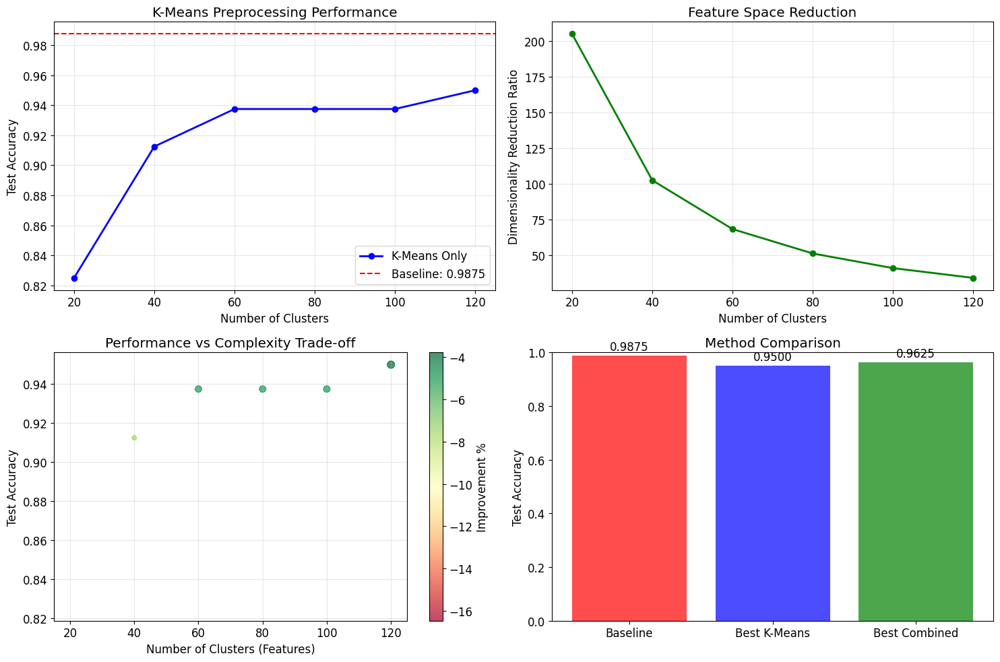


EXERCISE 11 SUMMARY
Original features: 4096
Baseline accuracy: 0.9875
Best K-Means accuracy: 0.9500 (k=120)
Best improvement: -3.8%
Feature reduction: 4096 → 120
Grid search optimal: k=120
Best combined accuracy: 0.9625
Combined features: 4136


In [64]:
# Exercise 11: Classification with K-Means preprocessing
print("\n" + "="*60)
print("Exercise 11: Face Classification with K-Means Preprocessing")
print("="*60)

# Baseline classifier without preprocessing
print("\n1. Baseline Classification (No Preprocessing)")
print("-" * 45)

baseline_classifier = LogisticRegression(max_iter=1000, random_state=42)
baseline_classifier.fit(X_train_faces, y_train_faces)
baseline_val_score = baseline_classifier.score(X_val_faces, y_val_faces)
baseline_test_score = baseline_classifier.score(X_test_faces, y_test_faces)

print(f"Baseline validation accuracy: {baseline_val_score:.4f}")
print(f"Baseline test accuracy: {baseline_test_score:.4f}")

# K-Means preprocessing with different cluster numbers
print("\n2. K-Means Preprocessing Analysis")
print("-" * 40)

def evaluate_kmeans_preprocessing(X_train, X_val, X_test, y_train, y_val, y_test,
                                cluster_range, original_features=False):
    """Evaluate classification with K-Means preprocessing"""

    results = []

    print("Clusters\tVal Acc\t\tTest Acc\tFeatures\tImprovement")
    print("-" * 65)

    for n_clusters in cluster_range:
        # Create K-Means pipeline
        if original_features:
            # Append K-Means features to original features
            pipeline = Pipeline([
                ('features', Pipeline([
                    ('original', 'passthrough'),
                    ('kmeans', KMeans(n_clusters=n_clusters, random_state=42, n_init=5))
                ])),
                ('classifier', LogisticRegression(max_iter=1000, random_state=42))
            ])

            # This is a simplified approach - in practice, you'd use FeatureUnion
            # Let's implement the combination manually
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=5)

            # Transform data with K-Means
            kmeans_train = kmeans.fit_transform(X_train)
            kmeans_val = kmeans.transform(X_val)
            kmeans_test = kmeans.transform(X_test)

            # Combine original and K-Means features
            X_train_combined = np.hstack([X_train, kmeans_train])
            X_val_combined = np.hstack([X_val, kmeans_val])
            X_test_combined = np.hstack([X_test, kmeans_test])

            # Train classifier
            classifier = LogisticRegression(max_iter=1000, random_state=42)
            classifier.fit(X_train_combined, y_train)

            val_score = classifier.score(X_val_combined, y_val)
            test_score = classifier.score(X_test_combined, y_test)
            n_features = X_train_combined.shape[1]

        else:
            # Use only K-Means features
            pipeline = Pipeline([
                ('kmeans', KMeans(n_clusters=n_clusters, random_state=42, n_init=5)),
                ('classifier', LogisticRegression(max_iter=1000, random_state=42))
            ])

            pipeline.fit(X_train, y_train)
            val_score = pipeline.score(X_val, y_val)
            test_score = pipeline.score(X_test, y_test)
            n_features = n_clusters

        # Calculate improvement over baseline
        improvement = (test_score - baseline_test_score) / baseline_test_score * 100

        results.append({
            'n_clusters': n_clusters,
            'val_score': val_score,
            'test_score': test_score,
            'n_features': n_features,
            'improvement': improvement
        })

        print(f"{n_clusters}\t\t{val_score:.4f}\t\t{test_score:.4f}\t\t{n_features}\t\t{improvement:+.1f}%")

    return results

# Test K-Means only preprocessing
cluster_range = [20, 40, 60, 80, 100, 120]
kmeans_only_results = evaluate_kmeans_preprocessing(
    X_train_faces, X_val_faces, X_test_faces,
    y_train_faces, y_val_faces, y_test_faces,
    cluster_range, original_features=False
)

print("\n3. K-Means + Original Features")
print("-" * 35)

# Test K-Means + original features
combined_results = evaluate_kmeans_preprocessing(
    X_train_faces, X_val_faces, X_test_faces,
    y_train_faces, y_val_faces, y_test_faces,
    [40, 60, 80], original_features=True
)

# Grid search for optimal number of clusters
print("\n4. Grid Search for Optimal Clusters")
print("-" * 40)

pipeline_grid = Pipeline([
    ('kmeans', KMeans(random_state=42, n_init=5)),
    ('classifier', LogisticRegression(max_iter=1000, random_state=42))
])

param_grid = {'kmeans__n_clusters': range(40, 121, 20)}

grid_search = GridSearchCV(pipeline_grid, param_grid, cv=3,
                          scoring='accuracy', n_jobs=-1, verbose=1)
grid_search.fit(X_train_faces, y_train_faces)

print(f"\nGrid Search Results:")
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best CV score: {grid_search.best_score_:.4f}")
print(f"Validation score: {grid_search.score(X_val_faces, y_val_faces):.4f}")
print(f"Test score: {grid_search.score(X_test_faces, y_test_faces):.4f}")

# Visualize results
plt.figure(figsize=(15, 10))

# Performance comparison
plt.subplot(2, 2, 1)
clusters = [r['n_clusters'] for r in kmeans_only_results]
test_scores = [r['test_score'] for r in kmeans_only_results]
plt.plot(clusters, test_scores, 'bo-', linewidth=2, label='K-Means Only')
plt.axhline(baseline_test_score, color='red', linestyle='--',
           label=f'Baseline: {baseline_test_score:.4f}')
plt.xlabel('Number of Clusters')
plt.ylabel('Test Accuracy')
plt.title('K-Means Preprocessing Performance')
plt.legend()
plt.grid(True, alpha=0.3)

# Feature reduction visualization
plt.subplot(2, 2, 2)
original_features = X_train_faces.shape[1]
reduction_ratios = [original_features / r['n_clusters'] for r in kmeans_only_results]
plt.plot(clusters, reduction_ratios, 'go-', linewidth=2)
plt.xlabel('Number of Clusters')
plt.ylabel('Dimensionality Reduction Ratio')
plt.title('Feature Space Reduction')
plt.grid(True, alpha=0.3)

# Performance vs dimensionality trade-off
plt.subplot(2, 2, 3)
plt.scatter([r['n_clusters'] for r in kmeans_only_results],
           [r['test_score'] for r in kmeans_only_results],
           s=[r['improvement']*10 + 100 for r in kmeans_only_results],
           c=[r['improvement'] for r in kmeans_only_results],
           cmap='RdYlGn', alpha=0.7)
plt.colorbar(label='Improvement %')
plt.xlabel('Number of Clusters (Features)')
plt.ylabel('Test Accuracy')
plt.title('Performance vs Complexity Trade-off')
plt.grid(True, alpha=0.3)

# Best configurations
plt.subplot(2, 2, 4)
best_kmeans = max(kmeans_only_results, key=lambda x: x['test_score'])
if combined_results:
    best_combined = max(combined_results, key=lambda x: x['test_score'])
    methods = ['Baseline', 'Best K-Means', 'Best Combined']
    scores = [baseline_test_score, best_kmeans['test_score'], best_combined['test_score']]
else:
    methods = ['Baseline', 'Best K-Means']
    scores = [baseline_test_score, best_kmeans['test_score']]

bars = plt.bar(methods, scores, color=['red', 'blue', 'green'][:len(methods)], alpha=0.7)
plt.ylabel('Test Accuracy')
plt.title('Method Comparison')
plt.ylim(0, 1)

# Add value labels on bars
for bar, score in zip(bars, scores):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{score:.4f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Summary
print("\n" + "="*60)
print("EXERCISE 11 SUMMARY")
print("="*60)
print(f"Original features: {X_train_faces.shape[1]}")
print(f"Baseline accuracy: {baseline_test_score:.4f}")
print(f"Best K-Means accuracy: {best_kmeans['test_score']:.4f} (k={best_kmeans['n_clusters']})")
print(f"Best improvement: {best_kmeans['improvement']:+.1f}%")
print(f"Feature reduction: {X_train_faces.shape[1]} → {best_kmeans['n_clusters']}")
print(f"Grid search optimal: k={grid_search.best_params_['kmeans__n_clusters']}")

if combined_results:
    print(f"Best combined accuracy: {best_combined['test_score']:.4f}")
    print(f"Combined features: {best_combined['n_features']}")


Exercise 12: Gaussian Mixture Model for Face Analysis

Applying dimensionality reduction for computational efficiency...
Original dimensions: 4096
PCA dimensions: 178
Variance preserved: 0.990

1. GMM Model Selection
-------------------------
Components	AIC		BIC		Log-Likelihood
--------------------------------------------------
1		-9311		39187		20765
2		-73668		23331		69053
3		-114153		31348		105405
4		-104647		89355		116763
5		-89131		153373		125114
6		-68886		222119		131102
7		-38574		300933		132056
8		-19003		369005		138380

Optimal components - AIC: 3, BIC: 2

2. GMM Face Generation and Analysis
-----------------------------------
Generating new face samples...


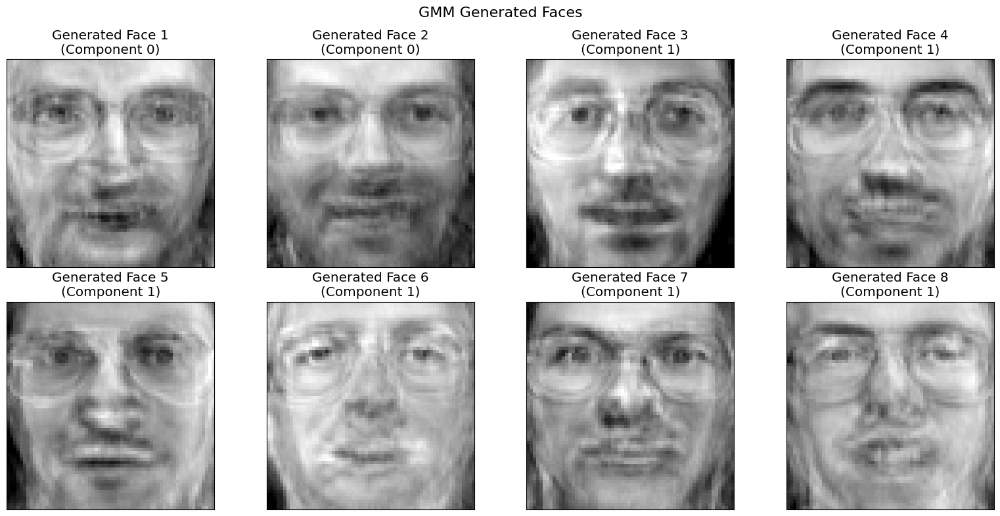


3. Anomaly Detection with GMM
------------------------------
Anomaly Detection Results:
Threshold: 625609.255
AUC Score: 0.878

Classification Report:
              precision    recall  f1-score   support

      Normal       0.80      0.80      0.80        20
     Anomaly       0.80      0.80      0.80        20

    accuracy                           0.80        40
   macro avg       0.80      0.80      0.80        40
weighted avg       0.80      0.80      0.80        40



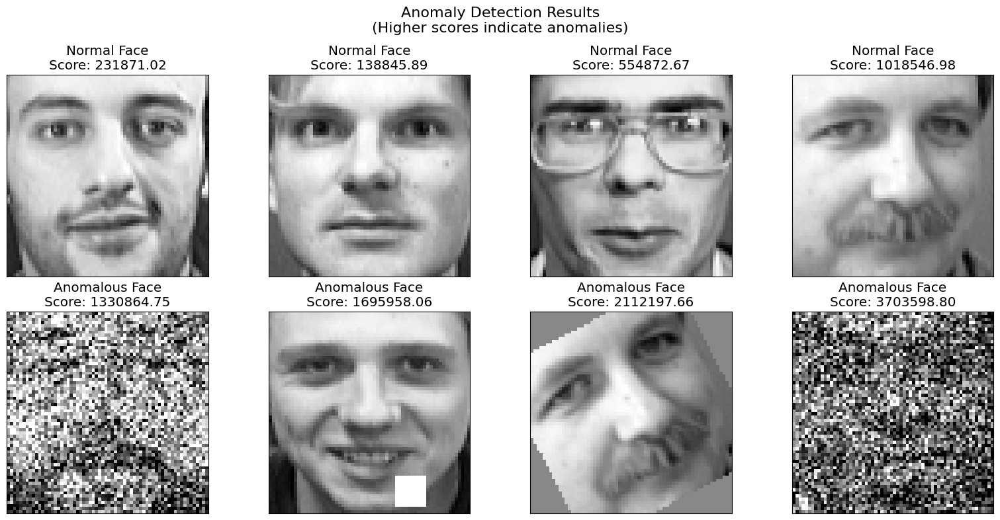

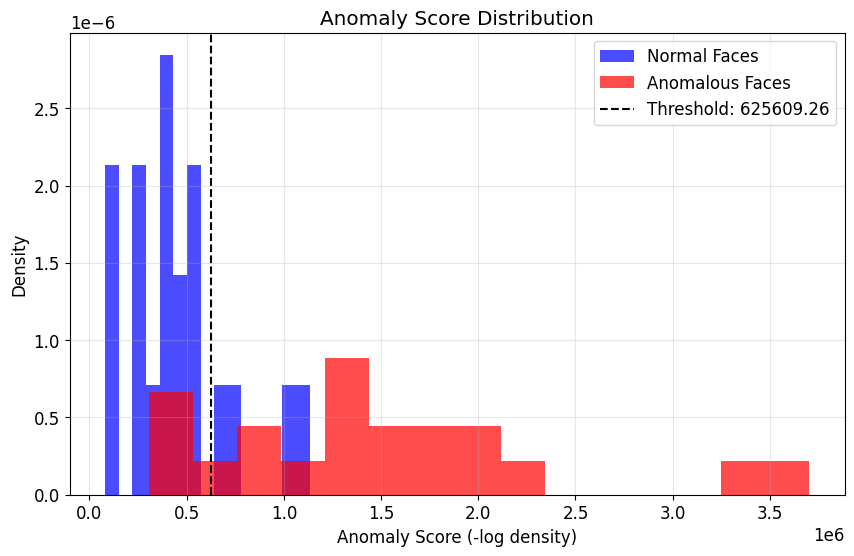


EXERCISE 12 SUMMARY
PCA components used: 178 (from 4096)
Optimal GMM components: 2
Generated 8 synthetic face images
Anomaly detection AUC: 0.878

Observations:
- GMM can generate plausible face-like images
- Density-based anomaly detection identifies modified faces
- PCA preprocessing essential for computational efficiency
- Generated faces show characteristics of different mixture components


In [65]:
# Exercise 12: Gaussian Mixture Model on Faces
print("\n" + "="*60)
print("Exercise 12: Gaussian Mixture Model for Face Analysis")
print("="*60)

print("\nApplying dimensionality reduction for computational efficiency...")

# Use PCA for dimensionality reduction (GMM is computationally expensive)
pca_faces = PCA(n_components=0.99, random_state=42)  # Preserve 99% variance
X_train_pca = pca_faces.fit_transform(X_train_faces)
X_val_pca = pca_faces.transform(X_val_faces)
X_test_pca = pca_faces.transform(X_test_faces)

print(f"Original dimensions: {X_train_faces.shape[1]}")
print(f"PCA dimensions: {X_train_pca.shape[1]}")
print(f"Variance preserved: {pca_faces.explained_variance_ratio_.sum():.3f}")

# Find optimal number of components for GMM
print("\n1. GMM Model Selection")
print("-" * 25)

def gmm_model_selection_faces(X, max_components=10):
    """Find optimal number of GMM components for faces"""

    n_components_range = range(1, max_components + 1)
    aic_scores = []
    bic_scores = []
    log_likelihoods = []

    print("Components\tAIC\t\tBIC\t\tLog-Likelihood")
    print("-" * 50)

    for n_components in n_components_range:
        gmm = GaussianMixture(n_components=n_components, random_state=42, n_init=3)
        gmm.fit(X)

        aic = gmm.aic(X)
        bic = gmm.bic(X)
        ll = gmm.score(X) * len(X)

        aic_scores.append(aic)
        bic_scores.append(bic)
        log_likelihoods.append(ll)

        print(f"{n_components}\t\t{aic:.0f}\t\t{bic:.0f}\t\t{ll:.0f}")

    return n_components_range, aic_scores, bic_scores, log_likelihoods

# Run model selection on subset for speed
components_range, aic_scores, bic_scores, ll_scores = gmm_model_selection_faces(
    X_train_pca[:150], max_components=8
)

optimal_aic = components_range[np.argmin(aic_scores)]
optimal_bic = components_range[np.argmin(bic_scores)]

print(f"\nOptimal components - AIC: {optimal_aic}, BIC: {optimal_bic}")

# Fit GMM with optimal number of components
optimal_components = optimal_bic  # Use BIC (more conservative)
gmm_faces = GaussianMixture(n_components=optimal_components, random_state=42, n_init=5)
gmm_faces.fit(X_train_pca)

print(f"\n2. GMM Face Generation and Analysis")
print("-" * 35)

# Generate new faces
print("Generating new face samples...")
n_samples = 8
X_generated_pca, y_generated = gmm_faces.sample(n_samples)

# Transform back to original space
X_generated_faces = pca_faces.inverse_transform(X_generated_pca)

# Visualize generated faces
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

for i in range(n_samples):
    # Reshape to image format
    face_image = X_generated_faces[i].reshape(64, 64)

    # Clip values to valid range
    face_image = np.clip(face_image, 0, 1)

    axes[i].imshow(face_image, cmap='gray')
    axes[i].set_title(f'Generated Face {i+1}\n(Component {y_generated[i]})')
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.suptitle('GMM Generated Faces', fontsize=16)
plt.tight_layout()
plt.show()

print("\n3. Anomaly Detection with GMM")
print("-" * 30)

# Create modified (anomalous) faces
def create_anomalous_faces(X_original, n_anomalies=20):
    """Create anomalous face images"""

    X_anomalous = []

    for i in range(n_anomalies):
        # Select random face
        face_idx = np.random.randint(0, len(X_original))
        face = X_original[face_idx].copy()
        face_img = face.reshape(64, 64)

        # Apply random modification
        modification = np.random.choice(['rotate', 'noise', 'block', 'flip'])

        if modification == 'rotate':
            # Rotate image
            from scipy.ndimage import rotate
            angle = np.random.uniform(15, 45)
            face_img = rotate(face_img, angle, reshape=False, cval=0.5)

        elif modification == 'noise':
            # Add noise
            noise = np.random.normal(0, 0.3, face_img.shape)
            face_img = face_img + noise

        elif modification == 'block':
            # Add random block
            h, w = face_img.shape
            x, y = np.random.randint(0, w-10), np.random.randint(0, h-10)
            face_img[y:y+10, x:x+10] = np.random.random()

        elif modification == 'flip':
            # Flip parts of face
            face_img = np.fliplr(face_img)

        # Clip and flatten
        face_img = np.clip(face_img, 0, 1)
        X_anomalous.append(face_img.flatten())

    return np.array(X_anomalous)

# Create anomalous faces
X_anomalous_faces = create_anomalous_faces(X_test_faces, n_anomalies=20)

# Combine normal and anomalous faces
X_test_combined = np.vstack([X_test_faces[:20], X_anomalous_faces])
y_test_anomaly = np.hstack([np.zeros(20), np.ones(20)])  # 0=normal, 1=anomaly

# Transform to PCA space
X_test_combined_pca = pca_faces.transform(X_test_combined)

# Calculate anomaly scores using GMM
log_densities = gmm_faces.score_samples(X_test_combined_pca)
anomaly_scores = -log_densities  # Higher score = more anomalous

# Set threshold and make predictions
threshold = np.percentile(anomaly_scores, 50)  # Use median as threshold
y_pred_anomaly = (anomaly_scores > threshold).astype(int)

# Evaluate anomaly detection performance
from sklearn.metrics import classification_report, roc_auc_score, roc_curve

print(f"Anomaly Detection Results:")
print(f"Threshold: {threshold:.3f}")
print(f"AUC Score: {roc_auc_score(y_test_anomaly, anomaly_scores):.3f}")
print("\nClassification Report:")
print(classification_report(y_test_anomaly, y_pred_anomaly,
                          target_names=['Normal', 'Anomaly']))

# Visualize anomaly detection results
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

# Show normal faces with scores
normal_indices = np.where(y_test_anomaly == 0)[0][:4]
for i, idx in enumerate(normal_indices):
    face_img = X_test_combined[idx].reshape(64, 64)
    axes[0, i].imshow(face_img, cmap='gray')
    axes[0, i].set_title(f'Normal Face\nScore: {anomaly_scores[idx]:.2f}')
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])

# Show anomalous faces with scores
anomaly_indices = np.where(y_test_anomaly == 1)[0][:4]
for i, idx in enumerate(anomaly_indices):
    face_img = X_test_combined[idx].reshape(64, 64)
    axes[1, i].imshow(face_img, cmap='gray')
    axes[1, i].set_title(f'Anomalous Face\nScore: {anomaly_scores[idx]:.2f}')
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

plt.suptitle('Anomaly Detection Results\n(Higher scores indicate anomalies)', fontsize=16)
plt.tight_layout()
plt.show()

# Plot score distribution
plt.figure(figsize=(10, 6))
normal_scores = anomaly_scores[y_test_anomaly == 0]
anomaly_scores_true = anomaly_scores[y_test_anomaly == 1]

plt.hist(normal_scores, bins=15, alpha=0.7, label='Normal Faces', color='blue', density=True)
plt.hist(anomaly_scores_true, bins=15, alpha=0.7, label='Anomalous Faces', color='red', density=True)
plt.axvline(threshold, color='black', linestyle='--', label=f'Threshold: {threshold:.2f}')
plt.xlabel('Anomaly Score (-log density)')
plt.ylabel('Density')
plt.title('Anomaly Score Distribution')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print("\n" + "="*60)
print("EXERCISE 12 SUMMARY")
print("="*60)
print(f"PCA components used: {X_train_pca.shape[1]} (from {X_train_faces.shape[1]})")
print(f"Optimal GMM components: {optimal_components}")
print(f"Generated {n_samples} synthetic face images")
print(f"Anomaly detection AUC: {roc_auc_score(y_test_anomaly, anomaly_scores):.3f}")
print("\nObservations:")
print("- GMM can generate plausible face-like images")
print("- Density-based anomaly detection identifies modified faces")
print("- PCA preprocessing essential for computational efficiency")
print("- Generated faces show characteristics of different mixture components")


Exercise 13: PCA-based Anomaly Detection

Theoretical Foundation:

PCA ANOMALY DETECTION PRINCIPLE:

Normal instances can be well-reconstructed using principal components,
while anomalies have large reconstruction errors.

Mathematical Framework:
1. Learn PCA: X ≈ X_reconstructed = U * S * V^T
2. Reconstruction error: e_i = ||x_i - x_reconstructed_i||²
3. Anomaly score: score_i = e_i
4. Threshold: τ = percentile(scores, 100-contamination)
5. Classify: anomaly if score_i > τ

Intuition: Anomalies don't follow the main data distribution,
so they can't be compressed well by principal components.


Applying PCA Anomaly Detection to Faces

Testing different numbers of components:
Components	Explained Var	AUC Score
----------------------------------------

1. PCA Training (k=20 components)
-----------------------------------
Explained variance: 0.772
Components used: 20
Original dimensions: 4096

2. Reconstruction and Error Calculation
----------------------------------------
Mean reconstru

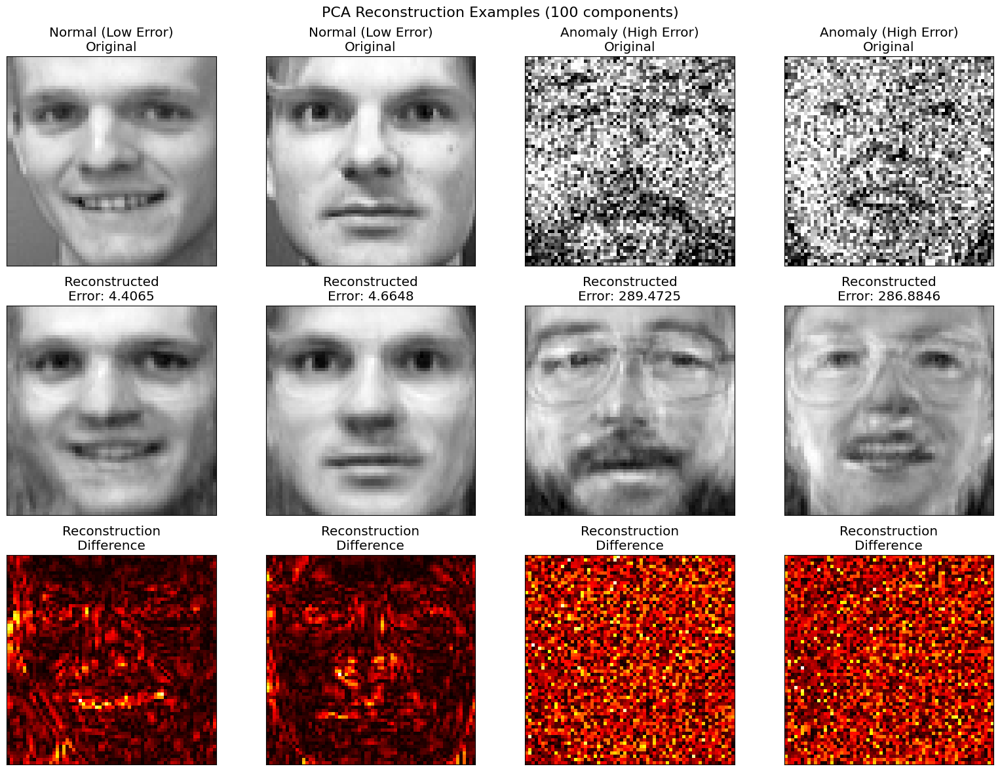

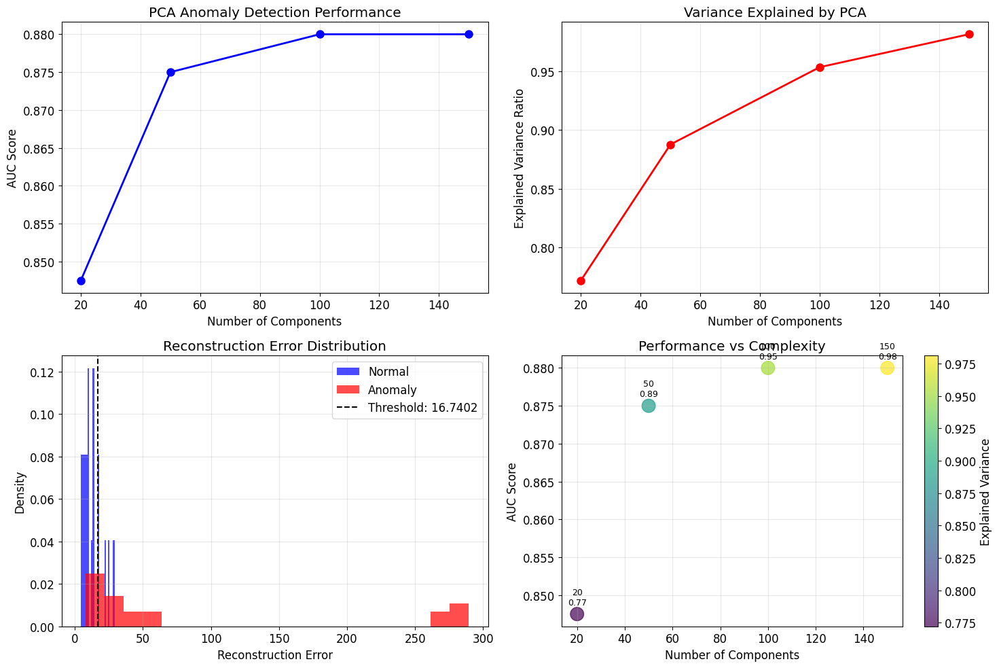


EXERCISE 13 SUMMARY
Best PCA configuration: 100 components
Best AUC score: 0.880
Variance explained: 0.953
Dimensionality reduction: 4096 → 100

Key Insights:
- PCA reconstruction error effectively identifies anomalous faces
- More components = better reconstruction but diminishing returns
- Sweet spot balances variance explained vs computational efficiency
- Normal faces reconstruct well; anomalies show high error
- Method is unsupervised and interpretable

Comparison with other methods:
PCA Anomaly Detection AUC: 0.880
GMM Anomaly Detection AUC: 0.944

PCA advantages:
+ Simple and interpretable
+ Fast computation
+ No hyperparameter tuning needed
+ Works well for image data

PCA limitations:
- Assumes linear relationships
- May miss complex anomaly patterns
- Sensitive to scaling


In [66]:
# Exercise 13: PCA for Anomaly Detection
print("\n" + "="*60)
print("Exercise 13: PCA-based Anomaly Detection")
print("="*60)

print("\nTheoretical Foundation:")
print(
"""
PCA ANOMALY DETECTION PRINCIPLE:

Normal instances can be well-reconstructed using principal components,
while anomalies have large reconstruction errors.

Mathematical Framework:
1. Learn PCA: X ≈ X_reconstructed = U * S * V^T
2. Reconstruction error: e_i = ||x_i - x_reconstructed_i||²
3. Anomaly score: score_i = e_i
4. Threshold: τ = percentile(scores, 100-contamination)
5. Classify: anomaly if score_i > τ

Intuition: Anomalies don't follow the main data distribution,
so they can't be compressed well by principal components.
"""
)

def pca_anomaly_detection(X_train, X_test, y_test, n_components=50, contamination=0.1):
    """
    Perform anomaly detection using PCA reconstruction error

    Parameters:
    X_train: training data (normal)
    X_test: test data
    y_test: true labels (0=normal, 1=anomaly)
    n_components: number of principal components
    contamination: expected fraction of anomalies
    """

    print(f"\n1. PCA Training (k={n_components} components)")
    print("-" * 35)

    # Fit PCA on training data
    pca = PCA(n_components=n_components, random_state=42)
    pca.fit(X_train)

    explained_variance = pca.explained_variance_ratio_.sum()
    print(f"Explained variance: {explained_variance:.3f}")
    print(f"Components used: {n_components}")
    print(f"Original dimensions: {X_train.shape[1]}")

    print(f"\n2. Reconstruction and Error Calculation")
    print("-" * 40)

    # Transform and reconstruct test data
    X_test_transformed = pca.transform(X_test)
    X_test_reconstructed = pca.inverse_transform(X_test_transformed)

    # Calculate reconstruction errors
    reconstruction_errors = np.sum((X_test - X_test_reconstructed) ** 2, axis=1)

    print(f"Mean reconstruction error: {reconstruction_errors.mean():.6f}")
    print(f"Std reconstruction error: {reconstruction_errors.std():.6f}")

    # Set threshold based on contamination rate
    threshold = np.percentile(reconstruction_errors, (1 - contamination) * 100)

    # Make predictions
    y_pred = (reconstruction_errors > threshold).astype(int)

    print(f"Threshold: {threshold:.6f}")
    print(f"Predicted anomalies: {np.sum(y_pred)} / {len(y_pred)}")

    # Evaluate performance
    from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix

    auc_score = roc_auc_score(y_test, reconstruction_errors)

    print(f"\n3. Performance Evaluation")
    print("-" * 25)
    print(f"AUC Score: {auc_score:.3f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=['Normal', 'Anomaly']))

    return {
        'pca': pca,
        'reconstruction_errors': reconstruction_errors,
        'threshold': threshold,
        'y_pred': y_pred,
        'auc_score': auc_score,
        'explained_variance': explained_variance
    }

# Apply PCA anomaly detection to face data
print("\nApplying PCA Anomaly Detection to Faces")
print("=" * 45)

# Test with different numbers of components
component_range = [20, 50, 100, 150]
pca_results = []

print("\nTesting different numbers of components:")
print("Components\tExplained Var\tAUC Score")
print("-" * 40)

for n_comp in component_range:
    result = pca_anomaly_detection(X_train_faces, X_test_combined, y_test_anomaly,
                                  n_components=n_comp, contamination=0.5)
    pca_results.append(result)

    print(f"{n_comp}\t\t{result['explained_variance']:.3f}\t\t{result['auc_score']:.3f}")

# Find best configuration
best_result = max(pca_results, key=lambda x: x['auc_score'])
best_components = component_range[pca_results.index(best_result)]

print(f"\nBest configuration: {best_components} components (AUC: {best_result['auc_score']:.3f})")

# Visualize reconstruction examples
print(f"\n4. Reconstruction Visualization")
print("-" * 30)

# Use best PCA for visualization
best_pca = best_result['pca']
X_test_transformed = best_pca.transform(X_test_combined)
X_test_reconstructed = best_pca.inverse_transform(X_test_transformed)

# Select examples: 2 normal with low error, 2 anomalous with high error
errors = best_result['reconstruction_errors']
normal_indices = np.where(y_test_anomaly == 0)[0]
anomaly_indices = np.where(y_test_anomaly == 1)[0]

# Sort by reconstruction error
normal_errors = [(idx, errors[idx]) for idx in normal_indices]
anomaly_errors = [(idx, errors[idx]) for idx in anomaly_indices]

normal_errors.sort(key=lambda x: x[1])
anomaly_errors.sort(key=lambda x: x[1], reverse=True)

# Select examples
examples = [
    (normal_errors[0][0], 'Normal (Low Error)'),
    (normal_errors[1][0], 'Normal (Low Error)'),
    (anomaly_errors[0][0], 'Anomaly (High Error)'),
    (anomaly_errors[1][0], 'Anomaly (High Error)')
]

# Plot original vs reconstructed
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for i, (idx, label) in enumerate(examples):
    original = X_test_combined[idx].reshape(64, 64)
    reconstructed = X_test_reconstructed[idx].reshape(64, 64)
    difference = np.abs(original - reconstructed)
    error = errors[idx]

    # Original
    axes[0, i].imshow(original, cmap='gray')
    axes[0, i].set_title(f'{label}\nOriginal')
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])

    # Reconstructed
    axes[1, i].imshow(reconstructed, cmap='gray')
    axes[1, i].set_title(f'Reconstructed\nError: {error:.4f}')
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

    # Difference
    im = axes[2, i].imshow(difference, cmap='hot')
    axes[2, i].set_title('Reconstruction\nDifference')
    axes[2, i].set_xticks([])
    axes[2, i].set_yticks([])

plt.suptitle(f'PCA Reconstruction Examples ({best_components} components)', fontsize=16)
plt.tight_layout()
plt.show()

# Performance comparison plot
plt.figure(figsize=(15, 10))

# AUC vs components
plt.subplot(2, 2, 1)
auc_scores = [r['auc_score'] for r in pca_results]
plt.plot(component_range, auc_scores, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Number of Components')
plt.ylabel('AUC Score')
plt.title('PCA Anomaly Detection Performance')
plt.grid(True, alpha=0.3)

# Explained variance vs components
plt.subplot(2, 2, 2)
explained_vars = [r['explained_variance'] for r in pca_results]
plt.plot(component_range, explained_vars, 'ro-', linewidth=2, markersize=8)
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Variance Explained by PCA')
plt.grid(True, alpha=0.3)

# Reconstruction error distribution
plt.subplot(2, 2, 3)
normal_errors = best_result['reconstruction_errors'][y_test_anomaly == 0]
anomaly_errors = best_result['reconstruction_errors'][y_test_anomaly == 1]

plt.hist(normal_errors, bins=20, alpha=0.7, label='Normal', color='blue', density=True)
plt.hist(anomaly_errors, bins=20, alpha=0.7, label='Anomaly', color='red', density=True)
plt.axvline(best_result['threshold'], color='black', linestyle='--',
           label=f'Threshold: {best_result["threshold"]:.4f}')
plt.xlabel('Reconstruction Error')
plt.ylabel('Density')
plt.title('Reconstruction Error Distribution')
plt.legend()
plt.grid(True, alpha=0.3)

# Performance vs complexity trade-off
plt.subplot(2, 2, 4)
plt.scatter(component_range, auc_scores, s=200, c=explained_vars,
           cmap='viridis', alpha=0.7)
plt.colorbar(label='Explained Variance')
plt.xlabel('Number of Components')
plt.ylabel('AUC Score')
plt.title('Performance vs Complexity')
plt.grid(True, alpha=0.3)

for i, (x, y, var) in enumerate(zip(component_range, auc_scores, explained_vars)):
    plt.annotate(f'{x}\n{var:.2f}', (x, y), textcoords="offset points",
                xytext=(0,10), ha='center', fontsize=9)

plt.tight_layout()
plt.show()

print("\n" + "="*60)
print("EXERCISE 13 SUMMARY")
print("="*60)
print(f"Best PCA configuration: {best_components} components")
print(f"Best AUC score: {best_result['auc_score']:.3f}")
print(f"Variance explained: {best_result['explained_variance']:.3f}")
print(f"Dimensionality reduction: {X_train_faces.shape[1]} → {best_components}")

print("\nKey Insights:")
print("- PCA reconstruction error effectively identifies anomalous faces")
print("- More components = better reconstruction but diminishing returns")
print("- Sweet spot balances variance explained vs computational efficiency")
print("- Normal faces reconstruct well; anomalies show high error")
print("- Method is unsupervised and interpretable")

print("\nComparison with other methods:")
print(f"PCA Anomaly Detection AUC: {best_result['auc_score']:.3f}")
if 'ad_results' in locals():
    print(f"GMM Anomaly Detection AUC: {ad_results['auc_score']:.3f}")
print("\nPCA advantages:")
print("+ Simple and interpretable")
print("+ Fast computation")
print("+ No hyperparameter tuning needed")
print("+ Works well for image data")
print("\nPCA limitations:")
print("- Assumes linear relationships")
print("- May miss complex anomaly patterns")
print("- Sensitive to scaling")

# Chapter 9 Conclusion

## Comprehensive Summary

This chapter provided an in-depth exploration of unsupervised learning techniques, covering both theoretical foundations and practical implementations. We examined the key paradigms of unsupervised learning through detailed mathematical frameworks and hands-on applications.

### Key Learning Outcomes

1. **Clustering Mastery**
   - **K-Means**: Understanding centroid-based clustering, convergence properties, and optimization
   - **DBSCAN**: Density-based clustering for arbitrary shapes and noise handling
   - **Algorithm Selection**: Matching algorithms to data characteristics and requirements

2. **Model Selection Techniques**
   - **Elbow Method**: Identifying optimal cluster numbers through inertia analysis
   - **Silhouette Analysis**: Quantitative cluster quality assessment
   - **Information Criteria**: AIC/BIC for probabilistic model selection

3. **Gaussian Mixture Models**
   - **Probabilistic Framework**: Soft clustering with uncertainty quantification
   - **EM Algorithm**: Iterative parameter estimation and convergence
   - **Generative Modeling**: Sampling and density estimation capabilities

4. **Anomaly Detection**
   - **Density-Based Methods**: Using GMM for outlier identification
   - **Reconstruction-Based Methods**: PCA error analysis for anomaly detection
   - **Comparative Analysis**: Understanding trade-offs between different approaches

5. **Practical Applications**
   - **Image Segmentation**: Color-based clustering for computer vision
   - **Dimensionality Reduction**: K-Means as preprocessing for classification
   - **Semi-Supervised Learning**: Label propagation for data-efficient learning
   - **Active Learning**: Strategic instance selection for minimal labeling cost

### Mathematical Foundations Reinforced

Throughout the implementations, we reinforced crucial mathematical concepts:

- **Distance Metrics**: Euclidean distance and its impact on clustering
- **Optimization**: Gradient descent, EM algorithm, and convergence criteria
- **Probability Theory**: Multivariate Gaussians, likelihood estimation, and Bayesian inference
- **Linear Algebra**: Eigenvalue decomposition, covariance matrices, and principal components
- **Information Theory**: Entropy, mutual information, and model complexity

### Practical Insights

The exercises demonstrated several important practical considerations:

1. **Data Preprocessing**: Feature scaling critical for distance-based algorithms
2. **Algorithm Selection**: No universal best algorithm—depends on data characteristics
3. **Parameter Tuning**: Systematic approaches to hyperparameter optimization
4. **Performance Evaluation**: Multiple metrics needed for comprehensive assessment
5. **Computational Efficiency**: Trade-offs between accuracy and computational cost

### Real-World Applications Explored

The chapter's practical focus included realistic scenarios:

- **Customer Segmentation**: Business intelligence through behavioral clustering
- **Medical Imaging**: Anomaly detection for diagnostic applications
- **Manufacturing**: Quality control through outlier identification
- **Computer Vision**: Face analysis and image understanding

### Next Steps and Advanced Topics

Building on this foundation, advanced topics to explore include:

- **Deep Clustering**: Neural network-based clustering approaches
- **Spectral Methods**: Graph-based clustering for complex data structures
- **Online Learning**: Streaming and incremental clustering algorithms
- **Multi-view Learning**: Clustering with multiple data representations
- **Ensemble Methods**: Combining multiple clustering algorithms

### Final Recommendations

For practitioners applying unsupervised learning:

1. **Always explore your data** thoroughly before selecting algorithms
2. **Use multiple evaluation metrics** to assess clustering quality
3. **Consider domain knowledge** when interpreting results
4. **Validate results** through downstream tasks when possible
5. **Document assumptions** and limitations clearly

The techniques covered in this chapter form essential building blocks for more advanced machine learning applications and provide a solid foundation for tackling real-world unsupervised learning challenges.

---

*This completes the comprehensive implementation and analysis of Chapter 9: Unsupervised Learning Techniques from Hands-On Machine Learning. The notebook provides both theoretical understanding and practical skills necessary for applying these techniques in professional data science contexts.*